## <center> Дополнительное профессиональное <br> образование НИУ ВШЭ </center>
## <center>Программа "Практический анализ данных и машинное обучение" </center>

### <center> Автор материала: Крылов Павел

## <center> Индивидуальный проект по анализу данных </center>

**План исследования**
 - Описание набора данных и признаков
 - Первичный анализ признаков
 - Первичный визуальный анализ признаков
 - Закономерности, "инсайты", особенности данных
 - Предобработка данных
 - Построение признаков
 - Отбор признаков
 - Построение модели
 - Кросс-валидация, подбор параметров
 - Кривые валидации и обучения
 - Прогноз для тестовой (или отложенной) выборки
 - Оценка модели с описанием выбранной метрики
 - Выводы

In [3]:
from __future__ import (absolute_import, division,print_function, unicode_literals)
# отключим всякие предупреждения Anaconda
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
%pylab inline
import matplotlib.pyplot as plt
import seaborn as sns

Populating the interactive namespace from numpy and matplotlib


###  Часть 1. Описание набора данных и признаков

Данные взяты из <a href="https://special.habrahabr.ru/beeline/">конкурса</a> Билайн.   

Представлены анонимизированные данные об абонентах: регион, тарифный план, тип тарифного плана, информация об объёмах потребления различных услуг оператора и другие. В файле train.csv содержится информация для построения модели. 
Формат строк: признаки (x0, ..., x61) и целевая переменная — y и представляет возрастную группу.

Не смотря на то, что данные анонимизированы и сложно определить, что значит конкретный признак указание на то, что данные об абонентах содержат регион и объём потребления различных услуг оператора (в долях или абсолютно) позволяет  предпринять некоторые попытки по деанонимизации некоторых признаков.

In [4]:
# чтобы не было ошибок при считавании нужно внимательно следить за слэшами
# Типичные ошибки на Windows, потому что по умолчанию пользователь каталога: C:\user\<\your_user>, 
# поэтому, когда вы хотите использовать этот путь в качестве строкового параметра в функцию Python, 
# вы получает Юникод ошибка, просто потому что "\у" - это уни-код побег. Любой символ не числовой, 
# после этого, выдает ошибку. 
# Чтобы решить ее, просто двойной обратной косой черты: "C:\\user\\<\your_user>..."
# http://vpros.ru/23936-oshibki-yunikoda-unicodeescape-kodek-ne-mozhet-de

data = pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\train.csv',na_values="NaN")

In [5]:
data.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x53,x54,x55,x56,x57,x58,x59,x60,x61,y
0,b4d8a653ea,16a14a2d17,06330986ed,ca63304de0,a62168d626,1746600cb0,1,1,-0.688706,7e5c97705a,...,0.235333,0.264952,0.000000,0.333333,0.333333,0.333333,0.000000,0.000000,9.0,2
1,467f9617a3,16a14a2d17,06330986ed,ca63304de0,b7584c2d52,1746600cb0,1,1,0.870871,5624b8f759,...,1.782346,1.322409,0.011647,0.397671,0.239601,0.249584,0.068220,0.033278,601.0,4
2,190436e528,16a14a2d17,06330986ed,ca63304de0,b7584c2d52,1746600cb0,1,1,0.437655,5624b8f759,...,-0.586540,0.672436,0.000000,0.606061,0.121212,0.212121,0.060606,0.000000,33.0,3
3,43859085bc,16a14a2d17,06330986ed,ca63304de0,a62168d626,1746600cb0,1,1,0.004439,f67f142e40,...,-1.600326,-1.838680,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.0,4
4,a4c3095b75,16a14a2d17,06330986ed,ca63304de0,b7584c2d52,1746600cb0,1,1,0.480977,7e5c97705a,...,0.960991,0.790990,0.020161,0.645161,0.258065,0.036290,0.040323,0.000000,248.0,3


In [6]:
data_test = pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\test.csv',na_values="NaN")
del data_test['ID']

###  Часть 2. Первичный анализ признаков

Посмотрим есть ли nan значения и сколько датасет занимает в памяти

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 63 columns):
x0     49480 non-null object
x1     49500 non-null object
x2     49528 non-null object
x3     49504 non-null object
x4     49514 non-null object
x5     49490 non-null object
x6     50000 non-null int64
x7     50000 non-null int64
x8     48793 non-null float64
x9     47642 non-null object
x10    45063 non-null object
x11    45089 non-null object
x12    45022 non-null object
x13    45512 non-null float64
x14    47638 non-null object
x15    47633 non-null object
x16    47670 non-null object
x17    47650 non-null object
x18    47654 non-null object
x19    47645 non-null object
x20    47661 non-null object
x21    47622 non-null object
x22    47637 non-null object
x23    48122 non-null float64
x24    48122 non-null float64
x25    48122 non-null float64
x26    48122 non-null float64
x27    48122 non-null float64
x28    48122 non-null float64
x29    48122 non-null float64
x30    48122 n

По типу признака можно предположить, что в датасете присутствуют количественные(float64) признаки, номинальные(object) признаки и количественные/номинальные/бинарные(int64) признаки. 
Только признаки x6, x7 (int64) не содержат пропусков в данных.

Рассмотрим каждую категорию признаков по отдельности. Создадим три списка признаков по которым затем будем формировать отдельные таблицы данных, соответствующие их группам: вещественные, целочисленные и категориальные 

In [8]:
cat_features=data.select_dtypes(include=['object']).columns.values.tolist()
real_features=data.select_dtypes(include=['float64']).columns.values.tolist()               
discrete_features=data.select_dtypes(include=['int64']).columns.values.tolist()[:-1] #без целевого признака

По условиям задачи неясно, можно ли считать категориальные признаки упорядоченными.
Посмотрим визиально какие категориальные объекты присутствуют в датасете

In [9]:
data.select_dtypes(include=['object']).head()

,x0,x1,x2,x3,x4,x5,x9,x10,x11,x12,x14,x15,x16,x17,x18,x19,x20,x21,x22
0,b4d8a653ea,16a14a2d17,06330986ed,ca63304de0,a62168d626,1746600cb0,7e5c97705a,e5df3eff9b,91bb549494,e33c63cf35,6e40247e69,617a4ad3f9,718c61545b,c26d08129a,634e3cf3ac,dd9c9e0da2,17c99905b6,513a3e3f36,9aba4d7f51
1,467f9617a3,16a14a2d17,06330986ed,ca63304de0,b7584c2d52,1746600cb0,5624b8f759,fa0b797a92,669ea3d319,f178803074,01ede04b4b,617a4ad3f9,718c61545b,d342e2765f,bb20e1ca06,8a6c8cef83,1b02793146,992153ed65,9aba4d7f51
2,190436e528,16a14a2d17,06330986ed,ca63304de0,b7584c2d52,1746600cb0,5624b8f759,152af2cb2f,91bb549494,e33c63cf35,cc69cbe29a,617a4ad3f9,e8a040423a,c82c3dbd33,ee3501282b,199ce7c484,5f17dedd5c,5c5025bd0a,9aba4d7f51
3,43859085bc,16a14a2d17,06330986ed,ca63304de0,a62168d626,1746600cb0,f67f142e40,c4dd2197c3,91bb549494,e33c63cf35,6e40247e69,617a4ad3f9,718c61545b,c26d08129a,9e166b965d,466f8951b0,fde72a6d5c,acfadc5c01,9aba4d7f51
4,a4c3095b75,16a14a2d17,06330986ed,ca63304de0,b7584c2d52,1746600cb0,7e5c97705a,e071d01df5,91bb549494,e33c63cf35,6e40247e69,617a4ad3f9,4b9480aa42,e84655292c,527b6ca8cc,dd9c9e0da2,17c99905b6,0fc56ea1f0,9aba4d7f51


Посмотрим пропуски по каждым типам признакам отдельно. Пропуски в категориальных переменных распределены неравномерно

In [10]:
data[cat_features].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
x0     49480 non-null object
x1     49500 non-null object
x2     49528 non-null object
x3     49504 non-null object
x4     49514 non-null object
x5     49490 non-null object
x9     47642 non-null object
x10    45063 non-null object
x11    45089 non-null object
x12    45022 non-null object
x14    47638 non-null object
x15    47633 non-null object
x16    47670 non-null object
x17    47650 non-null object
x18    47654 non-null object
x19    47645 non-null object
x20    47661 non-null object
x21    47622 non-null object
x22    47637 non-null object
dtypes: object(19)
memory usage: 7.2+ MB


Пропуски в вещественных признаках распределены равномерно по некоторым признакам. По этим группам  можно объединить эти признаки в отдельные группы.

In [11]:
data[real_features].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 41 columns):
x8     48793 non-null float64
x13    45512 non-null float64
x23    48122 non-null float64
x24    48122 non-null float64
x25    48122 non-null float64
x26    48122 non-null float64
x27    48122 non-null float64
x28    48122 non-null float64
x29    48122 non-null float64
x30    48122 non-null float64
x31    48122 non-null float64
x32    48122 non-null float64
x33    48122 non-null float64
x34    48122 non-null float64
x35    48122 non-null float64
x36    48122 non-null float64
x37    48122 non-null float64
x38    48122 non-null float64
x39    48122 non-null float64
x40    44392 non-null float64
x41    44392 non-null float64
x42    44392 non-null float64
x43    47844 non-null float64
x44    47844 non-null float64
x45    47844 non-null float64
x46    47844 non-null float64
x47    47844 non-null float64
x48    47844 non-null float64
x49    47844 non-null float64
x50    47844 non-null

Разобъем вещественные признаки на подгруппы с одинаковым количесвом пропусков

x23-x39,  x40-x42, x43-x54, x55-x61

x8,x13 - расcматриваем отдельно

In [10]:
cat_x23_x39=data.iloc[:, 23:40].columns.values.tolist()
cat_x40_x42=data.iloc[:, 40:43].columns.values.tolist()
cat_x43_x54=data.iloc[:, 43:55].columns.values.tolist()
cat_x55_x61=data.iloc[:, 55:61].columns.values.tolist()

Посмотрим статистику по всем категориальным и количественным признакам

In [11]:
data[cat_features].describe(include='all').T

,count,unique,top,freq
x0,49480,85,aa2f3cd34a,13090
x1,49500,15,16a14a2d17,48103
x2,49528,2,06330986ed,48145
x3,49504,2,ca63304de0,49085
x4,49514,5,b7584c2d52,28653
x5,49490,6,1746600cb0,47980
x9,47642,7,f67f142e40,16313
x10,45063,1849,37eee1916c,1074
x11,45089,4,91bb549494,26401
x12,45022,7,e33c63cf35,26098


Поскольку по условиям задачи сказано, что присутствует признак регион будем особо внимательно смотреть за признаками у которых число уникальных значений близко к 85 - х0, х17, x20. Основная наша идея будет заключаться в том, чобы деанонимизировать значения признака и на основании полученого региона создать новый признак в котором указать средний возраст абонента допуская, что он совпадает с средним возрастом населения региона (http://www.gks.ru/bgd/regl/B15_111/Main.htm)

Дакже можно попытаться определить какой признак является типом тарифного плана абонента. Наиблее подходящими для этого являются категориальные признаки с небольшим количеством уникальных значений - х1,х14,х16,х19

In [12]:
data[real_features].describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
x8,48793.0,-0.000252,1.023282,-85.252444,-0.255490,0.221047,0.567620,3.426844
x13,45512.0,4428.915253,10943.884658,-99.000000,0.000000,1817.000000,5582.000000,776759.000000
x23,48122.0,35.961299,6.819859,15.226228,30.789115,36.597900,41.096434,135.063367
x24,48122.0,-0.006380,0.968346,-1.310465,-0.606190,-0.239545,0.284950,34.899154
x25,48122.0,-0.005182,0.947373,-0.817005,-0.540656,-0.223776,0.242333,38.146887
x26,48122.0,3.652688,3.427215,0.000000,1.333333,2.833333,5.000000,59.833333
x27,48122.0,0.006831,1.012709,-0.791959,-0.497977,-0.300303,0.133800,28.814227
x28,48122.0,0.002051,1.012566,-0.908422,-0.558758,-0.267042,0.246062,32.699880
x29,48122.0,42.403973,115.348318,0.000000,1.666667,10.833333,39.833333,9124.000000
x30,48122.0,579.852204,1801.837511,0.000000,0.000000,0.997070,440.343140,64304.962728


На этапе первичного анализа признаков наиболее интресны столбцы min и max, чобы посмотреть в каких признаках могут быть сильные выбросы. На текущий момент нужно дополнительно проанализировать следующие признаки на предмет выбросов:

х8,х12,х24,х25,х27,х28,х31,х53,х54,х61 - как содержащие отрицательные значения, 

х13,х29,х30,х31,х37,х40,х61 - как содержащие достаточно большие значения.

Удалять выбросы будем после первичного визуального анализа признаков

###  Часть 3. Первичный визуальный анализ признаков

Посмотрим как распределены значения категориальных признаков х0, х17, x20 для которых пытаемся деанонимизировать регион

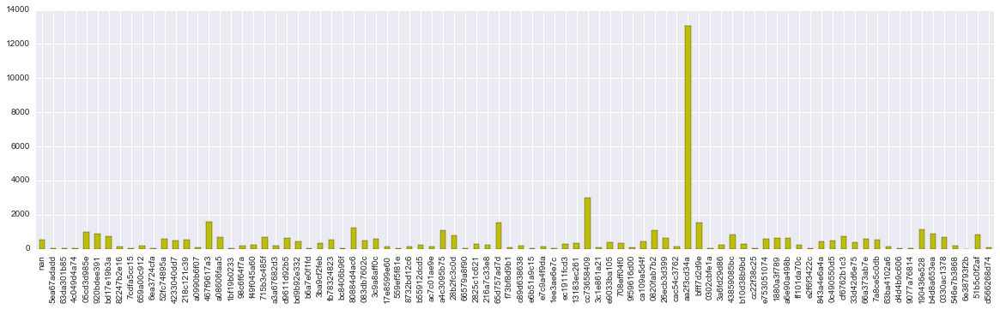

In [13]:
data['x0'].value_counts(sort=False,dropna=False).plot(kind='bar',figsize=(20, 5),color='y');# nan тоже учитываем

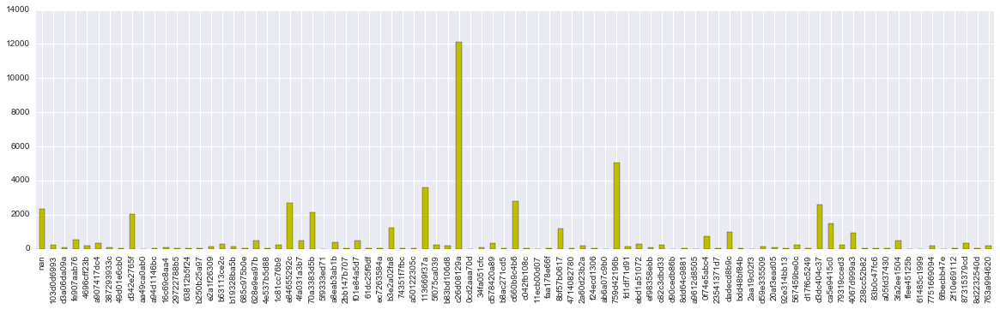

In [14]:
data['x17'].value_counts(sort=False,dropna=False).plot(kind='bar',figsize=(20, 5),color='y');# nan тоже учитываем

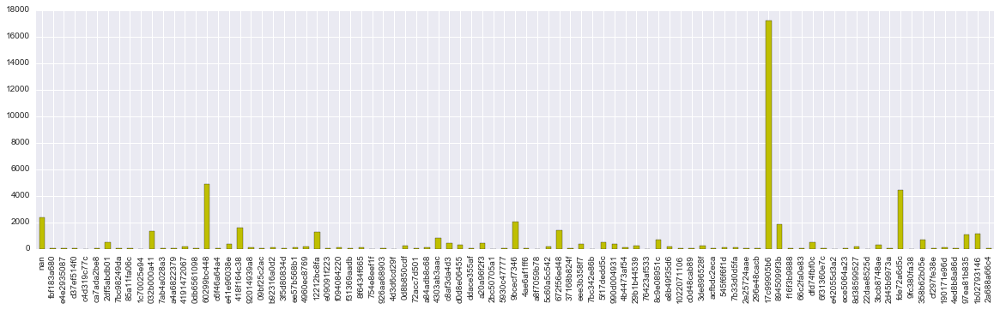

In [15]:
data['x20'].value_counts(sort=False,dropna=False).plot(kind='bar',figsize=(20, 5),color='y');# nan тоже учитываем

При этом понятно, что совершенно не обязательно Билайн выгрузил объекты в датасет пропорцианально количеству абонентов в регионах.

Посмотрим как распределены другие категориальные признаки.

100%|██████████████████████████████████████████| 19/19 [00:34<00:00,  4.46s/it]


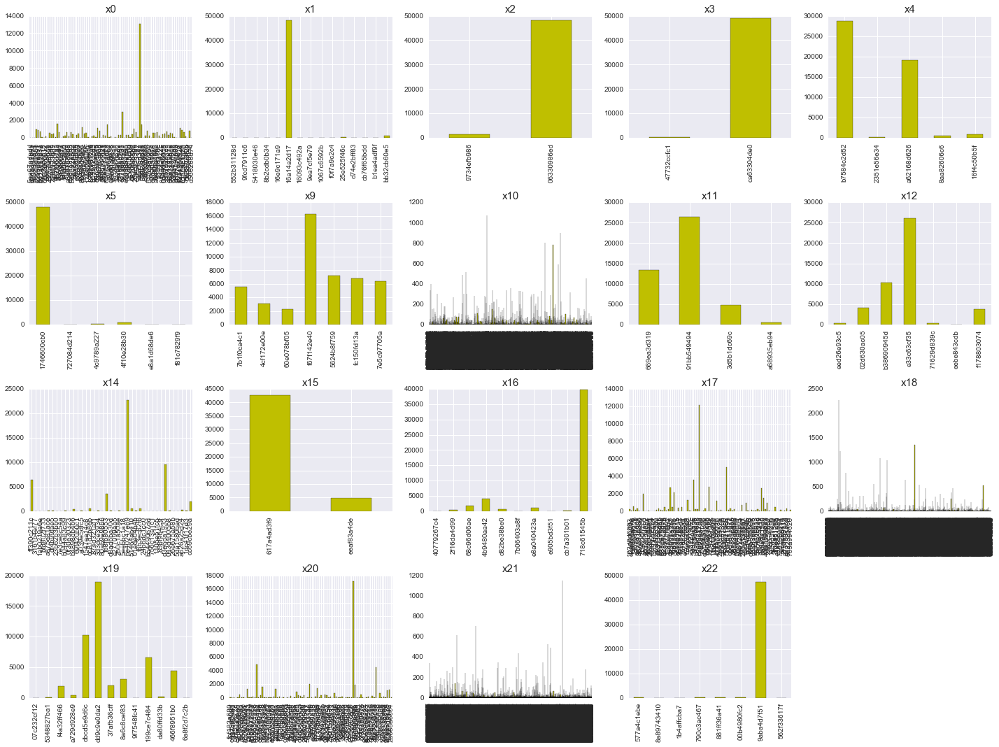

In [16]:
from tqdm import tqdm # pip install tqdm – замер времени выполнения итераций цикла
k=1
for features in tqdm(cat_features):
    plt.figure(1,figsize=(20,15))    
    plt.subplot(4,5,k)
    data[features].value_counts(sort=False).plot(kind='bar',color='y');
    plt.title(features,fontdict={'fontsize':15})
    k+=1
plt.tight_layout() 
plt.show()

Обратим внимание наличие бинарных категориальных признаков, т.е. категориальных признаков с 2 уникальными значениями - х2, х3, х15

Выше были сгруппированны вещественные признаки по количеству одинаковых значений (без nan) 

x8, x13

x23-x39

x40-x42

x43-x54

x55-x61

Всего 6 типов подкатегорий. Рассмотрим распределения каждой подкатегории.

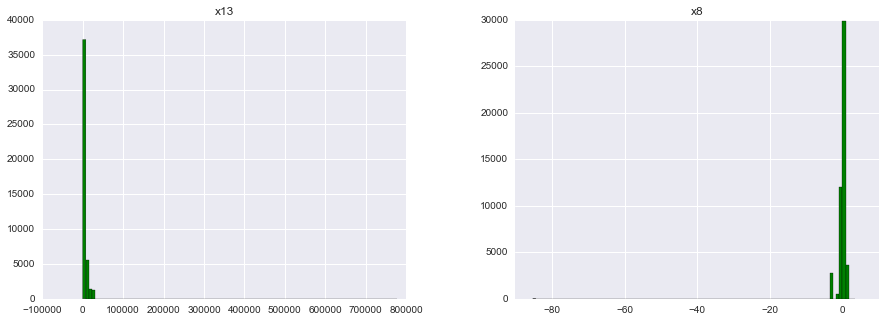

In [16]:
data.ix[:, ['x8','x13']].hist(figsize=(15, 5),bins=100,color='g');

На текущем графике хорошо заметно наличие выбросов у признаков х8, х13

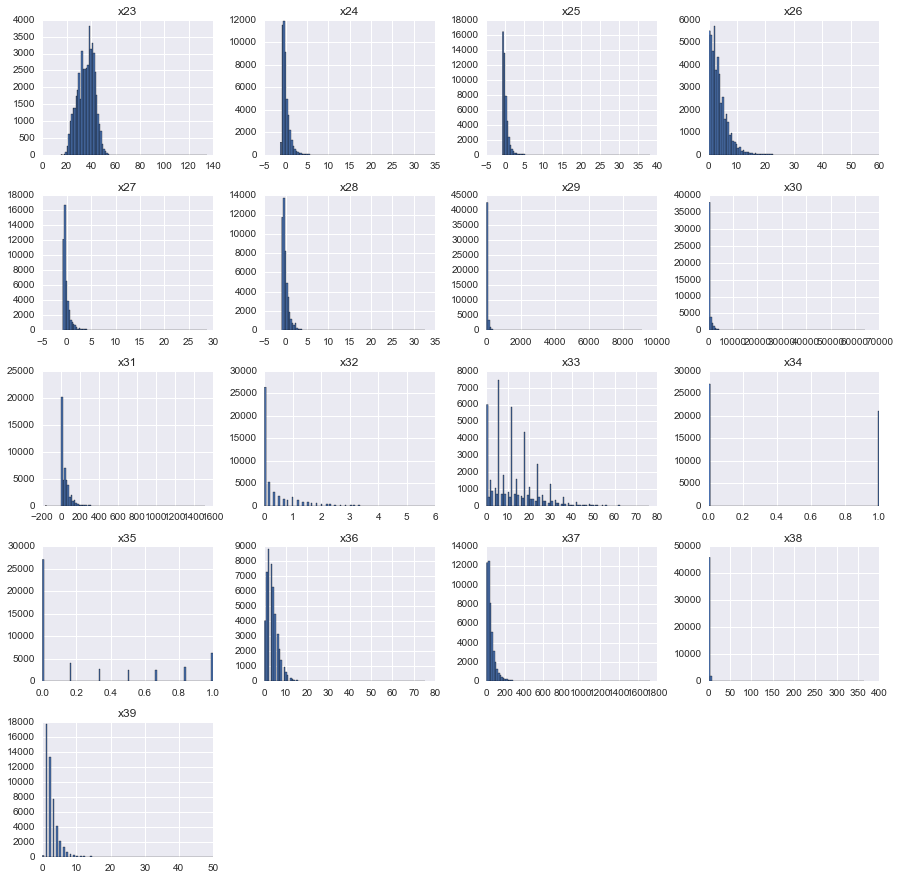

In [17]:
data.ix[:, 'x23':'x39'].hist(figsize=(15, 15),bins=100);

Анализируя визуально плотность распеределения относительно средних значений можно заметить выбросы в данных у следующих признаков

х31 - как содержащие отрицательные значения, 

х29,х30,х31,х37,х38,x39 - как содержащие достаточно большие значения.

Признак х35 - номинальный, а не количественный

In [18]:
print(data['x35'].value_counts())

0.000000    27072
1.000000     6356
0.166667     4078
0.833333     3067
0.333333     2638
0.666667     2491
0.500000     2419
0.200000        1
Name: x35, dtype: int64


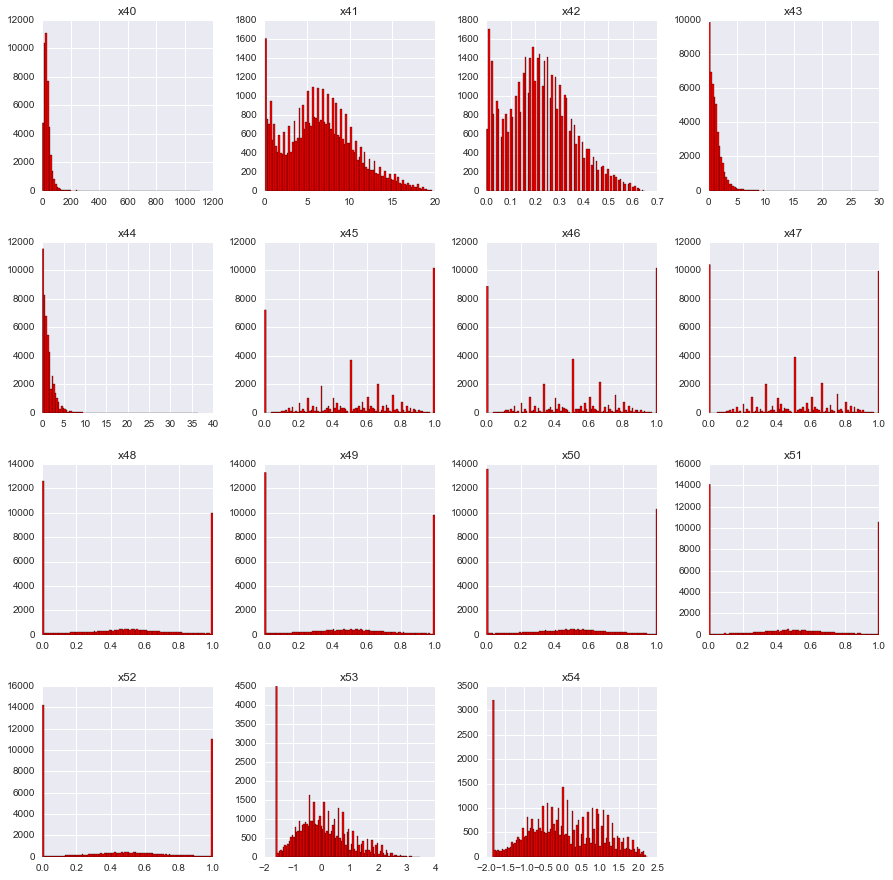

In [19]:
data.ix[:, 'x40':'x54'].hist(figsize=(15, 15),bins=100,color='r');

Для признаков х48-х52 - бимодальное распределение

Для признаков х53-х54 - высокая концентрация значений у левого хвоста распределения

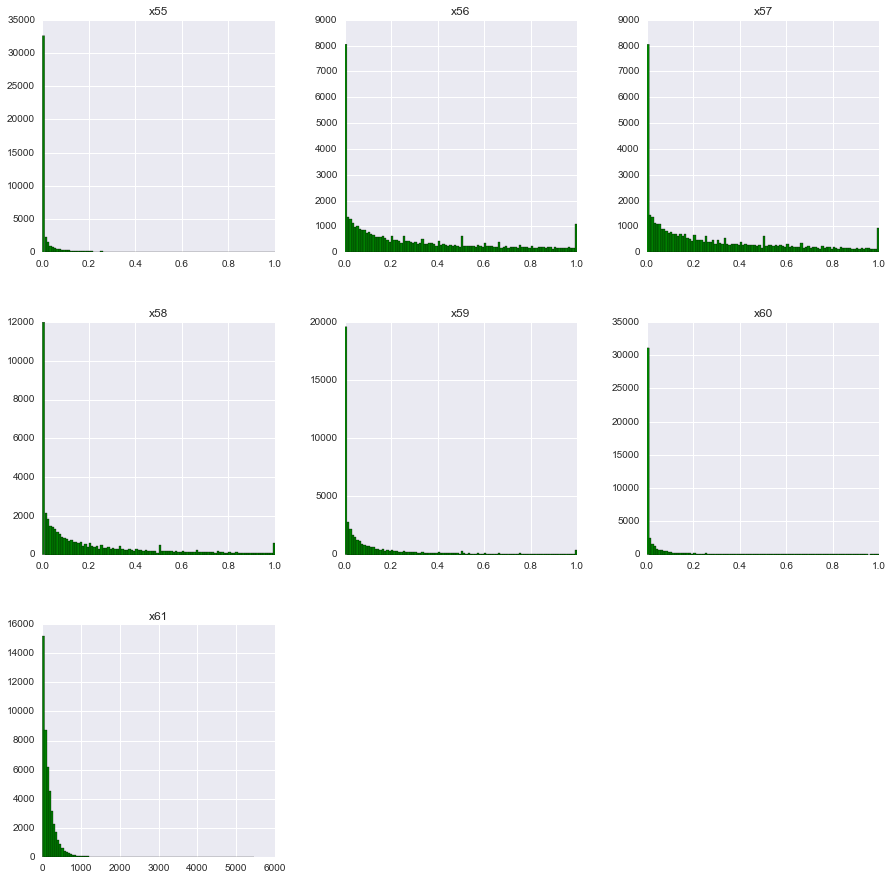

In [20]:
data.ix[:, 'x55':'x61'].hist(figsize=(15, 15),bins=100,color='g');

Заметна сильная концентрация значений около нуля - возможно стоит попробовать сделать категориальный признак: 

0- значение равно 0, 1- значение не равно 0

Далее расмотрим  соотношение категориальных/вещественных переменных относительно целевой переменной класса.
Будем искать признаки с распределением относительно целевой переменной сильно отличающееся от самого распеределения целевой переменной.

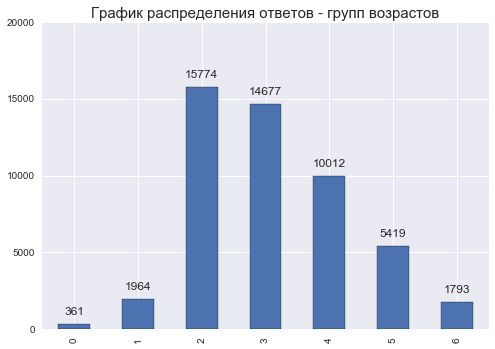

In [21]:
ax=data['y'].value_counts(sort=False).plot(kind='bar');
rects = ax.patches
labels = data['y'].value_counts(sort=False)
figsize(12, 10)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 500, label, ha='center', va='bottom')
    
plt.title(u"График распределения ответов - групп возрастов",fontsize=15);
plt.ylim(0,20000);

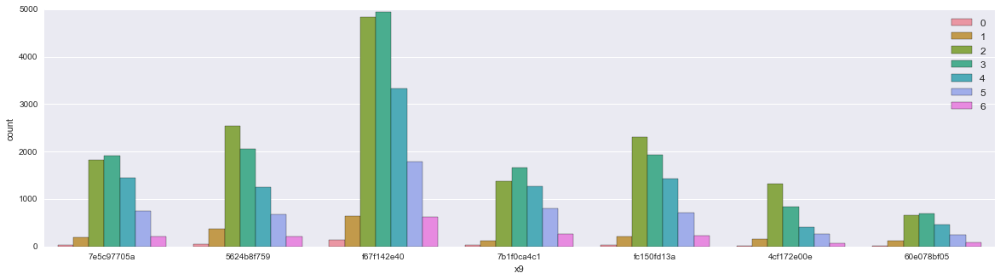

In [22]:
plt.figure( figsize=(20,5))
sns.countplot(x='x9', hue='y', data=data);
sns.set(font_scale=1.2)
plt.legend(loc='upper right');

Чтобы не мельчить на графике, ограничимся категориальными прихнаками которые имеют до 10 уникальных значений

100%|██████████████████████████████████████████| 19/19 [00:01<00:00, 10.18it/s]


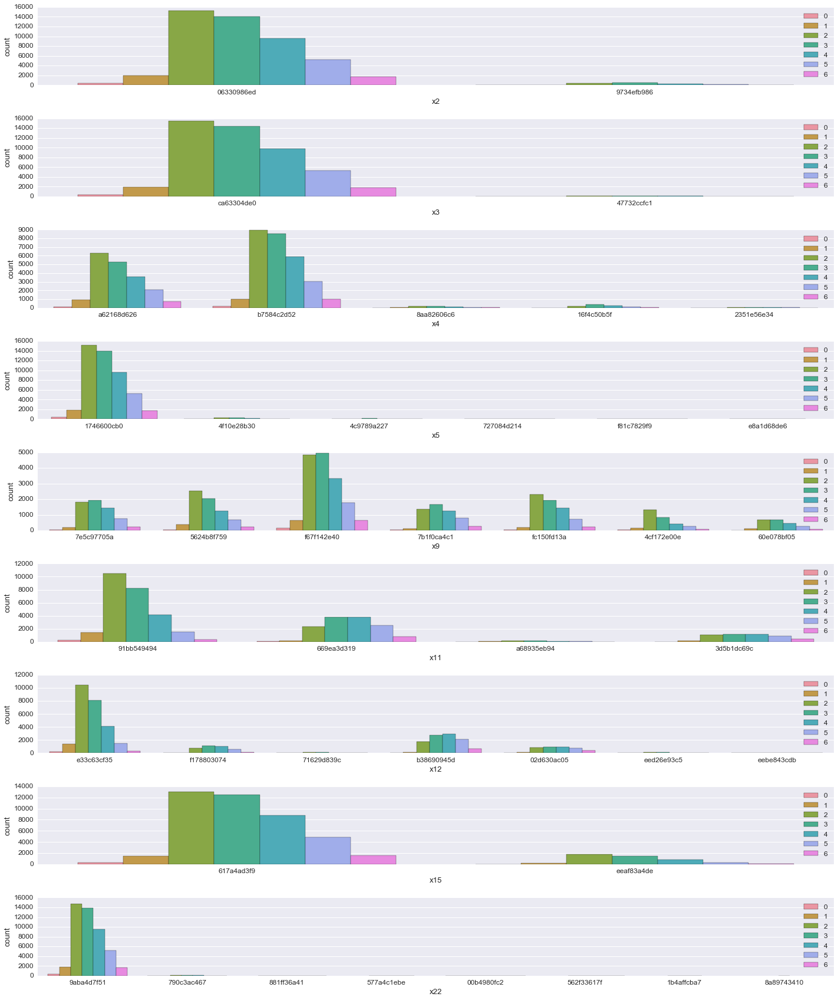

In [24]:
k=1
for features in tqdm(cat_features):
    plt.figure(1,figsize=(20,60))  
    if len(data[features].value_counts())<10:        
        plt.subplot(23,1,k)        
        sns.countplot(x=features, hue='y', data=data);
        sns.set(font_scale=1.2);
        plt.legend(loc='upper right');
        k+=1
plt.tight_layout() 
plt.show()

Визуализируем признаки попарно. Построим scatterplot для пар вещественных признаков. Указать параметр hue = дискретный целевой признак, то разные его значения будут отображаться разными цветами. Удалим пропуски поскольку pairplot не работает с пропусками.

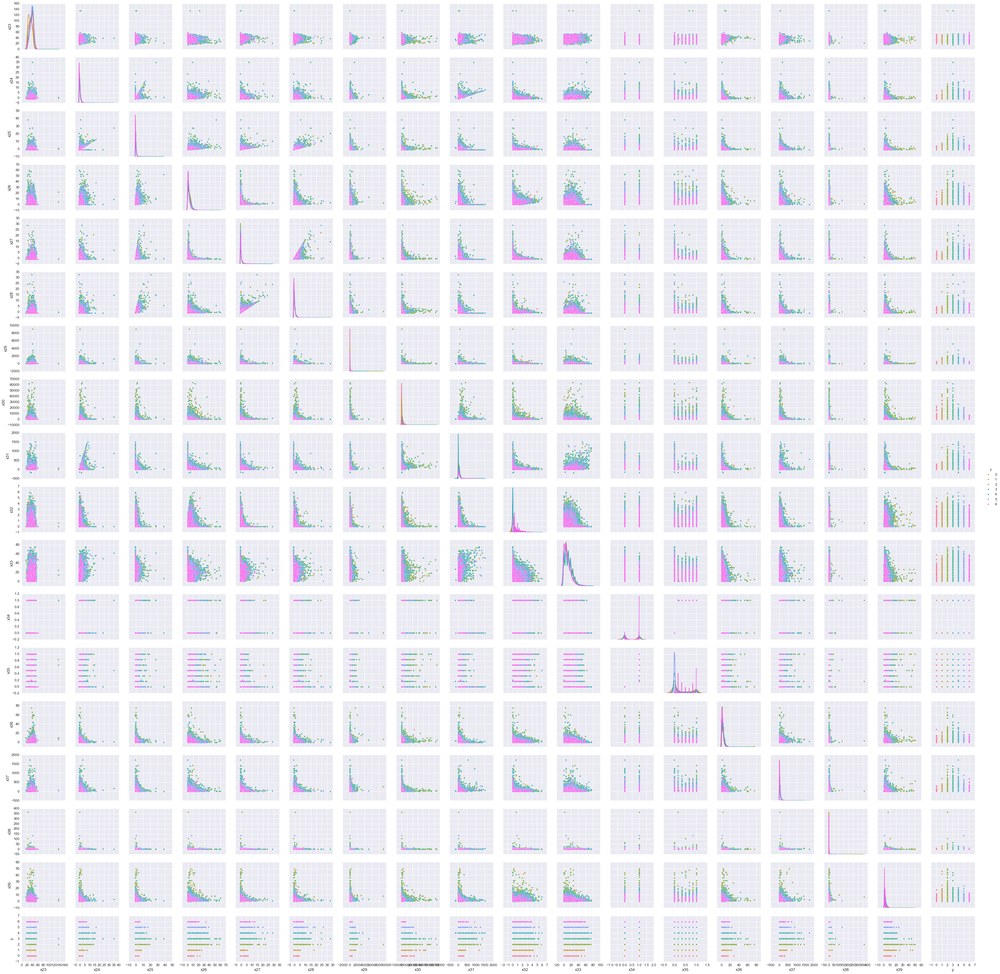

In [25]:
#GOOGLE max must be larger than min in range parameter
#http://stackoverflow.com/questions/20656663/matplotlib-pandas-error-using-histogram
#http://seaborn.pydata.org/generated/seaborn.pairplot.html

data_pairplot=pd.concat([data.ix[:, 'x23':'x39'],data['y']], axis=1)
data_pairplot.dropna(inplace=True)
sns.pairplot(data_pairplot,diag_kind="kde",hue='y');

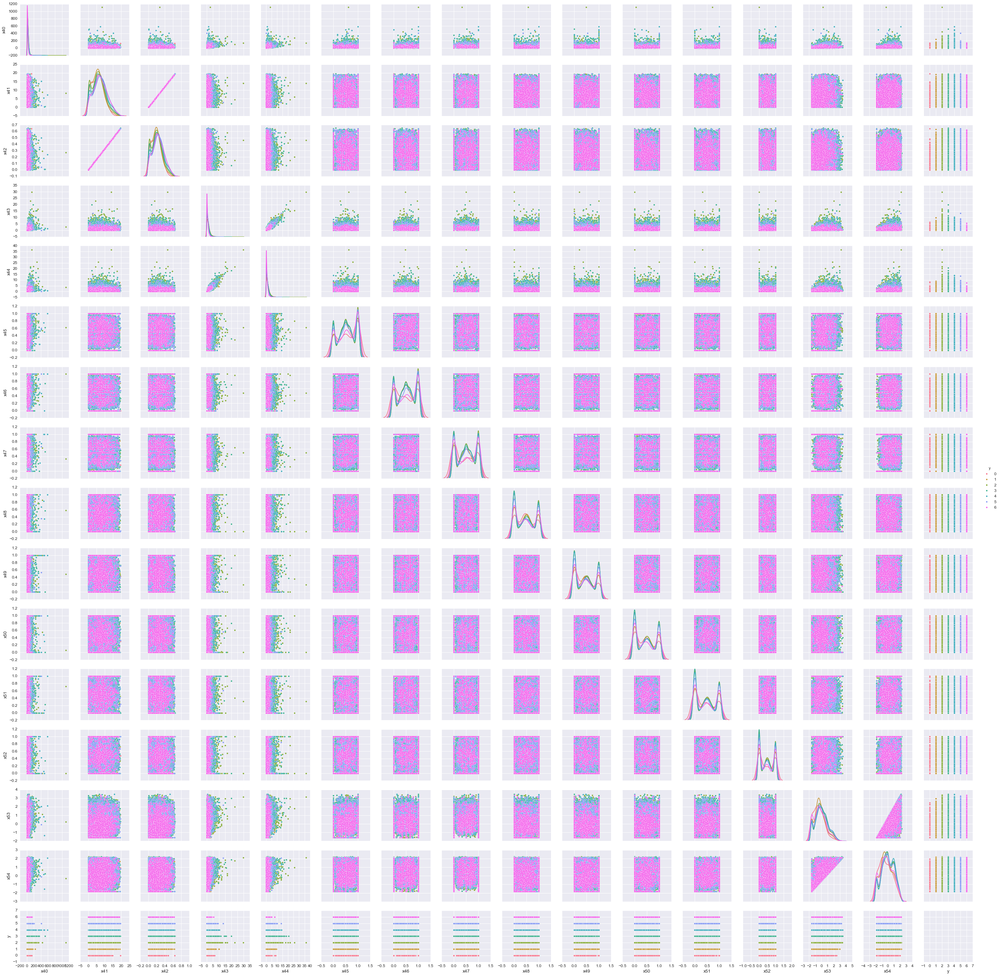

In [26]:
data_pairplot=pd.concat([data.ix[:, 'x40':'x54'],data['y']], axis=1)
data_pairplot.dropna(inplace=True)
sns.pairplot(data_pairplot,diag_kind="kde",hue='y');

Следует понимать, что pairplot закрашивает область распределения значений последовательно, и последнее значение целевой в переменной будет в 'верхнем слое' рисунка закрашивая собой остальные предшествующие значения целеых переменных у объектов.

Рассмотрим попарные распределения некоторых признаков отдельно - х41-х42, х43-х44

In [23]:
from matplotlib.colors import ListedColormap
colors=ListedColormap(['b','g','r','c','m','y','w'])
def scatter_def(x1,x2):
    sns.pairplot(data,x_vars=[x1],y_vars=[x2],size=6, hue="y");
    #plt.scatter(data[x1],data[x2],alpha=0.7,c=data['y'],cmap=colors)
    plt.xlabel(x1)
    plt.ylabel(x2)
    plt.xlim(min(data[x1]),max(data[x1]))
    plt.ylim(min(data[x2]),max(data[x2])*1.1) 

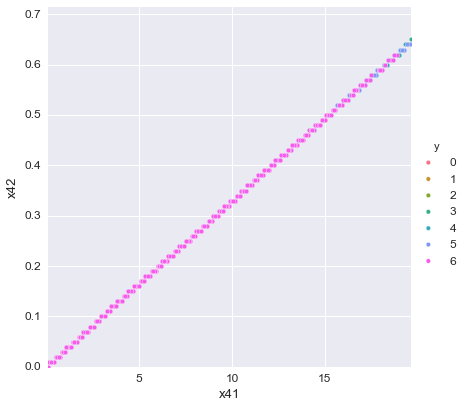

In [24]:
scatter_def('x41','x42')

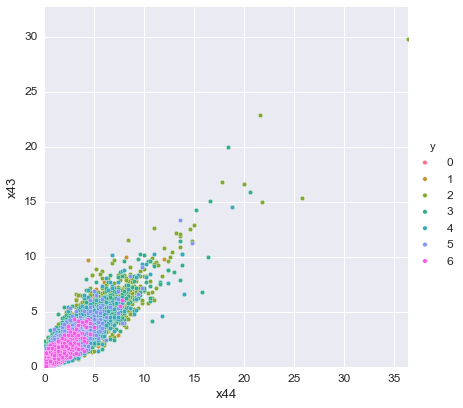

In [25]:
scatter_def('x44','x43')

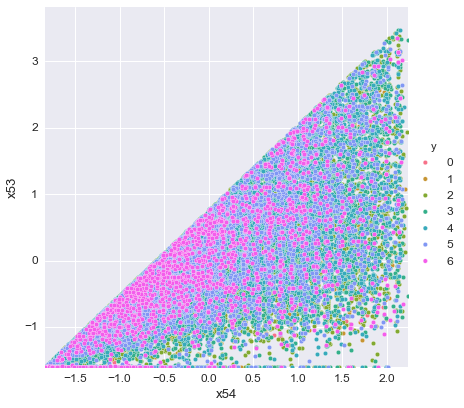

In [26]:
scatter_def('x54','x53')

Признаки  х41-х42, х43-х44 по всей видимости имеют высокую корреляцию. 

Сумма признаков x54, x53 - может быть сконцентрирована у определенного числа.

-3.439006    2725
 0.000000    2156
-3.439008       5
-3.438980       5
-3.438975       5
dtype: int64

 2.693980    1
-3.119476    1
-1.390669    1
-1.820780    1
 1.705747    1
dtype: int64

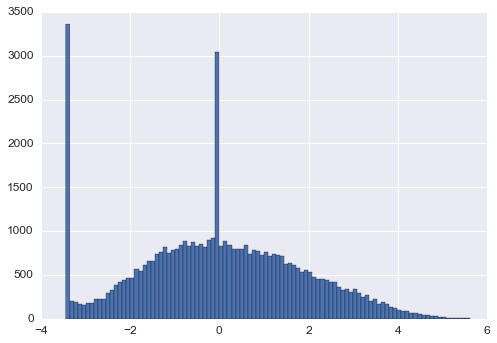

In [28]:
data_sum_x53_x54=data.ix[:, 'x53':'x54'].sum(axis=1)
display(data_sum_x53_x54.value_counts().head())
# повтор значений 1 связан по  всей видимости с округлениями
display (data_sum_x53_x54.value_counts().tail())
data_sum_x53_x54.hist(bins=100);

In [29]:
del data_sum_x53_x54 # освободим память

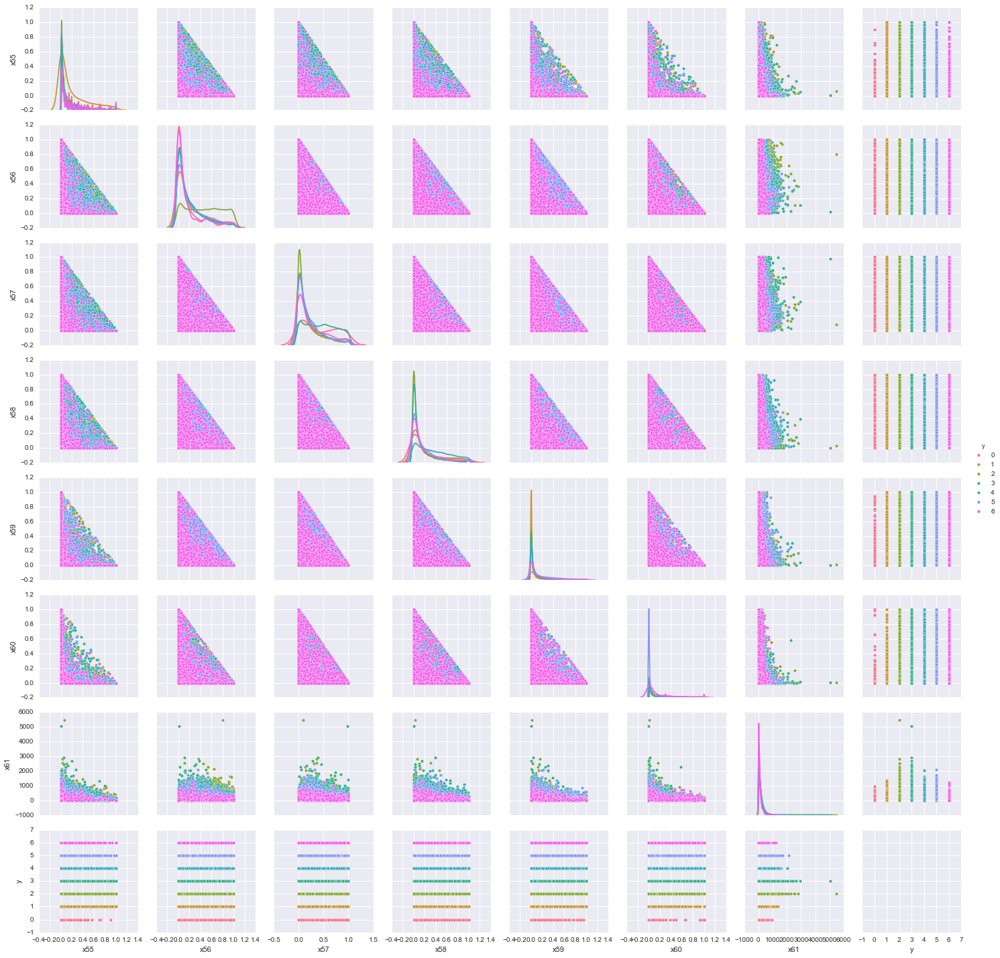

In [13]:
data_pairplot=pd.concat([data.ix[:, 'x55':'x61'],data['y']], axis=1)
data_pairplot.dropna(inplace=True)
sns.pairplot(data_pairplot,diag_kind="kde",hue='y');

Треугольник в виде площади  попарного распределения признаков х55-х60 говорит о том, что папарная сумма признаков равна 1. Проверим предположение, что сумма признаков х55-х60 =1.

1.0    37222
1.0     5962
0.0     3874
1.0     2025
1.0      744
dtype: int64

0.652510    1
0.997917    1
0.983471    1
0.996700    1
0.860465    1
dtype: int64

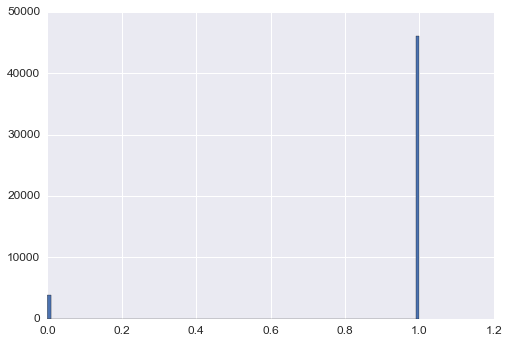

In [30]:
sum_x55_x60=data.ix[:, 'x55':'x60'].sum(axis=1)
display(sum_x55_x60.value_counts().head())
# повтор значений 1 связан по  всей видимости с округлениями
display (sum_x55_x60.value_counts().tail())
sum_x55_x60.hist(bins=100);

Продолжим анализ числовых признаков. Рассмотрим бинарные признаки.

In [31]:
data_discrete=data[discrete_features]
data_discrete.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_discrete.csv',index=False)
data_discrete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
x6    50000 non-null int64
x7    50000 non-null int64
dtypes: int64(2)
memory usage: 781.3 KB


In [32]:
data_test_discrete=data_test[discrete_features]
data_test_discrete.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_discrete.csv',index=False)
#del data_test_discrete

Заметим, что в этих признаках нет пропусков. 

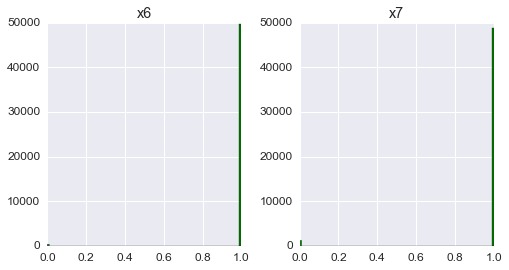

In [33]:
data_discrete.hist(figsize=(8, 4),bins=100,color='g');

Наиболее интересно рассмотреть распределение целевой переменной для наименее представленого значения 0 в признаках

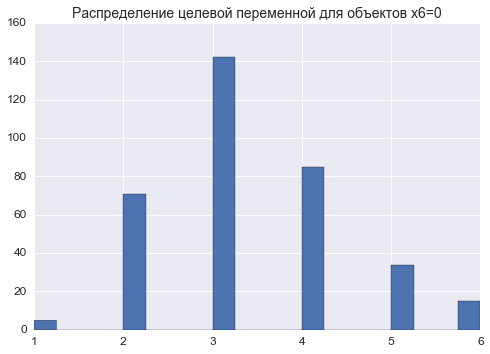

In [34]:
data[data['x6']==0].hist('y', bins=20);
plt.title('Распределение целевой переменной для объектов x6=0',fontsize=14);

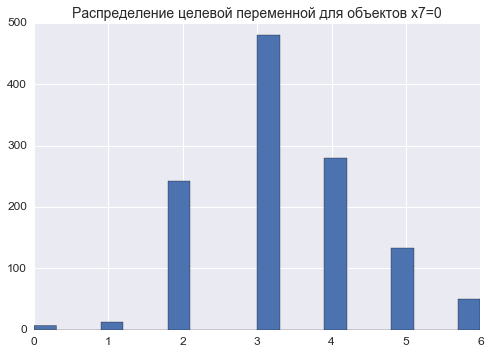

In [35]:
data[data['x7']==0].hist('y', bins=20);
plt.title('Распределение целевой переменной для объектов x7=0',fontsize=14);

Посмотрим корреляцию Пирсона между количественными признаками

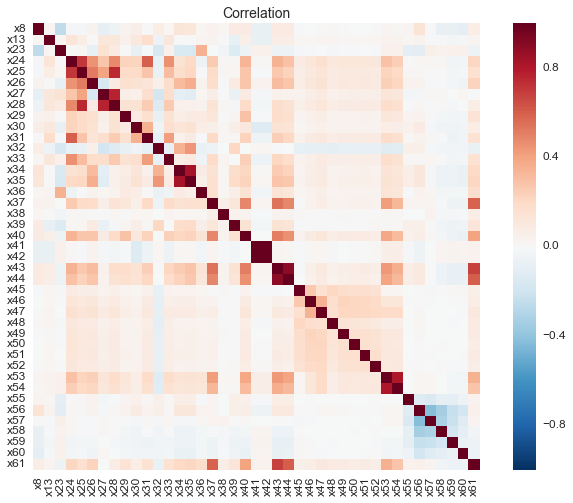

In [36]:
plt.figure(figsize=(12, 8))
plt.title('Correlation',fontsize=14);
# square=True делает квадратной
sns.heatmap(data[real_features].corr(),square=True,cbar=True,cmap='RdBu_r'); # _r значит реверсная карта в цветах

Пары признаков с максимальными коэффициентами корреляции

In [37]:
max_corr=pd.concat([data[real_features].corr().replace(1,0).idxmax(axis=0),\
                     data[real_features].corr().replace(1,0).max(axis=0)], axis=1).reset_index()
max_corr.columns = ['x', 'y','corr']
max_corr_list=max_corr.sort(columns='corr',ascending=False).reset_index(drop=True)[:15].values.tolist()
max_corr[::2].sort(columns='corr',ascending=False).reset_index(drop=True)[:15]
# убираем повторяющиеся через  раз значения -::2
#https://habrahabr.ru/post/207988/

,x,y,corr
0,x41,x42,0.999763
1,x43,x44,0.895851
2,x35,x34,0.829966
3,x53,x54,0.805284
4,x27,x28,0.772158
5,x25,x28,0.754211
6,x61,x43,0.680915
7,x31,x24,0.599748
8,x37,x61,0.586752
9,x33,x24,0.454197


####  Предобработка данных - категориальных признаков

Для того чтобы рассмотреть визуально папарные распределения категориальных переменных необходимо предобработать пропуски, поскольку plt.imshow не работает с Nan. Предположим что пропуски в данных расположены в какой то упорядоченной манере, т.е. их можно заменить на какое новое значение (а не эмулировать из соседних объектов)

In [38]:
data_cat=data[cat_features]
data_cat.fillna('Missing',inplace=True)

data_cat_set=set(data_cat.values.flatten())
print(len(data_cat_set))

9811


Поскольку категориальные переменные будут раскладываться в дамми-переменные, 
чтобы не засорять датасет большим количеством дамми- переменных нужно уменьшить  количество
уникальных переменных объединив их в одну. Критерием объединения выберем минимальную долю целевой переменной,
все категоральные переменные доля которых меньше минимальной доли одного из значений целевой переменной будут записаны в одну - 'Rare'

In [39]:
data['y'].value_counts()/len(data)

2    0.31548
3    0.29354
4    0.20024
5    0.10838
1    0.03928
6    0.03586
0    0.00722
Name: y, dtype: float64

В качестве ограничивающего коэффициента выбираем level_Rare=0.007.

Рассмотрим признак x21 с 4237 уникальных переменных.

In [40]:
level_Rare=0.007
data_cat['x21'].value_counts(dropna=False).sort_values(ascending=False)[:10]/len(data)

Missing       0.04756
64ebc0a062    0.02298
e3c03ca55c    0.01414
0fc56ea1f0    0.01230
c6b4ad548f    0.01056
b1407db9a8    0.00978
c9eae35966    0.00866
82a0e4c048    0.00694
fadc90b449    0.00694
99f6ada51c    0.00676
Name: x21, dtype: float64

Видно, что в признаке x21 уже после десятой отсортированной по количеству уникальной переменной её доля меньше level_Rare.
Заменим значения в оставшихся признаках.

In [41]:
for col in cat_features:    
    if len(data[col].value_counts())>2: 
        d=(data_cat[col].value_counts(dropna=False).sort_values()/len(data))
        data_cat[col]=data_cat[col].apply (lambda x : 'Rare' if d[x] <=level_Rare else x)   

In [42]:
data_cat_set=set(data_cat.values.flatten())
data_cat_set.remove('Rare') # для тестовой выборки критерием 'Rare' будет не level_Rare, а непопадание в data_cat_set
print(len(data_cat_set))

168


In [43]:
data_test_cat=data_test[cat_features]
data_test_cat.fillna('Missing',inplace=True)

data_test_cat_set=set(data_test_cat.values.flatten())
print(len(data_test_cat_set))

9806


Поскольку у нас нет гарантии что в тренировочной и тестовой выборках есть одинаковое количество категориальных переменных реализуем алгоритм который заменит лишние переменные в тестовой выборке на значения  'Rare' так чтобы количество переменных в data_cat и data_test_cat совпало

In [44]:
data_test_cat=data_test[cat_features]
data_test_cat.fillna('Missing',inplace=True)

level_Rare=0.007
for col in cat_features:    
    if len(data_test[col].value_counts())>2: 
        d=(data_test_cat[col].value_counts(dropna=False).sort_values()/len(data_test))
        data_test_cat[col]=data_test_cat[col].apply (lambda x : 'Rare' if x not in data_cat_set else x)  
        
data_test_cat_set=set(data_test_cat.values.flatten())
print(len(data_test_cat_set))

169


In [45]:
set.difference(data_cat_set,data_test_cat_set)

set()

In [46]:
data_cat.describe(include='all').T

,count,unique,top,freq
x0,50000,41,aa2f3cd34a,13090
x1,50000,4,16a14a2d17,48103
x2,50000,3,06330986ed,48145
x3,50000,3,ca63304de0,49085
x4,50000,6,b7584c2d52,28653
x5,50000,5,1746600cb0,47980
x9,50000,8,f67f142e40,16313
x10,50000,12,Rare,38698
x11,50000,5,91bb549494,26401
x12,50000,7,e33c63cf35,26098


In [47]:
def cat_imshow(x,y,data):
    crosstab_fd=pd.crosstab(data[y], data[x])
    # применили ко всей таблице сопряженности логаримф чтобы лучше отобразить imshow, 
    # иначе большая разница между мин и макс
    crosstab_fd_log=crosstab_fd.applymap(lambda x: 0 if x==0 else log(x))
    plt.figure( figsize=(15,10))
    plt.imshow(crosstab_fd_log,cmap='seismic',interpolation='none');
    plt.yticks(range(len(set(data[y]))),[n for n in sorted(set(data[y]))]) # сохраняем порядок
    plt.xticks(range(len(set(data[x]))),[n for n in sorted(set(data[x]))],rotation='vertical')
    plt.ylabel(y,fontsize=15)
    plt.xlabel(x,fontsize=15)
    plt.title(u"Распределение категориальных признаков",fontsize=15)
    plt.grid();
    max_count=pd.concat([crosstab_fd.idxmax(axis=0),crosstab_fd.max(axis=0)], axis=1).reset_index()
    max_count.columns = [x, y,'count']
    display(max_count.sort(columns='count',ascending=False).reset_index(drop=True).head())

Посмотрим теперь попарные распределения категориальных признаков. Будем внимательно смотреть за признаками у которых число уникальных значений близко к 85 - х0, х17, x20, которые могут означать регион РФ

,x1,x12,count
0,16a14a2d17,e33c63cf35,24870
1,bb32cb60e5,e33c63cf35,577
2,Rare,e33c63cf35,381
3,Missing,e33c63cf35,270


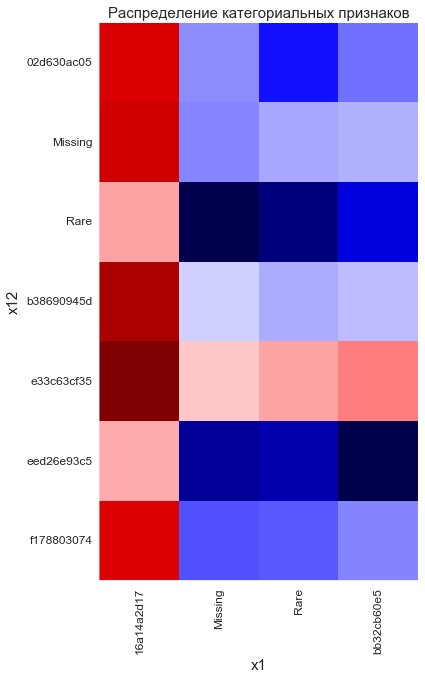

In [48]:
cat_imshow('x1','x12',data_cat)

,x0,x17,count
0,aa2f3cd34a,759d42196b,2739
1,Rare,c26d08129a,1013
2,cc73658409,Rare,788
3,65d757ad7d,c26d08129a,697
4,bfff7d2d9e,c26d08129a,635


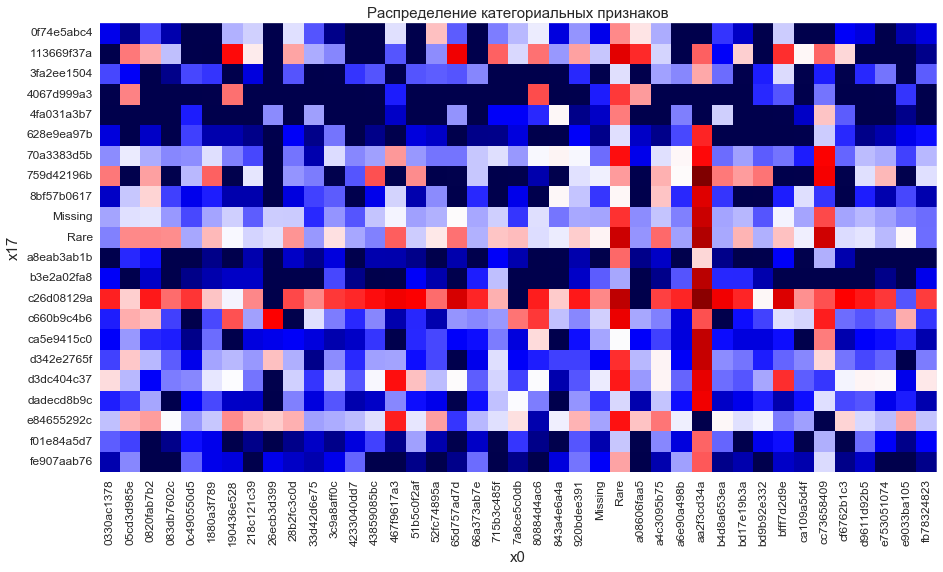

In [49]:
cat_imshow('x0','x17',data_cat)

,x0,x20,count
0,aa2f3cd34a,17c99905b6,5234
1,Rare,17c99905b6,1564
2,cc73658409,17c99905b6,1230
3,467f9617a3,17c99905b6,568
4,a4c3095b75,17c99905b6,548


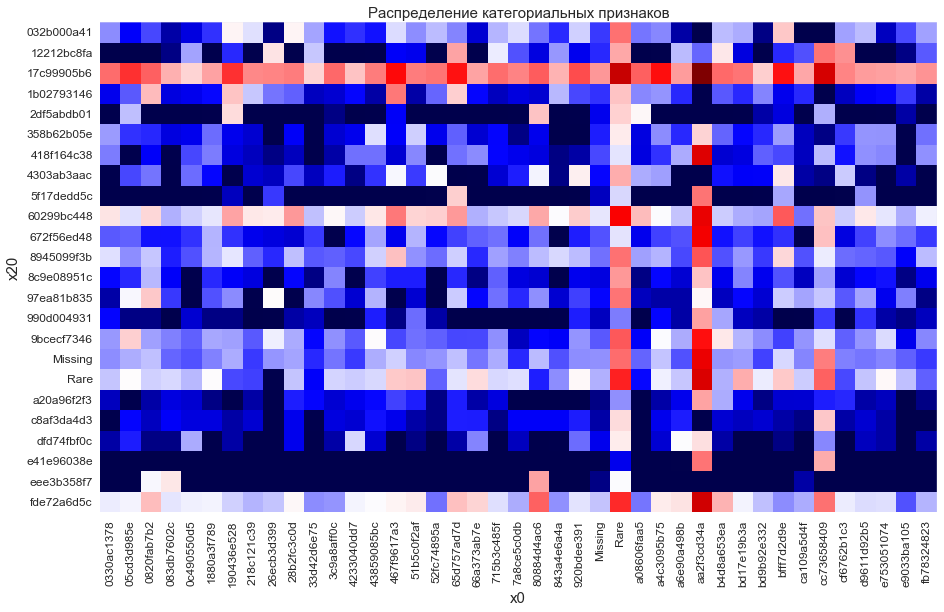

In [50]:
cat_imshow('x0','x20',data_cat)

,x17,x20,count
0,c26d08129a,17c99905b6,4012
1,Rare,17c99905b6,2029
2,759d42196b,17c99905b6,1910
3,Missing,Missing,1880
4,113669f37a,17c99905b6,1284


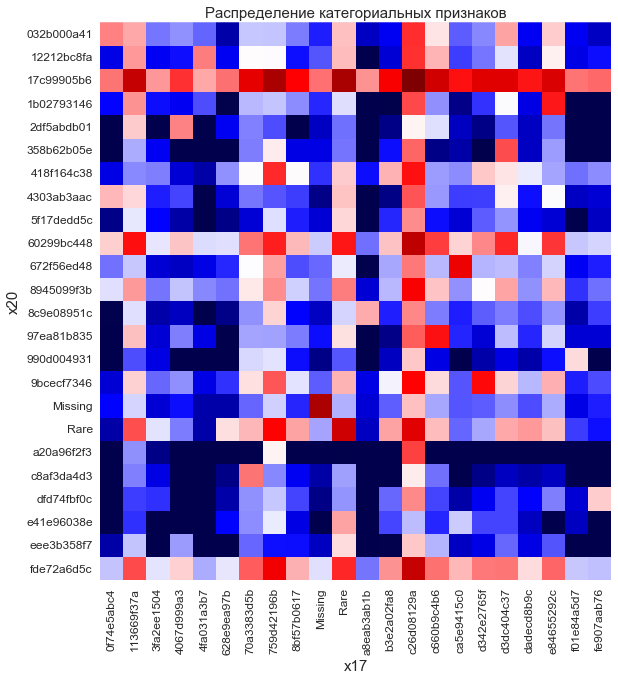

In [51]:
cat_imshow('x17','x20',data_cat)

,x0,x14,count
0,aa2f3cd34a,6e40247e69,5665
1,Rare,6e40247e69,2634
2,cc73658409,6e40247e69,1419
3,bfff7d2d9e,6e40247e69,1025
4,65d757ad7d,6e40247e69,902


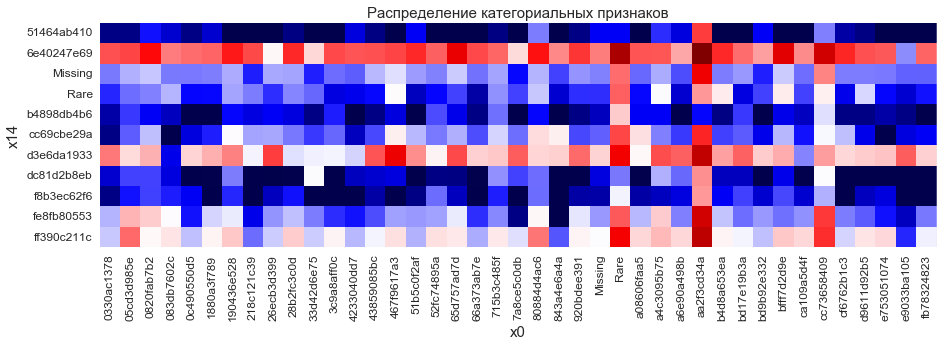

In [52]:
cat_imshow('x0','x14',data_cat)

,x19,x1,count
0,dd9c9e0da2,16a14a2d17,17985
1,dbcd5e9d6c,16a14a2d17,9899
2,199ce7c484,16a14a2d17,6580
3,466f8951b0,16a14a2d17,4421
4,8a6c8cef83,16a14a2d17,2961


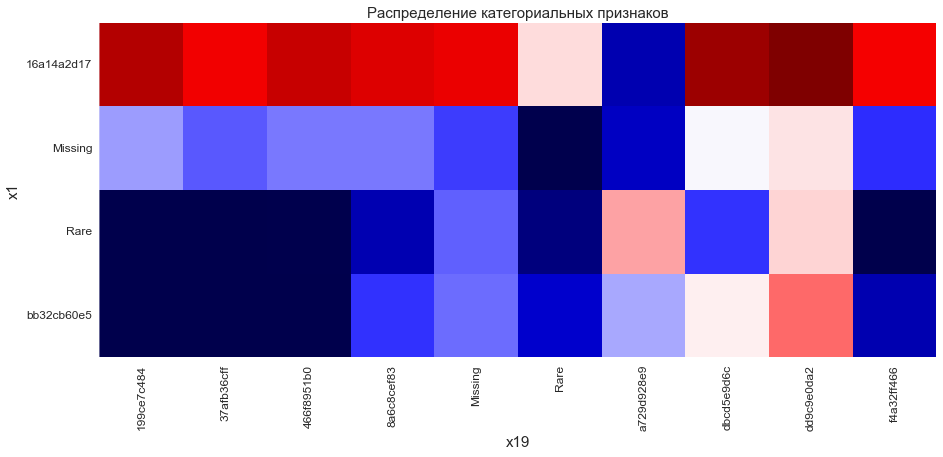

In [53]:
cat_imshow('x19','x1',data_cat)

,x20,x14,count
0,17c99905b6,6e40247e69,7854
1,60299bc448,6e40247e69,2560
2,fde72a6d5c,6e40247e69,2175
3,Missing,Missing,1886
4,Rare,6e40247e69,1760


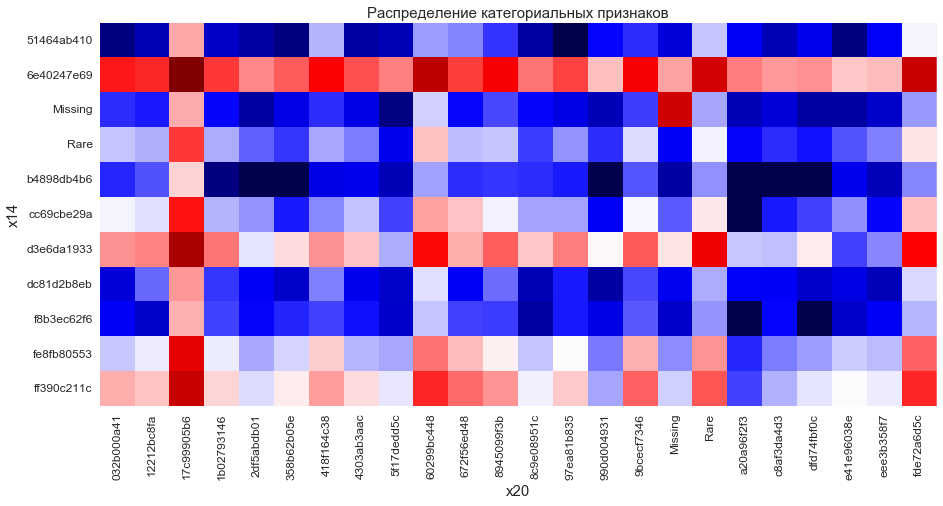

In [54]:
cat_imshow('x20','x14',data_cat)

Поскольку для категориальных переменных не удалось найти каких-то инсайтов данных преобразуем категориальные признаки в dummies  переменные

In [55]:
data_cat=pd.get_dummies(data_cat)
data_cat.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_cat.csv',index=False)
data_cat.shape

(50000, 200)

In [56]:
data_test_cat=pd.get_dummies(data_test_cat)
data_test_cat.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_cat.csv',index=False)
print (data_test_cat.shape)
#del data_test_cat

(50000, 200)


Наоболее частым является значение признака для х0- aa2f3cd34a, х20 - 17c99905b6


In [57]:
# Далее можно посмотреть корреляцию Мэтьюса между категориальными переменными

Посмотрим на сбалансированность классов 

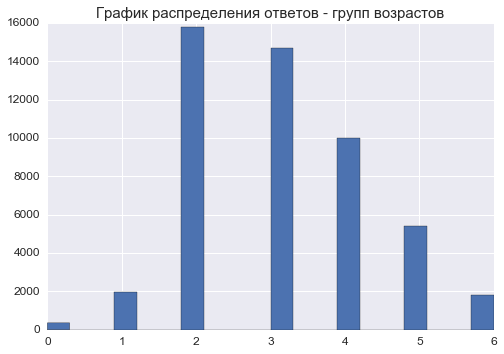

In [58]:
data.hist('y', bins=20);
plt.title(u"График распределения ответов - групп возрастов",fontsize=15);

In [59]:
print ('число уникальных значений y ',data['y'].nunique())

число уникальных значений y  7


In [60]:
data['y'].value_counts()/len(data)

2    0.31548
3    0.29354
4    0.20024
5    0.10838
1    0.03928
6    0.03586
0    0.00722
Name: y, dtype: float64

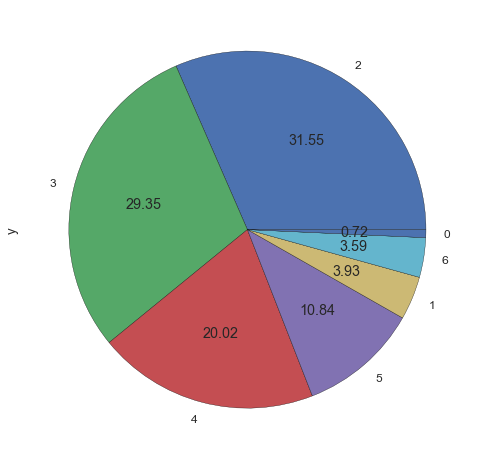

In [61]:
series_y=data['y'].value_counts()/len(data)
series_y.plot.pie(figsize=(8, 8),autopct='%.2f');

Посмотрим как распределен целевой признак у объектов с nan

In [62]:
objects_with_nan_cat = data.index[np.any(data.isnull().values,axis=1)]
data_nan_cat=data.loc[data.index.isin(objects_with_nan_cat)]
data_nan_cat.shape

(17239, 63)

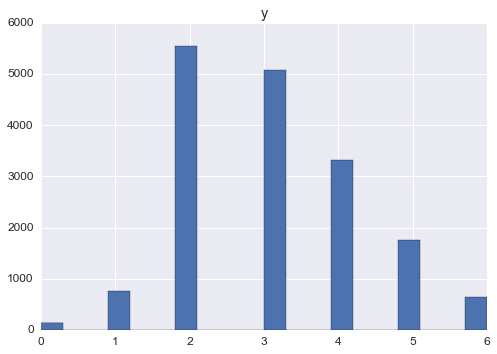

In [63]:
data_nan_cat.hist('y', bins=20);

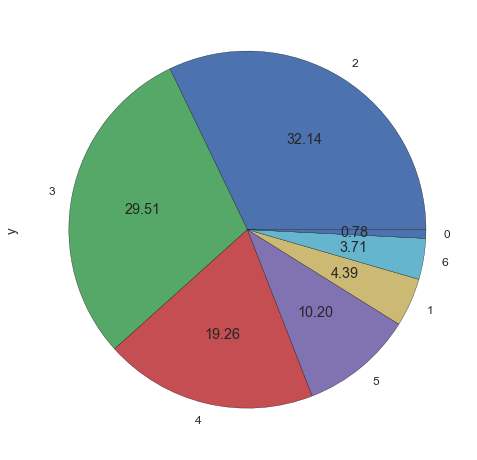

In [64]:
series_y=data_nan_cat['y'].value_counts()/len(data_nan_cat)
series_y.plot.pie(figsize=(8, 8),autopct='%.2f');

Распределение целевого признака у объектов с Nan совпадает с распределением всего датасета.

###  Часть 4. Закономерности, "инсайты", особенности данных

Поскольку признаки анонимизированы можно только предполагать о том, как одни признами взаимодействуют с другими

* целевой признак представляет собой возраст абонентов, классы целевого признака пронумерованы по мере увеличечения возраста. Т.е. классу 6 соответсвует самый  большой возрастиз всех классов
* количественные признаки имеют сильные выбросы
* признаки x55-x60 возможно представляют собой долю потребления различных услуг оператора  (x55 + ... + x60 = 1), то что такие признаки есть указано в задании
* признаки x54-x53 возможно каким
* линейная зависимость (на основе коэффициента корреляции Пирсона) между некоторыми количественными признаками -  для x41 и x42 коэффициент почти равен 1, также сильно коррелируют признаки x43-x44 0.895851, x35-x34 0.829966, x53-x54 0.805284
* в категориальных признаках сложно выделить признаки которые являлись бы регионом, тарифным планом, типом тарифного плана

###  Часть 5. Предобработка данных 

Категориальные признаки ранее были предобработаны. Попробуем деанонимизировать категориальные признаки.

Компания Билайн представлена во многих регионах России поэтому было бы логично увидеть в качестве
категориальной переменной - субъект РФ. По количеству уникальных переменных это могут быть признаки 
x0, x17, x20  деанонимизируем эти признами в числовые значения.

In [65]:
# http://matworld.ru/calculator/perevod-chisel.php
# переконвертируем все категориальные признаки в числа
hex2dec = {d: i for i, d in enumerate('0123456789abcdef')}
def hex2int(hexstr):
    n = 0
    for h in hexstr:    
        n = n*16 + hex2dec[h.lower()]
    return n

In [66]:
deanonimiz_data=data[['x0','x17','x20']]
deanonimiz_data.fillna('0',inplace=True)
deanonimiz_data=deanonimiz_data.applymap(hex2int)
deanonimiz_data.head()

,x0,x17,x20
0,776728892394,835052901018,102166496694
1,302788253603,907360237151,116005613894
2,107444888872,859735702835,408422374748
3,290003649980,835052901018,1090505043292
4,707646806901,997612398892,102166496694


Предположим что деанонимированные в числовые переменные значения имеют следующую структуру -

какой то код агрегации - def-код (3 знака) - ХХХ-ХХ-ХХ. 
Отрежем последние 10 знаков/цифр, оставив только первые 2-3 цифры

In [67]:
deanonimiz_data=deanonimiz_data.applymap(lambda x: x//10000000000)
deanonimiz_data.head()

,x0,x17,x20
0,77,83,10
1,30,90,11
2,10,85,40
3,29,83,109
4,70,99,10


In [68]:
deanonimiz_data['x0'].value_counts()[:10]

73    13090
87     3168
10     1835
43     1733
3      1591
30     1588
82     1523
35     1422
55     1384
70     1268
Name: x0, dtype: int64

In [69]:
deanonimiz_data['x17'].value_counts()[:10]

83    12123
50     5193
90     4679
7      3596
85     3027
99     2711
0      2350
48     2153
86     1500
27     1394
Name: x17, dtype: int64

In [70]:
deanonimiz_data['x20'].value_counts()[:10]

10     17306
41      4859
109     4454
28      2613
0       2339
66      2065
58      1860
65      1460
44      1450
1       1312
Name: x20, dtype: int64

In [71]:
deanonimiz_data.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\deanonimiz_data.csv',index=False)

Видно, что наиболее часто встречающиеся деанономизированные значения соответвствуют не самым населенным регионам РФ.

73 - Ульяновская область

83 - Кабардино-Балкария

10 - Амурская область

Поэтому по всей видимости получить какую то информацию из категориальных признаков не получится.

In [72]:
deanonimiz_data_test=data_test[['x0','x17','x20']]
deanonimiz_data_test.fillna('0',inplace=True)
deanonimiz_data_test=deanonimiz_data_test.applymap(hex2int).applymap(lambda x: x//10000000000)

deanonimiz_data_test.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\deanonimiz_data_test.csv',index=False)
#del deanonimiz_data_test

Пронализируем выборку на наличие выбросов. Анализировать будем датасет без категориальных признаков.

In [73]:
# lesson7_part5_habr_girls
from sklearn import svm
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

Зададим процент "выбросов". Ищем 1% выбросов в данных, т.е. приблизительно 500 объектов выборки. (Переменные в Python, записанные в верхнем регистре, символизируют константы и обычно записываются в начале файла после подключения модулей).

In [74]:
OUTLIER_FRACTION = 0.01

Масштабируем данные. Выделяем в них две главные компоненты

In [92]:
from sklearn.preprocessing import Imputer
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
# ищем выбросы только у количественных переменных

missing=Imputer(missing_values='NaN',strategy="median",axis=0)# median
data_outliers_not_missing= pd.DataFrame(missing.fit_transform(data.drop(cat_features,axis=1)),\
                                     columns=[x for x in data.drop(cat_features,axis=1).columns])

data_outliers_not_missing = scaler.fit_transform(data_outliers_not_missing)
data_PCA = PCA(n_components=2).fit_transform(data_outliers_not_missing)

Для обнаружения «выбросов» в данных используем одноклассовую машину опорных векторов. Создаем SVM классификатор с гауссовым ядром. "Скармливаем" ему данные.

In [64]:
svm_clf = svm.OneClassSVM(kernel="rbf",verbose=1)
svm_clf.fit(data_PCA)

[LibSVM]

OneClassSVM(cache_size=200, coef0=0.0, degree=3, gamma='auto', kernel=u'rbf',
      max_iter=-1, nu=0.5, random_state=None, shrinking=True, tol=0.001,
      verbose=1)

В результате обучения алгоритма получаем вектор индикаторов, является ли объект "выбросом".

In [65]:
dist_to_border = svm_clf.decision_function(data_PCA).ravel() # ravel() делает массив плоским
threshold = stats.scoreatpercentile(dist_to_border,
            100 * OUTLIER_FRACTION)
is_outlier = dist_to_border < threshold

In [67]:
np.savetxt('C:\\Users\\Pavel_2\\HSE\\Beeline\\is_outlier.csv', is_outlier, delimiter=',')

In [75]:
is_outlier=(np.loadtxt('C:\\Users\\Pavel_2\\HSE\\Beeline\\is_outlier.csv')).astype(bool)

Визуализация

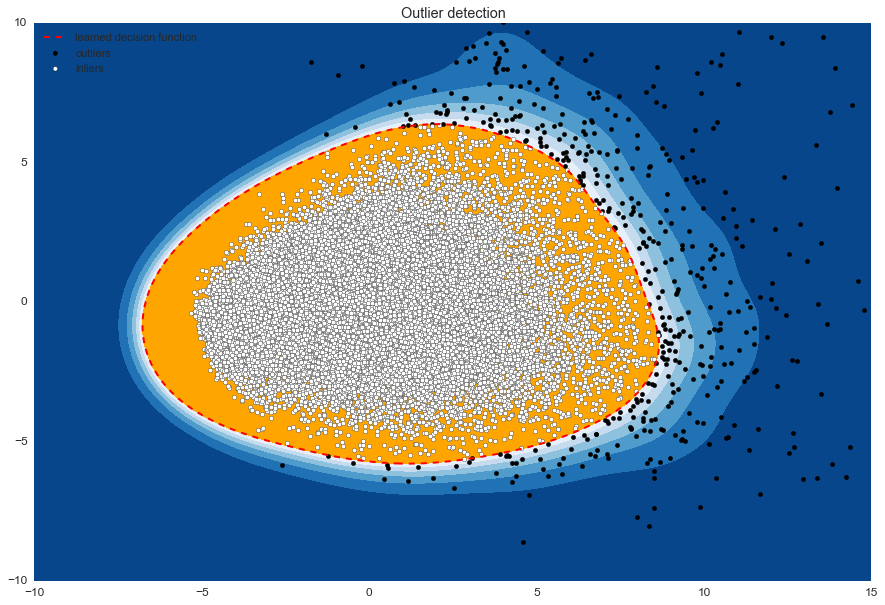

In [76]:
data_outliers_num = data_outliers_not_missing.shape[0]
xx, yy = np.meshgrid(np.linspace(-10, 15, 500), np.linspace(-10, 10, 500))
n_inliers = int((1. - OUTLIER_FRACTION) * data_outliers_num)
n_outliers = int(OUTLIER_FRACTION * data_outliers_num)
Z = svm_clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(15,10))
plt.title("Outlier detection")
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),
                         cmap=plt.cm.Blues_r)
a = plt.contour(xx, yy, Z, levels=[threshold],
                            linewidths=2, colors='red')
plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],
                         colors='orange')
b = plt.scatter(data_PCA[is_outlier, 0], data_PCA[is_outlier, 1], c='black')
c = plt.scatter(data_PCA[is_outlier == 0, 0], data_PCA[is_outlier == 0, 1], c='white')
plt.axis('tight')
plt.legend([a.collections[0], b, c],
           ['learned decision function', 'outliers', 'inliers'],
           prop=matplotlib.font_manager.FontProperties(size=11),loc='upper left')

plt.xlim((-10, 15))
plt.ylim((-10, 10));

Выбросы ищутся только для тренировочной части выборки, чтобы корректно обучить модель.

Посмотрим как распределен целевой признак для выбросов

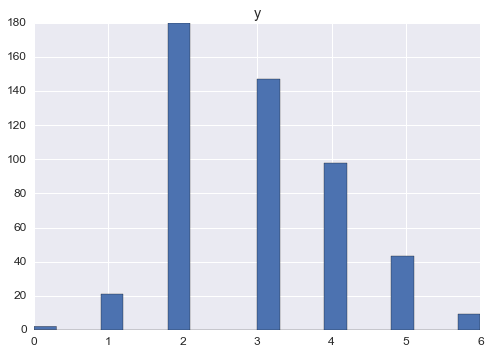

In [76]:
data[is_outlier].hist('y', bins=20);

In [77]:
# Расчитаем корреляцию между категориальными переменными и категориальных с целевой переменной.
# Корреляции Мэтьса / Крамера

Продолжим анализ числовых признаков. Найденные объекты-выбросы удалим после того как обработаем 'значения выбросы'.

На этапе первичного визуального анализа было решено дополнительно проанализировать следующие признаки на предмет выбросов:
х8,х12,х24,х25,х27,х28,х31,х53,х54,х61 - как содержащие отрицательные значения, 

х13,х29,х30,х31,х37,х40,х61 - как содержащие достаточно большие значения.

Для большинства признаков минимальные значения =0, рассмотрим подробнее признаки с отрицательными значениями.

In [78]:
data_real=data[real_features]
min_real=data_real.describe(include='all').T['min']
min_real[min_real<0]

x8     -85.252444
x13    -99.000000
x24     -1.310465
x25     -0.817005
x27     -0.791959
x28     -0.908422
x31   -170.424427
x53     -1.600355
x54     -1.838682
Name: min, dtype: float64

Посмотрим какое количество отрицательных переменных всего в отдельности по каждому признаку

In [79]:
for col in min_real[min_real<0].index:
    print(col,' - ',data_real[col][data_real[col]<0].count()) 

x8  -  17407
x13  -  10730
x24  -  30563
x25  -  31016
x27  -  33656
x28  -  31488
x31  -  9
x53  -  25500
x54  -  24196


In [80]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in min_real[min_real<0].index:
    d=data_real[col][data_real[col]<0].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['v_'+col],ascending=True,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:15]], axis=1)    
result 

,v_x8,c_x8,v_x13,c_x13,v_x24,c_x24,v_x25,c_x25,v_x27,c_x27,v_x28,c_x28,v_x31,c_x31,v_x53,c_x53,v_x54,c_x54
0,-85.252444,1,-99.0,113.0,-1.310465,1,-0.817005,2646,-0.791959,2649,-0.908422,2644,-170.424427,1.0,-1.600355,1,-1.838682,1
1,-41.974179,4,-1.0,10617.0,-1.130591,1,-0.816655,1,-0.791136,1,-0.907447,1,-141.373330,1.0,-1.600338,1,-1.838680,2733
2,-2.984750,2770,NaN,NaN,-1.104069,1,-0.816637,1,-0.791038,1,-0.907396,1,-8.101532,1.0,-1.600328,9,-1.838672,2
3,-2.768142,1,NaN,NaN,-1.095248,1,-0.816490,1,-0.790849,1,-0.906985,1,-6.732063,1.0,-1.600327,1,-1.838671,1
4,-2.724821,1,NaN,NaN,-1.070313,1,-0.816268,1,-0.790396,1,-0.906370,1,-4.653227,1.0,-1.600326,4223,-1.838669,3
5,-2.551534,2,NaN,NaN,-1.042037,1,-0.816084,2,-0.790314,1,-0.905856,3,-3.035025,1.0,-1.600318,1,-1.838668,2
6,-2.334927,1,NaN,NaN,-1.039869,1,-0.815836,1,-0.789656,1,-0.904830,1,-1.198225,1.0,-1.600314,1,-1.838667,1
7,-2.248283,3,NaN,NaN,-1.001630,1,-0.815716,1,-0.788670,1,-0.904245,1,-0.598395,1.0,-1.600312,1,-1.838665,2
8,-2.204962,1,NaN,NaN,-0.999160,1,-0.815506,1,-0.787848,2,-0.903789,1,-0.473550,1.0,-1.600310,1,-1.838664,1
9,-2.161640,1,NaN,NaN,-0.969950,1,-0.815342,1,-0.786203,1,-0.903291,1,NaN,NaN,-1.600308,3,-1.838662,4


Удалим все отрицательные значения для х13 и х31, и выбросы для х8

In [81]:
data_real.loc[data_real['x8']<-3.0, 'x8']=-3
data_real.loc[data_real['x13']<0.0, 'x13']=0
data_real.loc[data_real['x31']<0.0, 'x31']=0

In [82]:
max_real=data_real.describe(include='all').T['max']
max_real[max_real>1]

x8          3.426844
x13    776759.000000
x23       135.063367
x24        34.899154
x25        38.146887
x26        59.833333
x27        28.814227
x28        32.699880
x29      9124.000000
x30     64304.962728
x31      1512.000000
x32         6.000000
x33        76.000000
x36        75.000000
x37      1724.000000
x38       364.000000
x39        50.000000
x40      1110.000000
x41        19.670000
x43        29.774000
x44        36.400000
x53         3.473768
x54         2.242850
x61      5462.000000
Name: max, dtype: float64

In [83]:
for col in max_real[max_real>1].index:
    print(col,' - ',data_real[col][data_real[col]>1].count()) 

x8  -  165
x13  -  33117
x23  -  48122
x24  -  4982
x25  -  4106
x26  -  38865
x27  -  4688
x28  -  4701
x29  -  37885
x30  -  24058
x31  -  31710
x32  -  6359
x33  -  41587
x36  -  36828
x37  -  47147
x38  -  8772
x39  -  30283
x40  -  44064
x41  -  39865
x43  -  22295
x44  -  21281
x53  -  7377
x54  -  8878
x61  -  45268


In [84]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in max_real[max_real>1][:10].index:
    d=data_real[col][data_real[col]>1].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['v_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:15]], axis=1)    
result     

,v_x8,c_x8,v_x13,c_x13,v_x23,c_x23,v_x24,c_x24,v_x25,c_x25,v_x26,c_x26,v_x27,c_x27,v_x28,c_x28,v_x29,c_x29,v_x30,c_x30
0,3.426844,1,776759.0,5,135.063367,2,34.899154,1,38.146887,1,59.833333,1,28.814227,1,32.699880,1,9124.000000,1,64304.962728,1
1,3.036950,1,384027.0,5,59.250708,1,23.710926,1,27.437025,1,58.000000,1,23.873011,1,26.286079,1,5181.666667,1,62233.949870,1
2,2.993629,1,155216.0,6,54.613871,1,16.378947,1,27.052343,1,57.833333,1,22.412187,1,24.628753,1,3531.333333,1,54519.876302,1
3,1.823946,1,117697.0,2,54.533800,1,15.648362,1,20.333187,1,53.166667,2,21.406514,1,24.233664,1,3068.166667,1,53074.773438,1
4,1.607338,2,112775.0,3,54.504683,1,15.195711,1,19.312267,1,52.500000,1,20.584357,1,24.080759,1,2508.166667,1,51986.672363,1
5,1.564016,1,106804.0,1,54.453729,1,14.920674,1,18.175551,1,49.833333,1,19.762183,2,21.411593,1,2154.666667,1,50400.891602,1
6,1.520695,1,76505.0,1,54.366379,1,14.175037,1,17.048649,1,49.666667,1,18.144983,1,18.589522,1,2039.500000,1,49898.148438,1
7,1.477373,2,24273.0,1269,54.315424,1,13.842322,1,16.625149,1,43.833333,1,16.836918,1,17.742901,1,2032.833333,1,48890.903320,1
8,1.434051,2,18156.0,62,54.271749,1,13.706981,1,16.403416,1,42.500000,1,16.473520,1,17.050211,1,2029.666667,1,46631.462728,1
9,1.390730,2,17962.0,1079,54.220795,1,13.603058,1,16.284212,1,42.333333,1,16.309087,1,16.793659,1,2006.000000,1,44094.507161,1


In [85]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in max_real[max_real>1][10:20].index:
    d=data_real[col][data_real[col]>1].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['v_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:15]], axis=1)    
result     

,v_x31,c_x31,v_x32,c_x32,v_x33,c_x33,v_x36,c_x36,v_x37,c_x37,v_x38,c_x38,v_x39,c_x39,v_x40,c_x40,v_x41,c_x41,v_x43,c_x43
0,1512.0,1,6.000000,1,76.0,1,75.0,1,1724.0,1,364.0,1,50.0,1,1110.0,1,19.67,1,29.774,1
1,1414.0,1,5.833333,1,74.0,3,66.0,1,1424.0,1,135.0,1,48.0,1,581.0,1,19.58,2,22.935,1
2,1372.0,1,5.333333,3,70.0,1,61.0,1,1387.0,1,103.0,1,46.0,1,517.0,1,19.50,2,19.968,1
3,1333.0,1,5.166667,3,69.0,1,60.0,1,1256.0,1,67.0,1,45.0,1,502.0,1,19.42,3,16.806,1
4,1320.0,1,5.000000,2,68.0,9,59.0,1,1247.0,1,58.0,1,44.0,3,482.0,1,19.33,1,16.581,1
5,1266.0,1,4.833333,2,67.0,1,58.0,1,1216.0,1,45.0,1,42.0,1,444.0,1,19.25,6,15.935,1
6,1258.0,1,4.666667,3,66.0,5,56.0,1,1153.0,1,43.0,1,41.0,2,409.0,1,19.17,4,15.323,1
7,1250.0,1,4.500000,8,65.0,3,53.0,1,1152.0,1,32.0,1,40.0,1,407.0,1,19.08,6,15.097,1
8,1191.0,1,4.333333,5,64.0,1,44.0,2,1137.0,1,31.0,1,37.0,1,373.0,1,19.00,6,15.000,1
9,1188.0,2,4.166667,18,63.0,1,43.0,1,1130.0,1,27.0,2,36.0,1,367.0,1,18.92,5,14.516,1


In [86]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in max_real[max_real>1][20:].index:
    d=data_real[col][data_real[col]>1].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['v_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:15]], axis=1)    
result  

,v_x44,c_x44,v_x53,c_x53,v_x54,c_x54,v_x61,c_x61
0,36.4,1,3.473768,1,2.242850,1,5462.0,1
1,25.8,1,3.469465,1,2.233105,1,5061.0,1
2,21.8,1,3.431656,1,2.225479,1,2915.0,1
3,21.6,1,3.426007,1,2.216368,1,2802.0,1
4,20.6,1,3.384104,1,2.210364,1,2670.0,1
5,20.0,1,3.365197,1,2.209884,1,2545.0,1
6,18.8,1,3.355008,1,2.198107,1,2500.0,1
7,18.4,1,3.352335,1,2.195188,1,2453.0,1
8,17.8,1,3.346294,1,2.193767,1,2361.0,1
9,16.6,1,3.337067,1,2.191918,1,2275.0,1


Для всех признаков у которых есть значения больше 1000, скорректируем эти значения на равные 1000

In [87]:
col_list=[]
for col in max_real[max_real>1000].index:
    col_list.append(col)
print (col_list)    
for col in col_list[1:]:
    data_real.loc[data_real[col]>1000, col]=1000 

['x13', 'x29', 'x30', 'x31', 'x37', 'x40', 'x61']


In [88]:
data_real.loc[data_real['x13']>25000, 'x13']=25000
data_real.loc[data_real['x23']>60, 'x23']=60
data_real.loc[data_real['x38']>67, 'x38']=67
data_real.loc[data_real['x40']>500,'x40']=500

In [89]:
col_list.append('x8')
col_list.append('x23')
col_list.append('x38')

Посмотрим как визуально выглядят очищенные от выбросов признаки

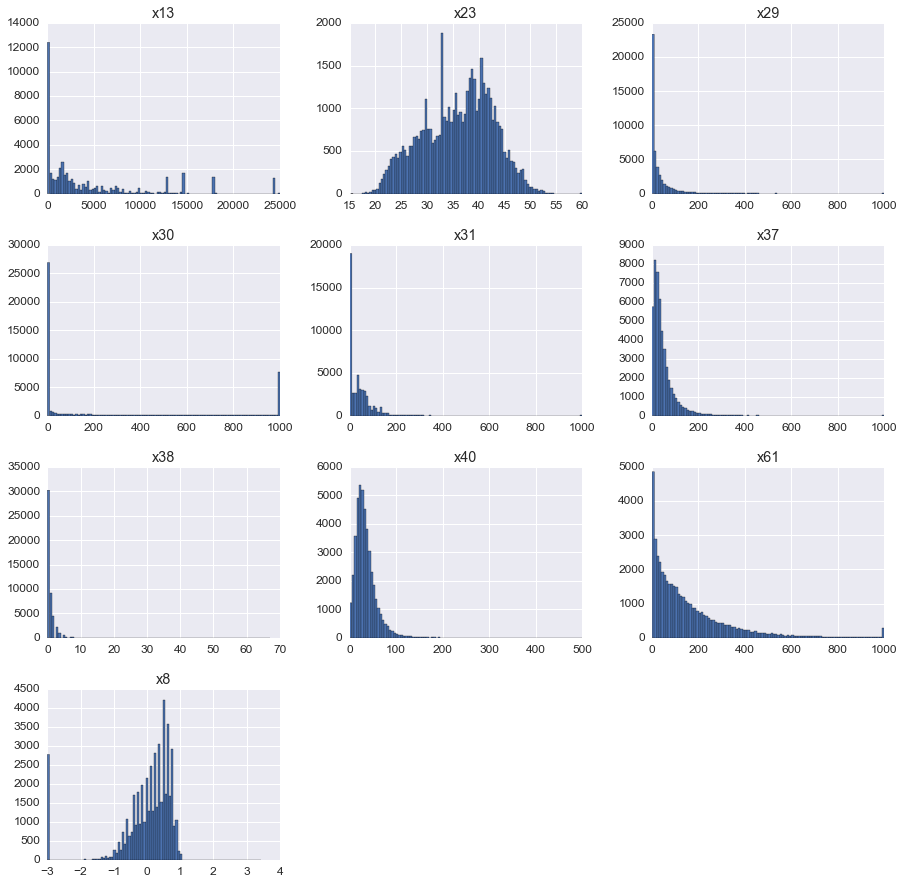

In [90]:
data_real.ix[:, col_list].hist(figsize=(15, 15),bins=100);

Заполним пропуски в числовых данных. Воспользуемся встроенными средствами scikit learn.

http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Imputer.html

In [93]:
#The imputation strategy.
#If “mean”, then replace missing values using the mean along the axis.
#If “median”, then replace missing values using the median along the axis.
#If “most_frequent”, then replace missing using the most frequent value along the axis.

missing=Imputer(missing_values='NaN',strategy="median",axis=0)
missing_data_real_median= pd.DataFrame(missing.fit_transform(data_real),\
                                       columns=[x+'_md' for x in data_real.columns])

missing=Imputer(missing_values='NaN',strategy="most_frequent",axis=0)
missing_data_real_most_frequent= pd.DataFrame(missing.fit_transform(data_real),\
                                              columns=[x+'_mf' for x in data_real.columns])

Для тестовой выборки также создадим два датасета в которых заменим пропуски median и most_frequent значениями но из тренировочной выборки data_test_real

In [94]:
data_test_real=data_test[real_features]
# Удалим все отрицательные значения для х13 и х31, и выбросы для х8
data_test_real.loc[data_test_real['x8']<-3.0, 'x8']=-3
data_test_real.loc[data_test_real['x13']<0.0, 'x13']=0
data_test_real.loc[data_test_real['x31']<0.0, 'x31']=0
# Для всех признаков у которых есть значения больше 1000, скорректируем эти значения на равные 1000
data_test_real.loc[data_test_real['x13']>25000, 'x13']=25000
data_test_real.loc[data_test_real['x23']>60, 'x23']=60
data_test_real.loc[data_test_real['x38']>67, 'x38']=67
data_test_real.loc[data_test_real['x40']>500,'x40']=500

In [95]:
missing_data_test_real_median = pd.DataFrame()
missing_data_test_real_most_frequent = pd.DataFrame()

for col in data_real.columns:
    median=data_real[col].mean()
    most_frequent=data_real[col].value_counts().index[0]
    
    missing_data_test_real_median[col+'_md']=data_test_real[col].\
    apply(lambda x : median if pd.isnull(x) else x)
    missing_data_test_real_most_frequent[col+'_mf']=data_test_real[col].\
    apply(lambda x : most_frequent if pd.isnull(x) else x)    

Сравним визуально распеределение объектов признаков с пропусками и с простыми методами обработки пропусков путем замены на median или most_frequent

x13 - Missing median / most frequent


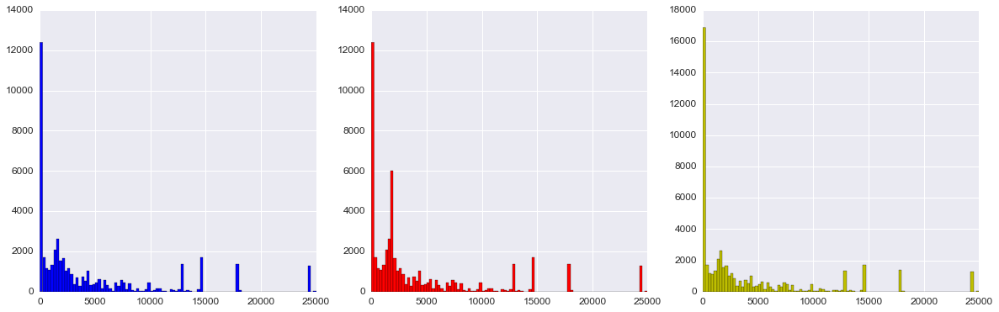

In [96]:
plt.figure(1,figsize=(20,6))
print ("x13 - Missing median / most frequent")
plt.subplot(131)
data_real.ix[:,1].hist(bins=100,color='b');
plt.subplot(132)
missing_data_real_median.ix[:,1].hist(bins=100,color='r');
plt.subplot(133)
missing_data_real_most_frequent.ix[:,1].hist(bins=100,color='y');

x23 - Missing median / most frequent


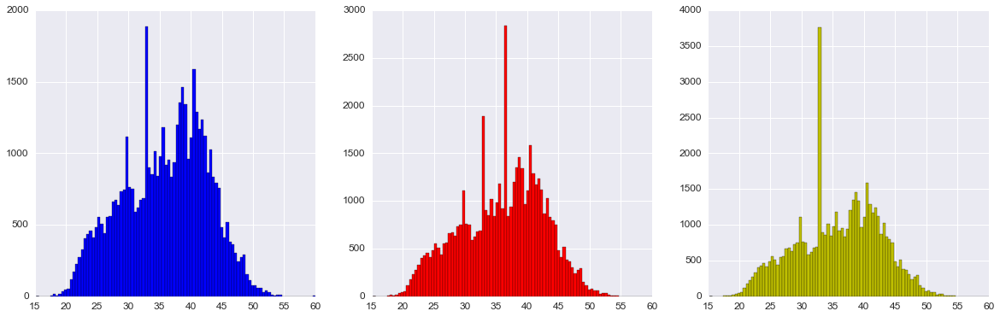

In [97]:
plt.figure(1,figsize=(20,6))
print ("x23 - Missing median / most frequent")
plt.subplot(131)
data_real.ix[:,2].hist(bins=100,color='b');
plt.subplot(132)
missing_data_real_median.ix[:,2].hist(bins=100,color='r');
plt.subplot(133)
missing_data_real_most_frequent.ix[:,2].hist(bins=100,color='y');

Для некоторых признаков заметно на искажение распределения при заполнении пропусков. Попробуем более сложный подход к обработке признаков - будем прогнозировать отсутсвующие значения признаков через обучение на других признаках.

Разобьем для каждого признака выборку тренировочную и тестовую на несодержащую пропуски и содержащую пропуски. Будем учиться на тренировочной выборке несодежащей пропуски. Проверять качество модели на тестовой выборке также несодержащей пропуски. После обучения модели сделаем predict на обе выборки содержащие пропуски, это будет прогноз пропущенных значений в выборках. Повторим это для остальных признаков. Для обучения будем использовать RandomForestRegressor.

http://scikit-learn.org/stable/auto_examples/missing_values.html#sphx-glr-auto-examples-missing-values-py

In [98]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor

Чтобы не обучать все признаки с пропусками отберем наиболее важные. Методы scikit learn  принимают только данные без пропусков поэтому воспользуемся простой корреляцией Пирсона числового признака с целевой переменной.

x8     0.292462
x56    0.255376
x34    0.232587
x35    0.225791
x30    0.199222
x23    0.171159
x43    0.168207
x59    0.162061
x44    0.160352
x60    0.158415
dtype: float64


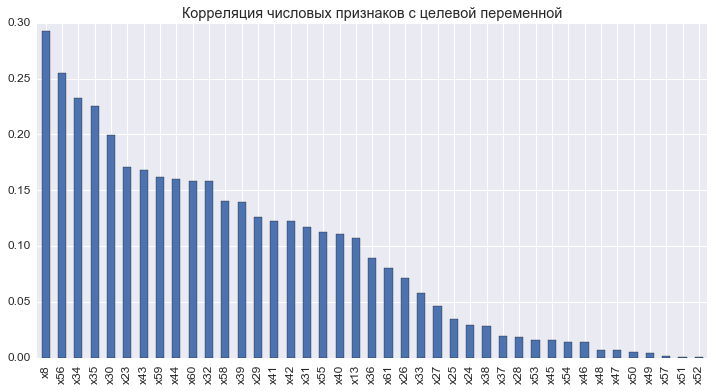

In [99]:
corr_df= np.abs(data[real_features].corrwith(data['y'], axis=0, drop=False))\
                .sort_values(ascending=False)
print (corr_df[:10])
corr_df.plot(kind='bar',figsize=(12,6));
plt.title(u"Корреляция числовых признаков с целевой переменной");

In [100]:
main_features=corr_df[:20].index

In [101]:
data_train=pd.concat([data_cat,data_real,data_discrete], axis=1)
data_train.shape

(50000, 243)

Для 'обучения пропусков' по какому-то отдельному признаку, пропуски в остальных признаках должны быть предобработаны

In [103]:
missing=Imputer(missing_values='NaN',strategy="most_frequent",axis=0)# median
data_train_not_missing= pd.DataFrame(missing.fit_transform(data_train),columns=[x for x in data_train.columns])

Для тестовой выборки также создадим датасет без пропусков. Для категориальных переменных воспользуеся тем же подходом который использовался для тренировочной выборки.

Количественные признаки тестовой выборки можно обработать аналогичным образом заменив пропуски most_frequent из тестовой выборки предполагая, что в целом распределения объектов совпадают и выборки отражают одну генеральную совокупность. Выбран вариант, когда для data_test_not_missing значения most_frequent  будут браться из data_train.

In [104]:
# http://stackoverflow.com/questions/6252280/find-the-most-frequent-number-in-a-numpy-vector
from scipy.stats import mode

data_test_not_missing=data_test.copy()
for col in data_test[real_features].columns:    
    most_frequent=mode(data_train[col])[0][0]     
    data_test_not_missing[col].fillna(most_frequent,inplace=True)

In [105]:
for col in cat_features: 
    data_test_not_missing[col].fillna('Missing',inplace=True)
    
    if len(data_test_not_missing[col].value_counts())>2:  
        d=(data_test_not_missing[col].value_counts(dropna=False).sort_values()/len(data_test))
        data_test_not_missing[col]=data_test_not_missing[col].apply (lambda x : 'Rare' if d[x] <= level_Rare else x) 

In [106]:
data_test_not_missing=pd.get_dummies(data=data_test_not_missing,columns=cat_features)
data_test_not_missing.shape

(50000, 246)

Поскольку get_dummies применяется к разным выборкам, то может быть ситуация когда каких то объектов из категориальных признаков нет в одной из выборок. Тогда количество полученных столбцов при применении get_dummies будет различаться. В нашем случае это признаки которые 'попали' в Rare для одной выборки не попали для другой. Необходимо удалить лишние признаки  из каждой выборки.

In [107]:
# http://stackoverflow.com/questions/3697432/how-to-find-list-intersection
col_list_train=data_train_not_missing.columns
col_list_test=data_test_not_missing.columns

del_features_in_train= filter(lambda x:x not in col_list_test,col_list_train)
del_features_in_test= filter(lambda x:x not in  col_list_train,col_list_test)

print ("del_features_in_train  ",del_features_in_train)
print ("del_features_in_test   ",del_features_in_test)

del_features_in_train   ['x10_47bdeb833e', 'x17_a8eab3ab1b', 'x20_990d004931']
del_features_in_test    ['x0_3ba9cf2feb', 'x10_aa0d233347', 'x12_71629d839c', 'x18_94b2df6c28', 'x21_82a0e4c048', 'x21_fadc90b449']


In [108]:
# http://stackoverflow.com/questions/642763/find-intersection-of-two-lists
both_col_list=list(set(col_list_train) & set(col_list_test))
len(both_col_list)

240

Необходимо, чтобы порядок следования столбцов-признаков в обоих выборках совпадал.

In [109]:
# http://stackoverflow.com/questions/13148429/how-to-change-the-order-of-dataframe-columns
data_train_not_missing=data_train_not_missing[both_col_list]
data_test_not_missing= data_test_not_missing[both_col_list]

Таким образом  есть 4 датасета - data_train, data_train_not_missing, data_test,data_test_not_missing

Из data_train будется формироваться целевая переменная - целовой признак в котором будут 'обучаться пропуски'.

data_train_not_missing - будут формироваться обучающие признаки, удаляя признак по который будет целевой переменной для остальных. 

data_test,data_test_not_missing - играют роль holdout выборки.

Ниже реализован обход в цикле

In [110]:
col='x8'
objects_train_with_nan = data_train.index[data_train[col].isnull()]
# часть тренировочной выборки содержащая пропуски 
data_train_nan=data_train_not_missing.loc[data_train_not_missing.index.isin(objects_train_with_nan)]\
                                     .drop(col,axis=1)
data_train_nan.shape

(1207, 239)

In [111]:
# часть тренировочной выборки НЕсодержащая пропуски  по которой будем обучаться
data_train_not_nan=data_train_not_missing.loc[~data_train_not_missing.index.isin(objects_train_with_nan)]\
                                         .drop(col,axis=1)
data_train_not_nan.shape

(48793, 239)

In [112]:
features_train_not_nan=data_train[~data_train[col].isnull()][col]
features_train_not_nan.shape

(48793L,)

In [113]:
objects_test_with_nan = data_test.index[data_test[col].isnull()]
# часть тестовой выборки содержащая пропуски 
data_test_nan=data_test_not_missing.loc[data_test_not_missing.index.isin(objects_test_with_nan)]\
                                   .drop(col,axis=1)
data_test_nan.shape

(1254, 239)

In [114]:
# часть тестовой выборки НЕсодержащая пропуски  по которой проверяем качество модели
data_test_not_nan=data_test_not_missing.loc[~data_test_not_missing.index.isin(objects_test_with_nan)]\
                                       .drop(col,axis=1)
data_test_not_nan.shape

(48746, 239)

In [115]:
features_test_not_nan=data_test[~data_test[col].isnull()][col]
features_test_not_nan.shape

(48746L,)

In [116]:
# http://scikit-learn.org/stable/modules/model_evaluation.html#regression-metrics
from sklearn.metrics import r2_score

In [117]:
# hw6_regression_wine_Krylov
X_train, X_holdout, y_train, y_holdout = data_train_not_nan, data_test_not_nan,\
                                        features_train_not_nan, features_test_not_nan 

#X_train, X_holdout, y_train, y_holdout =\
#                    train_test_split (data_train_not_nan, features_train_not_nan, test_size=0.3, random_state=17)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform (X_train)
X_holdout_scaled = scaler.transform(X_holdout) 

In [118]:
forest_params = {'max_depth': list(range(10, 25)), 
                 'min_samples_leaf': list(range(1, 8)),
                 'max_features': list(range(6,12))}

In [ ]:
#New in version 0.18: Mean Absolute Error (MAE) criterion  - функция потерь по умолчанию
forest = RandomForestRegressor(random_state=17,verbose=1)

locally_best_forest = GridSearchCV(forest, forest_params, cv=3, scoring= 'r2',n_jobs=-1,verbose=1)
locally_best_forest.fit(X_train_scaled,y_train)

In [ ]:
locally_best_forest.best_params_, locally_best_forest.best_score_

In [ ]:
forest_fixed = RandomForestRegressor(random_state=17,n_jobs=-1,**locally_best_forest.best_params_)
forest_fixed.fit(X_train_scaled,y_train)

In [115]:
y_predict_train_forest_fixed=forest_fixed.predict(X_train_scaled)
y_predict_test_forest_fixed=forest_fixed.predict(X_holdout_scaled)

In [116]:
r2_score_train_GS = r2_score(y_train,y_predict_train_forest_fixed)
r2_score_cv_GS = abs(np.mean(cross_val_score(forest_fixed, X_train_scaled,y_train, scoring='r2')))
r2_score_test_GS = r2_score(y_holdout,y_predict_test_forest_fixed)

print("r2_score (train): %.3f" % r2_score_train_GS)
print("r2_score (cv): %.3f" % r2_score_cv_GS)
print("r2_score (test): %.3f" % r2_score_test_GS)

r2_score (train): 0.506
r2_score (cv): 0.343
r2_score (test): 0.282


Запишем результаты в отдельную таблицу. Также сформируем таблицы с обученными / заполнеными пропусками для обоих выборок

In [117]:
best_value_model={}
best_value_model['R2_train_GS ']= r2_score_train_GS 
best_value_model['R2_cv_GS'] = r2_score_cv_GS
best_value_model['R2_test_GS'] = r2_score_test_GS
best_value_model.update(locally_best_forest.best_params_)

In [118]:
#http://stackoverflow.com/questions/38599912/index-must-be-called-with-a-collection-of-some-kind-assign-column-name-to-dataf
result_model=pd.DataFrame(data=best_value_model.values(),index=best_value_model.keys(),columns=[col])
result_model.sort_index()

,x8
R2_cv_GS,0.343226
R2_test_GS,0.281910
R2_train_GS,0.506317
max_depth,19.000000
max_features,11.000000
min_samples_leaf,7.000000


По полученной модели заполняем пропуски в тренировочной и тестовой выборках.

In [119]:
data_train_nan_scaled = scaler.transform(data_train_nan) 
data_test_nan_scaled = scaler.transform(data_test_nan) 

In [120]:
features_train_nan_predict=forest_fixed.predict(data_train_nan_scaled) #forest_fixed
features_test_nan_predict=forest_fixed.predict(data_test_nan_scaled)

In [121]:
features_train_nan_predict=pd.Series(data=features_train_nan_predict, index=objects_train_with_nan,name=col)
features_test_nan_predict=pd.Series(data=features_test_nan_predict, index=objects_test_with_nan,name=col)

In [122]:
features_train=pd.DataFrame(y_train.append(features_train_nan_predict).sort_index())
features_test=pd.DataFrame(y_holdout.append(features_test_nan_predict).sort_index())

Реализуем обучение оставшихся пропусков

In [ ]:
result_model_=pd.DataFrame()
features_train_=pd.DataFrame()
features_test_=pd.DataFrame()

for col in main_features:
    # часть тренировочной выборки содержащая пропуски 
    objects_train_with_nan = data_train.index[data_train[col].isnull()]
    data_train_nan=data_train_not_missing.loc[data_train_not_missing.index.isin(objects_train_with_nan)]\
                                         .drop(col,axis=1)
    data_train_not_nan=data_train_not_missing.loc[~data_train_not_missing.index.isin(objects_train_with_nan)]\
                                             .drop(col,axis=1)
    features_train_not_nan=data_train[~data_train[col].isnull()][col]

    # часть тестовой выборки содержащая пропуски 
    objects_test_with_nan = data_test.index[data_test[col].isnull()]
    data_test_nan=data_test_not_missing.loc[data_test_not_missing.index.isin(objects_test_with_nan)]\
                                       .drop(col,axis=1)
    data_test_not_nan=data_test_not_missing.loc[~data_test_not_missing.index.isin(objects_test_with_nan)]\
                                           .drop(col,axis=1)
    features_test_not_nan=data_test[~data_test[col].isnull()][col]

    X_train, X_holdout, y_train, y_holdout = data_train_not_nan, data_test_not_nan,\
                                            features_train_not_nan, features_test_not_nan 

    #X_train, X_holdout, y_train, y_holdout =\
    #                    train_test_split (data_train_not_nan, features_train_not_nan, test_size=0.3, random_state=17)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform (X_train)
    X_holdout_scaled = scaler.transform(X_holdout) 
    
    #GridSearchCV
    forest_params = {'max_depth': list(range(10, 25)), 
                 'min_samples_leaf': list(range(1, 8)),
                 'max_features': list(range(6,12))}
    
    forest = RandomForestRegressor(random_state=17,verbose=1)
    locally_best_forest = GridSearchCV(forest, forest_params, cv=3, scoring= 'r2',n_jobs=-1,verbose=1)
    locally_best_forest.fit(X_train_scaled,y_train)
    
    forest_fixed = RandomForestRegressor(random_state=17,n_jobs=-1,**locally_best_forest.best_params_)
    forest_fixed.fit(X_train_scaled,y_train)
    
    y_predict_train_forest_fixed=forest_fixed.predict(X_train_scaled)
    y_predict_test_forest_fixed=forest_fixed.predict(X_holdout_scaled)
    
    r2_score_train_GS = r2_score(y_train,y_predict_train_forest_fixed)
    r2_score_cv_GS = abs(np.mean(cross_val_score(forest_fixed, X_train_scaled,y_train, scoring='r2')))
    r2_score_test_GS = r2_score(y_holdout,y_predict_test_forest_fixed)  
    
    #Result
    best_value_model={}
    best_value_model['R2_train_GS ']= r2_score_train_GS 
    best_value_model['R2_cv_GS'] = r2_score_cv_GS
    best_value_model['R2_test_GS'] = r2_score_test_GS
    best_value_model.update(locally_best_forest.best_params_)

    #Create witout missing new features
    result_model=pd.DataFrame(data=best_value_model.values(),index=best_value_model.keys(),columns=[col])
    result_model_ = pd.concat([result_model_,result_model], axis=1) 

    data_train_nan_scaled = scaler.transform(data_train_nan) 
    data_test_nan_scaled = scaler.transform(data_test_nan) 
    
    features_train_nan_predict=forest_fixed.predict(data_train_nan_scaled) #forest_fixed or forest
    features_test_nan_predict=forest_fixed.predict(data_test_nan_scaled)

    features_train_nan_predict=pd.Series(data=features_train_nan_predict, index=objects_train_with_nan,name=col)
    features_test_nan_predict=pd.Series(data=features_test_nan_predict, index=objects_test_with_nan,name=col)

    features_train=pd.DataFrame(y_train.append(features_train_nan_predict).sort_index())
    features_test=pd.DataFrame(y_holdout.append(features_test_nan_predict).sort_index())

    features_train_ = pd.concat([features_train_,features_train], axis=1) 
    features_test_ = pd.concat([features_test_,features_test], axis=1) 


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   43.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 22.4min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.4s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 20.9min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.0s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   44.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 19.6min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.7s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   46.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 19.6min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 19.5min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.2s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   43.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 19.3min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.4s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.4min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.4s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   40.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.5min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.2s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   36.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.2min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.5min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 18.2min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.1s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.6min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.1s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 18.2min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.0s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   40.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.8min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 16.7min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   43.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 16.7min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.0s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.8min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   39.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.4min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.9s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   38.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 15.9min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.2s finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.0min finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished


In [143]:
result_model_.sort_index()

,x8,x56,x34,x35,x30,x23,x43,x59,x44,x60,x32,x58,x39,x29,x41,x42,x31,x55,x40,x13
R2_cv_GS,0.343226,0.468505,0.868496,0.713646,0.534973,0.743307,0.676652,0.276033,0.600111,0.126708,0.435670,0.406924,0.155239,0.130689,0.700123,0.796799,0.628166,0.128167,0.402779,0.675318
R2_test_GS,0.281910,0.460940,0.803524,0.716598,0.059604,0.736200,0.669472,0.256604,0.569778,0.140056,0.430583,0.415651,0.159224,0.116283,0.710752,0.716014,0.611671,0.145286,0.357362,0.366006
R2_train_GS,0.506317,0.847941,0.892234,0.889051,0.697920,0.840468,0.833803,0.549159,0.716526,0.383826,0.653411,0.652684,0.319755,0.223631,0.839653,0.803636,0.784223,0.382140,0.552043,0.804243
max_depth,19.000000,24.000000,21.000000,24.000000,23.000000,22.000000,21.000000,24.000000,23.000000,22.000000,21.000000,24.000000,17.000000,11.000000,21.000000,17.000000,19.000000,24.000000,16.000000,20.000000
max_features,11.000000,11.000000,11.000000,11.000000,10.000000,11.000000,11.000000,10.000000,11.000000,11.000000,11.000000,11.000000,10.000000,10.000000,10.000000,11.000000,11.000000,11.000000,11.000000,11.000000
min_samples_leaf,7.000000,1.000000,3.000000,2.000000,5.000000,2.000000,3.000000,4.000000,6.000000,6.000000,4.000000,4.000000,7.000000,6.000000,2.000000,2.000000,3.000000,6.000000,6.000000,2.000000


Оценка r2_score показывает, насколько условная дисперсия модели отличается от дисперсии реальных значений целевой переменной. Если этот коэффициент близок к  занчению 1, то условная дисперсия модели достаточно мала и весьма вероятно, что модель неплохо описывает данные. Если же коэффициент r2_score сильно меньше, например, меньше 0.5, то, с большой долей уверенности модель не отражает реальное положение вещей.

Модель заполнения пропусков более точно описала (R2_test_GS) распределение для следующих признаков - x56,x34,x35,x23,x43,x44,x42,x31,x55.

Однако, у статистики r2_score есть один серьезный недостаток: при увеличении числа предикторов эта статистика может только возрастать. Поэтому, может показаться, что модель с большим количеством предикторов лучше, чем модель с меньшим, даже если все новые предикторы никак не влияют на зависимую переменную.

Сохраним полученные результаты в файл

In [151]:
col_features_train,col_features_test= [],[]
col_features_train = [feature + '_RF' for feature in result_model_.columns]
col_features_test = [feature + '_RF' for feature in result_model_.columns]

features_train_.columns=col_features_train
features_test_.columns=col_features_test

In [152]:
features_train_.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_train_.csv',index=False)
features_test_.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_test_.csv',index=False)

In [123]:
features_train_= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_train_.csv')
features_test_= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_test_.csv')
features_train_.head()

,x8_RF,x56_RF,x34_RF,x35_RF,x30_RF,x23_RF,x43_RF,x59_RF,x44_RF,x60_RF,x32_RF,x58_RF,x39_RF,x29_RF,x41_RF,x42_RF,x31_RF,x55_RF,x40_RF,x13_RF
0,-0.688706,0.333333,0.0,0.000000,1.294922,40.579612,1.935,0.000000,2.2,0.000000,0.166667,0.333333,1.0,37.000000,3.67,0.12,55.0,0.000000,23.0,3694.0
1,0.870871,0.397671,0.0,0.000000,0.027669,28.765503,3.452,0.068220,4.0,0.033278,0.000000,0.249584,1.0,0.166667,17.25,0.57,109.0,0.011647,68.0,18156.0
2,0.437655,0.606061,0.0,0.000000,14.837728,24.943933,0.161,0.060606,0.2,0.000000,0.000000,0.212121,3.0,0.333333,4.42,0.15,11.0,0.000000,11.0,1178.0
3,0.004439,1.000000,0.0,0.000000,0.004395,41.576860,0.226,0.000000,0.8,0.000000,0.500000,0.000000,3.0,1.166667,8.92,0.29,0.0,0.000000,15.0,14559.0
4,0.480977,0.645161,1.0,0.666667,1000.000000,31.080282,2.032,0.040323,2.4,0.000000,0.000000,0.036290,4.0,17.333333,1.58,0.05,33.0,0.020161,86.0,5777.0


Сравним полученное распределение признака x23 при трех разных способах заполнения пропусков

x23 - Default / Missing median / most frequent / RandomForestRegressor


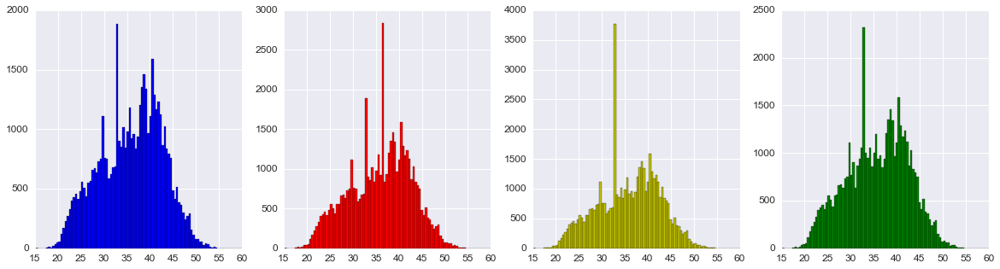

In [98]:
plt.figure(1,figsize=(20,5))
print ("x23 - Default / Missing median / most frequent / RandomForestRegressor")
plt.subplot(141)
data_real.ix[:,2].hist(bins=100,color='b');
plt.subplot(142)
missing_data_real_median.ix[:,2].hist(bins=100,color='r');
plt.subplot(143)
missing_data_real_most_frequent.ix[:,2].hist(bins=100,color='y');
plt.subplot(144)
features_train_['x23_RF'].hist(bins=100,color='g');

###  Часть 6. Построение признаков

####  Построение числовых признаков

Во многих числовых признаках присутствуют сильные перекосы в сторону определенных значений. Эти преобладающие значения искажают распределение объектов признаков от нормального. Попробуем смоделировать нормальное распределение объектов признаков удалив преобладающие значения.

Рассмотрим какие значения признака наоболее часто встречаются в данных.

In [99]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in real_features[:10]:
    d=data_real[col].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['c_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:10]], axis=1)    
result  

,v_x8,c_x8,v_x13,c_x13,v_x23,c_x23,v_x24,c_x24,v_x25,c_x25,v_x26,c_x26,v_x27,c_x27,v_x28,c_x28,v_x29,c_x29,v_x30,c_x30
0,-2.984750,2770,0.0,12395,NaN,1878,NaN,1878,-0.817005,2646,0.000000,2644,-0.791959,2649,-0.908422,2644,0.000000,4676,0.000000,15054
1,0.480977,2569,NaN,4488,32.921915,841,-0.954930,856,NaN,1878,NaN,1878,NaN,1878,NaN,1878,NaN,1878,1000.000000,7662
2,0.610941,1828,12865.0,1338,29.850101,398,-0.933303,102,-0.798582,277,1.333333,1626,-0.298659,1565,-0.600560,1503,0.166667,1491,NaN,1878
3,0.654263,1759,24273.0,1269,32.696260,295,-0.019824,26,-0.632773,233,1.166667,1575,-0.545309,822,-0.292697,1055,0.333333,1088,0.000163,277
4,0.567620,1746,17962.0,1079,34.093863,274,-0.911161,23,-0.780159,226,2.000000,1516,-0.380876,638,-0.138766,783,0.500000,923,0.000326,241
5,0.697585,1691,14537.0,905,29.085787,142,-0.518785,19,-0.448540,203,1.833333,1506,-0.339767,552,-0.549249,748,0.666667,765,0.000488,156
6,0.524298,1639,14559.0,785,40.303003,73,0.790679,16,-0.743312,185,1.500000,1495,0.194640,538,0.630889,743,0.833333,698,0.000651,114
7,0.740906,1628,1602.0,515,40.295724,66,-0.921974,15,-0.761736,179,1.666667,1491,-0.052009,495,0.015165,730,1.000000,596,0.000814,95
8,0.394333,1610,1480.0,465,40.310282,58,-0.082125,10,-0.540656,175,1.000000,1473,-0.463092,447,-0.446629,713,1.166667,562,0.000977,94
9,0.437655,1513,3878.0,419,37.595148,55,-0.235619,9,-0.595926,174,2.166667,1364,0.030207,438,-0.395318,681,1.333333,535,0.001953,78


In [100]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in real_features[10:20]:
    d=data_real[col].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['c_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:10]], axis=1)    
result 

,v_x31,c_x31,v_x32,c_x32,v_x33,c_x33,v_x34,c_x34,v_x35,c_x35,v_x36,c_x36,v_x37,c_x37,v_x38,c_x38,v_x39,c_x39,v_x40,c_x40
0,0.0,16062,0.000000,26373,6.0,7445,0.0,27072.0,0.000000,27072.0,2.0,8821,NaN,1878,0.0,30228,1.0,17659,NaN,5608
1,NaN,1878,0.166667,5372,0.0,5994,1.0,21050.0,1.000000,6356.0,3.0,7788,15.0,874,1.0,9122,2.0,13262,23.0,1135
2,33.0,1206,0.333333,3031,12.0,5855,NaN,1878.0,0.166667,4078.0,1.0,7263,14.0,859,2.0,4452,3.0,7694,25.0,1123
3,7.0,846,0.500000,2084,18.0,4401,NaN,NaN,0.833333,3067.0,4.0,6254,19.0,835,3.0,2110,4.0,4138,21.0,1087
4,67.0,694,1.000000,2036,24.0,2465,NaN,NaN,0.333333,2638.0,5.0,4461,18.0,829,NaN,1878,5.0,2139,18.0,1076
5,39.0,683,NaN,1878,NaN,1878,NaN,NaN,0.666667,2491.0,0.0,4031,17.0,827,4.0,1064,NaN,1878,26.0,1061
6,38.0,545,0.666667,1547,8.0,1819,NaN,NaN,0.500000,2419.0,6.0,3164,11.0,810,5.0,492,6.0,1296,24.0,1055
7,21.0,523,0.833333,1319,14.0,1605,NaN,NaN,NaN,1878.0,7.0,2121,13.0,810,6.0,248,7.0,672,20.0,1052
8,72.0,482,1.166667,1243,2.0,1540,NaN,NaN,0.200000,1.0,NaN,1878,24.0,805,7.0,154,8.0,373,22.0,1051
9,62.0,473,1.333333,915,30.0,1274,NaN,NaN,NaN,NaN,8.0,1441,16.0,802,8.0,88,9.0,231,27.0,1038


In [101]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in real_features[20:30]:
    d=data_real[col].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['c_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:10]], axis=1)    
result  

,v_x41,c_x41,v_x42,c_x42,v_x43,c_x43,v_x44,c_x44,v_x45,c_x45,v_x46,c_x46,v_x47,c_x47,v_x48,c_x48,v_x49,c_x49,v_x50,c_x50
0,NaN,5608,NaN,5608,NaN,2156,0.0,6822,1.000,10165,1.000,10137,0.000,10404,0.000,12450,0.000,13207,0.000,13495
1,0.08,649,0.01,1703,0.000,1876,0.2,4685,0.000,7217,0.000,8885,1.000,9972,1.000,9866,1.000,9714,1.000,10205
2,0.17,527,0.19,1511,0.032,1045,0.4,4280,0.500,3663,0.500,3740,0.500,3890,NaN,2156,NaN,2156,NaN,2156
3,0.25,426,0.22,1436,0.065,931,0.6,3970,NaN,2156,NaN,2156,NaN,2156,0.486,64,0.545,61,0.545,58
4,6.17,399,0.16,1413,0.097,927,0.8,3558,0.667,2038,0.667,2130,0.667,2075,0.508,58,0.534,61,0.458,57
5,0.33,396,0.25,1413,0.194,887,1.0,3248,0.333,1900,0.333,2012,0.333,2041,0.520,58,0.500,58,0.507,57
6,5.83,386,0.21,1398,0.129,880,1.2,2932,0.750,1212,0.750,1217,0.750,1279,0.481,57,0.394,57,0.500,56
7,5.92,385,0.18,1396,0.161,851,1.4,2519,0.250,1045,0.250,1064,0.250,1103,0.493,57,0.543,54,0.605,54
8,6.08,381,0.24,1369,0.290,850,1.6,2268,0.600,1041,0.600,1029,0.600,1060,0.450,55,0.478,54,0.509,53
9,6.58,381,0.02,1365,0.355,808,NaN,2156,0.400,993,0.400,1010,0.400,991,0.500,54,0.521,53,0.460,53


In [102]:
result= pd.DataFrame() #creates a new dataframe that's empty

for col in real_features[30:]:
    d=data_real[col].value_counts(dropna=False).reset_index()
    d.columns = ['v_'+col, 'c_'+col] # v-value, c-count
    d.sort(['c_'+col],ascending=False,inplace=True)#.reset_index(drop=True)
    d.reset_index(drop=True,inplace=True)
        
    result = pd.concat([result,d[:10]], axis=1)    
result  

,v_x51,c_x51,v_x52,c_x52,v_x53,c_x53,v_x54,c_x54,v_x55,c_x55,...,v_x57,c_x57,v_x58,c_x58,v_x59,c_x59,v_x60,c_x60,v_x61,c_x61
0,0.000,14019,0.000,14153,-1.600326,4223,-1.838680,2733,0.000000,29407,...,0.000000,7133,0.000000,10322,0.000000,16833,0.000000,27600,NaN,3874
1,1.000,10502,1.000,10926,NaN,2156,NaN,2156,NaN,3874,...,NaN,3874,NaN,3874,NaN,3874,NaN,3874,1.0,858
2,NaN,2156,NaN,2156,-1.600328,9,-1.838650,6,1.000000,107,...,1.000000,900,1.000000,604,1.000000,359,1.000000,155,2.0,643
3,0.500,66,0.500,68,0.427296,4,-1.838654,5,0.111111,82,...,0.500000,463,0.500000,386,0.500000,227,0.333333,105,3.0,574
4,0.491,65,0.462,55,-1.600300,3,-1.838662,4,0.250000,72,...,0.333333,337,0.333333,295,0.333333,168,0.250000,96,4.0,500
5,0.469,57,0.450,54,-0.244269,3,-1.838656,4,0.200000,72,...,0.250000,305,0.200000,241,0.250000,165,0.500000,91,5.0,452
6,0.405,57,0.517,54,-1.600308,3,-1.838646,4,0.500000,71,...,0.200000,268,0.250000,224,0.200000,151,0.166667,90,6.0,417
7,0.521,57,0.485,54,0.005564,3,-1.838648,4,0.166667,69,...,0.666667,203,0.166667,200,0.125000,146,0.142857,82,8.0,382
8,0.497,56,0.460,54,-0.249154,2,-1.838659,4,0.142857,67,...,0.166667,197,0.142857,163,0.100000,139,0.076923,79,10.0,350
9,0.561,55,0.471,52,1.259087,2,-1.838657,4,0.100000,67,...,0.142857,187,0.125000,160,0.166667,139,0.200000,75,9.0,343


Заменим на Nan некоторые часто встречающиеся объеты в признаках. Создадим отдельную таблицу таких признаков. Библиотека XGBoost имеет встроенную логику обработки пропусков, поэтому сформированные таким образов признаки будут подаваться в XGBoost.

In [103]:
def features_XGB(data):
    data_= pd.DataFrame()
    data_['x8'] = data['x8'].apply(lambda x: None if x < -2.98 else x)

    # Убираем преобладающий 0
    data_['x29'] = data['x29'].apply(lambda x: None if x  <= 0 else x)
    data_['x30'] = data['x30'].apply(lambda x: None if x <= 0 or x > 100. else x)
    data_['x31'] = data['x31'].apply(lambda x: None if x <= 0 else x)
    data_['x32'] = data['x32'].apply(lambda x: None if x ==0 else x)
    data_['x38'] = data['x38'].apply(lambda x: None if x ==0 else x)

    # Убираем преобладающий 0 / 6 / 12 /18 / 24
    data_['x33'] = data['x33'].apply(lambda x: None if x ==0 or x == 6 or x == 12 or x == 18 or x == 24 else x)

    # Для x45 - x52 убираем преобладающие 0 и 1
    for i in range(45, 53):
        data_['x' + str(i)] = data['x' + str(i)].apply(lambda x: None if x == 1 or x == 0 else x)
    # Убираем преобладающий -1.6000
    data_['x53'] = data['x53'].apply(lambda x: None if x < -1.6000 else x)
    # Убираем преобладающий 1.8386
    data_['x54'] = data['x54'].apply(lambda x: None if x < -1.8386 else x)

    # Для x55 - x60 убираем преобладающий 0
    for i in range(55, 61):
        data_['x' + str(i)] = data['x' + str(i)].apply(lambda x: None if x == 0 else x)  
    return data_

In [104]:
data_train_XGB= pd.DataFrame()
data_train_XGB=features_XGB(data_train)
data_train_XGB.head()

,x8,x29,x30,x31,x32,x38,x33,x45,x46,x47,...,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60
0,-0.688706,37.000000,1.294922,55.0,0.166667,NaN,10.0,0.625,0.250,0.125,...,0.634,0.548,0.235333,0.264952,NaN,0.333333,0.333333,0.333333,NaN,NaN
1,0.870871,0.166667,0.027669,109.0,NaN,1.0,31.0,0.409,0.619,0.579,...,0.522,NaN,1.782346,1.322409,0.011647,0.397671,0.239601,0.249584,0.068220,0.033278
2,0.437655,0.333333,14.837728,11.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.533,0.835,-0.586540,0.672436,NaN,0.606061,0.121212,0.212121,0.060606,NaN
3,0.004439,1.166667,0.004395,NaN,0.500000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN
4,0.480977,17.333333,NaN,33.0,NaN,1.0,NaN,0.348,0.762,0.550,...,NaN,0.642,0.960991,0.790990,0.020161,0.645161,0.258065,0.036290,0.040323,NaN


In [105]:
data_test_XGB= pd.DataFrame()
data_test_XGB=features_XGB(data_test)
data_test_XGB.head()

,x8,x29,x30,x31,x32,x38,x33,x45,x46,x47,...,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60
0,-1.425173,6.000000,NaN,94.0,NaN,NaN,8.0,0.857,0.500,NaN,...,0.635,0.361,0.591831,0.261807,NaN,0.038462,0.153846,0.153846,0.653846,NaN
1,-0.038882,3.833333,37.386683,206.0,NaN,1.0,NaN,0.346,0.583,0.238,...,0.795,NaN,0.652880,1.604071,0.178273,0.178273,0.370474,0.253482,0.019499,NaN
2,NaN,9.000000,8.884440,NaN,NaN,NaN,NaN,NaN,NaN,0.667,...,NaN,0.809,-0.317609,-0.792001,0.080925,0.895954,0.017341,NaN,0.005780,NaN
3,0.480977,478.666667,NaN,76.0,NaN,1.0,32.0,0.462,0.750,0.714,...,0.719,NaN,-0.386877,-0.077837,NaN,0.482143,0.507143,0.007143,0.003571,NaN
4,0.784228,33.000000,NaN,NaN,NaN,2.0,NaN,NaN,0.800,0.200,...,NaN,0.602,-0.575839,0.435899,0.126761,0.478873,NaN,0.394366,NaN,NaN


In [106]:
data_test_XGB.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_XGB.csv',index=False)
data_train_XGB.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_train_XGB.csv',index=False)

Посмотрим на распределение предобработанных числовых признаков

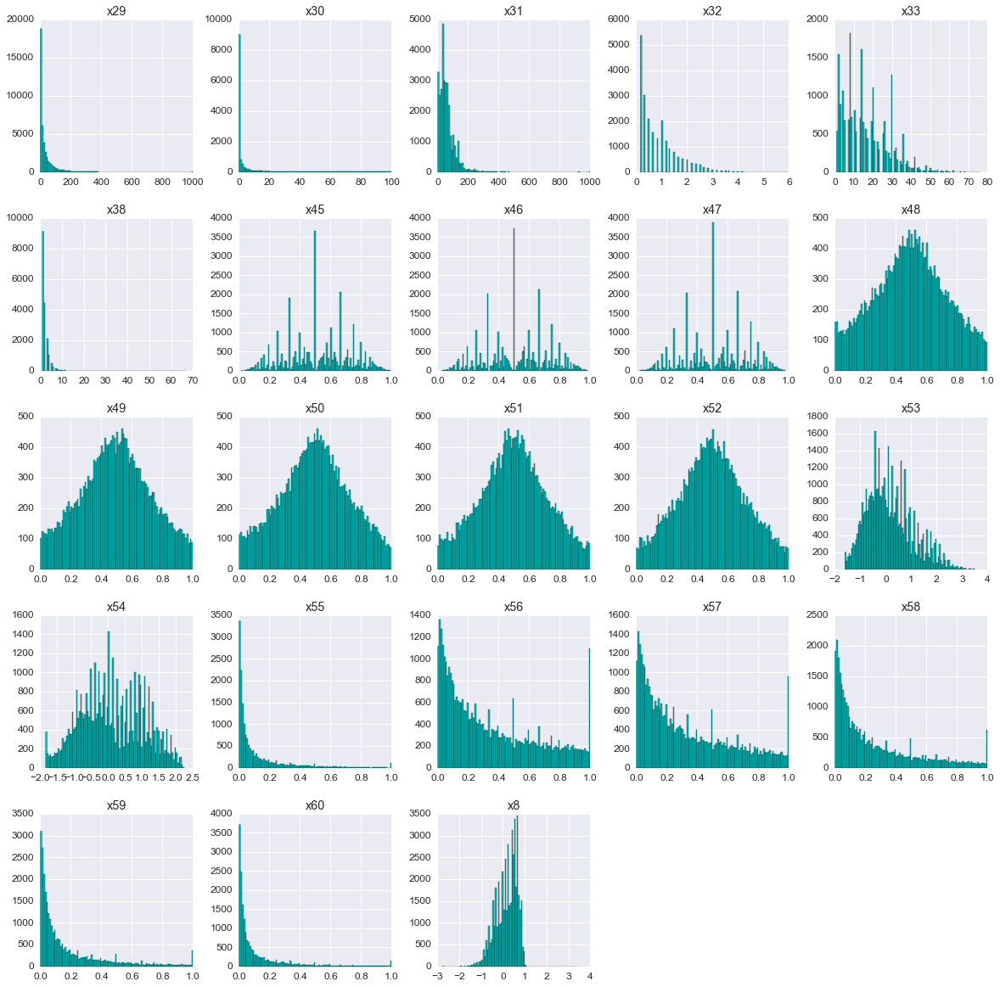

In [107]:
data_train_XGB.hist(figsize=(20, 20),bins=100,color='c');

Для того чтобы использовать созданные таким образом признаки в методах Scikit learn необходимо обработать Nan. Обучим пропуски по тому же алгоритму который использовался выше.

In [108]:
missing=Imputer(missing_values='NaN',strategy="median",axis=0)# median
data_train_not_missing= pd.DataFrame(missing.fit_transform(data_train_XGB),columns=[x for x in data_train_XGB.columns])

data_test_not_missing=data_test_XGB.copy()
for col in data_test_not_missing.columns:    
    most_frequent=mode(data_test_XGB[col])[0][0]     
    data_test_not_missing[col].fillna(most_frequent,inplace=True)

In [109]:
data_train_not_missing.columns==data_test_not_missing.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True], dtype=bool)

In [110]:
main_features=data_train_XGB.columns

In [76]:
result_model_XGB=pd.DataFrame()
features_train_XGB=pd.DataFrame()
features_test_XGB=pd.DataFrame()
# дабавим к data_train / data_test  префикс _XGB
for col in main_features:
    # часть тренировочной выборки содержащая пропуски 
    objects_train_with_nan = data_train_XGB.index[data_train_XGB[col].isnull()]
    data_train_nan=data_train_not_missing.loc[data_train_not_missing.index.isin(objects_train_with_nan)]\
                                         .drop(col,axis=1)
    data_train_not_nan=data_train_not_missing.loc[~data_train_not_missing.index.isin(objects_train_with_nan)]\
                                             .drop(col,axis=1)
    features_train_not_nan=data_train_XGB[~data_train_XGB[col].isnull()][col]

    # часть тестовой выборки содержащая пропуски 
    objects_test_with_nan = data_test_XGB.index[data_test_XGB[col].isnull()]
    data_test_nan=data_test_not_missing.loc[data_test_not_missing.index.isin(objects_test_with_nan)]\
                                       .drop(col,axis=1)
    data_test_not_nan=data_test_not_missing.loc[~data_test_not_missing.index.isin(objects_test_with_nan)]\
                                           .drop(col,axis=1)
    features_test_not_nan=data_test_XGB[~data_test_XGB[col].isnull()][col]

    X_train, X_holdout, y_train, y_holdout = data_train_not_nan, data_test_not_nan,\
                                            features_train_not_nan, features_test_not_nan 

    #X_train, X_holdout, y_train, y_holdout =\
    #                    train_test_split (data_train_not_nan, features_train_not_nan, test_size=0.3, random_state=17)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform (X_train)
    X_holdout_scaled = scaler.transform(X_holdout) 
    
    #GridSearchCV
    forest_params = {'max_depth': list(range(10, 25)), 
                 'min_samples_leaf': list(range(1, 8)),
                 'max_features': list(range(6,12))}
    
    forest = RandomForestRegressor(random_state=17,verbose=1)
    locally_best_forest = GridSearchCV(forest, forest_params, cv=3, scoring= 'r2',n_jobs=-1,verbose=1)
    locally_best_forest.fit(X_train_scaled,y_train)
    
    forest_fixed = RandomForestRegressor(random_state=17,n_jobs=-1,**locally_best_forest.best_params_)
    forest_fixed.fit(X_train_scaled,y_train)
    
    y_predict_train_forest_fixed=forest_fixed.predict(X_train_scaled)
    y_predict_test_forest_fixed=forest_fixed.predict(X_holdout_scaled)
    
    r2_score_train_GS = r2_score(y_train,y_predict_train_forest_fixed)
    r2_score_cv_GS = abs(np.mean(cross_val_score(forest_fixed, X_train_scaled,y_train, scoring='r2')))
    r2_score_test_GS = r2_score(y_holdout,y_predict_test_forest_fixed)  
    
    #Result
    best_value_model={}
    best_value_model['R2_train_GS ']= r2_score_train_GS 
    best_value_model['R2_cv_GS'] = r2_score_cv_GS
    best_value_model['R2_test_GS'] = r2_score_test_GS
    best_value_model.update(locally_best_forest.best_params_)

    #Create witout missing new features
    result_model=pd.DataFrame(data=best_value_model.values(),index=best_value_model.keys(),columns=[col])
    result_model_XGB = pd.concat([result_model_XGB,result_model], axis=1) 

    data_train_nan_scaled = scaler.transform(data_train_nan) 
    data_test_nan_scaled = scaler.transform(data_test_nan) 
    
    features_train_nan_predict=forest_fixed.predict(data_train_nan_scaled) #forest_fixed or forest
    features_test_nan_predict=forest_fixed.predict(data_test_nan_scaled)

    features_train_nan_predict=pd.Series(data=features_train_nan_predict, index=objects_train_with_nan,name=col)
    features_test_nan_predict=pd.Series(data=features_test_nan_predict, index=objects_test_with_nan,name=col)

    features_train=pd.DataFrame(y_train.append(features_train_nan_predict).sort_index())
    features_test=pd.DataFrame(y_holdout.append(features_test_nan_predict).sort_index())

    features_train_XGB = pd.concat([features_train_XGB,features_train], axis=1) 
    features_test_XGB = pd.concat([features_test_XGB,features_test], axis=1) 

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.5min finished


Fitting 3 folds for each of 630 candidates, totalling 1890 fits
Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   30.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 19.5min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   43.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed:  6.8min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 14.8min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   41.7s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed:  8.7min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed:  7.9min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   46.5s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed:  9.4min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 14.8min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 13.9min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   59.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 12.8min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   52.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 11.1min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   48.7s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 10.9min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 10.4min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 10.0min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   44.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 10.0min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 16.0min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 17.2min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   42.7s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed:  6.6min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 14.5min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 14.6min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 13.2min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed: 10.7min finished



Fitting 3 folds for each of 630 candidates, totalling 1890 fits

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 1890 out of 1890 | elapsed:  6.9min finished


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished


In [77]:
result_model_XGB.sort_index()

,x8,x29,x30,x31,x32,x38,x33,x45,x46,x47,...,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60
R2_cv_GS,0.147232,0.062252,0.109263,0.210140,0.054744,0.000272,0.174703,0.015502,0.028666,0.014392,...,0.004183,0.001861,0.601194,0.584468,0.875732,0.967272,0.967637,0.952420,0.929270,0.875148
R2_test_GS,-0.146411,-0.012578,-0.383297,0.162104,-0.051360,-0.006987,0.156204,0.007478,0.023731,0.013838,...,-0.010350,-0.013164,0.600226,0.574247,-0.027927,-0.816483,-0.807432,-0.513676,-0.255516,-0.099809
R2_train_GS,0.264450,0.203876,0.300839,0.329554,0.197149,0.115531,0.330298,0.120569,0.155423,0.115687,...,0.088056,0.082415,0.658917,0.628650,0.970201,0.990100,0.988797,0.985210,0.979680,0.964632
max_depth,11.000000,11.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,17.000000,22.000000,24.000000,18.000000,22.000000,24.000000
max_features,6.000000,6.000000,11.000000,9.000000,10.000000,6.000000,9.000000,9.000000,10.000000,7.000000,...,6.000000,6.000000,10.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000
min_samples_leaf,7.000000,7.000000,7.000000,7.000000,6.000000,7.000000,3.000000,7.000000,5.000000,7.000000,...,7.000000,6.000000,6.000000,7.000000,2.000000,3.000000,4.000000,3.000000,3.000000,3.000000


https://ru.coursera.org/learn/supervised-learning/lecture/Modk6/mietriki-kachiestva-v-zadachakh-rieghriessii

Для большинства признаков r2_score меньше 0 (R2_test_GS), значит алгоритм работает хуже, чем константный, это те признаки, которые вероятно не нужно будет рассматривать. 

Модель заполнения пропусков более точно описала (R2_test_GS) распределение для следующих признаков - x53,x54

Однако следует понимать,что отсутствующее значение признака может быть предсказано с высоким уровнем достоверности на основе имеющихся значений других признаков, то признак является избыточным и его ценность с точки зрения анализа минимальна. Такие признаки должны исключаться из рассмотрения при сокращении размерности исходных данных.

http://www.stgau.ru/company/personal/user/7684/files/lib/%D0%90%D0%BA%D0%B0%D0%B4%D0%B5%D0%BC%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F%20%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%B2%D0%B0%D1%82%D0%B5%D0%BB%D1%8C%D0%BD%D0%B0%D1%8F%20%D0%BF%D1%80%D0%BE%D0%B3%D1%80%D0%B0%D0%BC%D0%BC%D0%B0%20BaseGroup%20Labs/5_%D0%9E%D1%87%D0%B8%D1%81%D1%82%D0%BA%D0%B0%20%D0%B8%20%D0%BF%D1%80%D0%B5%D0%B4%D0%BE%D0%B1%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%BA%D0%B0%20%D0%B4%D0%B0%D0%BD%D0%BD%D1%8B%D1%85/M_078_%D0%92%D0%BE%D1%81%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BB%D0%B5%D0%BD%D0%B8%D0%B5%20%D0%BF%D1%80%D0%BE%D0%BF%D1%83%D1%89%D0%B5%D0%BD%D0%BD%D1%8B%D1%85%20%D0%B7%D0%BD%D0%B0%D1%87%D0%B5%D0%BD%D0%B8%D0%B9.pdf

In [78]:
col_features_train,col_features_test= [],[]
col_features_train = [feature + '_XGB' for feature in result_model_XGB.columns]
col_features_test = [feature + '_XGB' for feature in result_model_XGB.columns]

features_train_XGB.columns=col_features_train
features_test_XGB.columns=col_features_test

In [79]:
features_train_XGB.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_train_XGB.csv',index=False)
features_test_XGB.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_test_XGB.csv',index=False)

In [119]:
features_train_XGB= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_train_XGB.csv')
features_test_XGB= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\features_test_XGB.csv')
features_test_XGB.head()

,x8_XGB,x29_XGB,x30_XGB,x31_XGB,x32_XGB,x38_XGB,x33_XGB,x45_XGB,x46_XGB,x47_XGB,...,x51_XGB,x52_XGB,x53_XGB,x54_XGB,x55_XGB,x56_XGB,x57_XGB,x58_XGB,x59_XGB,x60_XGB
0,-1.425173,6.000000,18.209574,94.000000,0.859672,1.780066,8.000000,0.857000,0.500000,0.589876,...,0.635000,0.361000,0.591831,0.261807,0.056913,0.038462,0.153846,0.153846,0.653846,0.090303
1,-0.038882,3.833333,37.386683,206.000000,0.647594,1.000000,26.524357,0.346000,0.583000,0.238000,...,0.795000,0.460111,0.652880,1.604071,0.178273,0.178273,0.370474,0.253482,0.019499,0.047847
2,0.228116,9.000000,8.884440,48.301771,0.856520,1.986754,11.693516,0.457554,0.606169,0.667000,...,0.474714,0.809000,-0.317609,-0.792001,0.080925,0.895954,0.017341,0.034791,0.005780,0.040590
3,0.480977,478.666667,16.671674,76.000000,0.965789,1.000000,32.000000,0.462000,0.750000,0.714000,...,0.719000,0.522472,-0.386877,-0.077837,0.039136,0.482143,0.507143,0.007143,0.003571,0.077460
4,0.784228,33.000000,34.250809,44.435651,1.052571,2.000000,11.827491,0.542504,0.800000,0.200000,...,0.490261,0.602000,-0.575839,0.435899,0.126761,0.478873,0.044508,0.394366,0.032170,0.030010


In [120]:
# https://basegroup.ru/community/articles/missing
# http://www.machinelearning.ru/wiki/images/9/90/Kayumov_course_work_imputer_methods.pdf

Выбор модели заполнения пропусков через обучение для создания пропущенных значений объясняется тем, что при случайном выборе значений для заполнения пропуков может возникнуть ситуация, при которой пропущенные значения создаются в шумовых или малозначимых признаках, что может привести к ухудшению качества классификации с ростом доли пропущенных значений.

Посмотрим на распределения новых числовых признаков с заполнеными пропусками

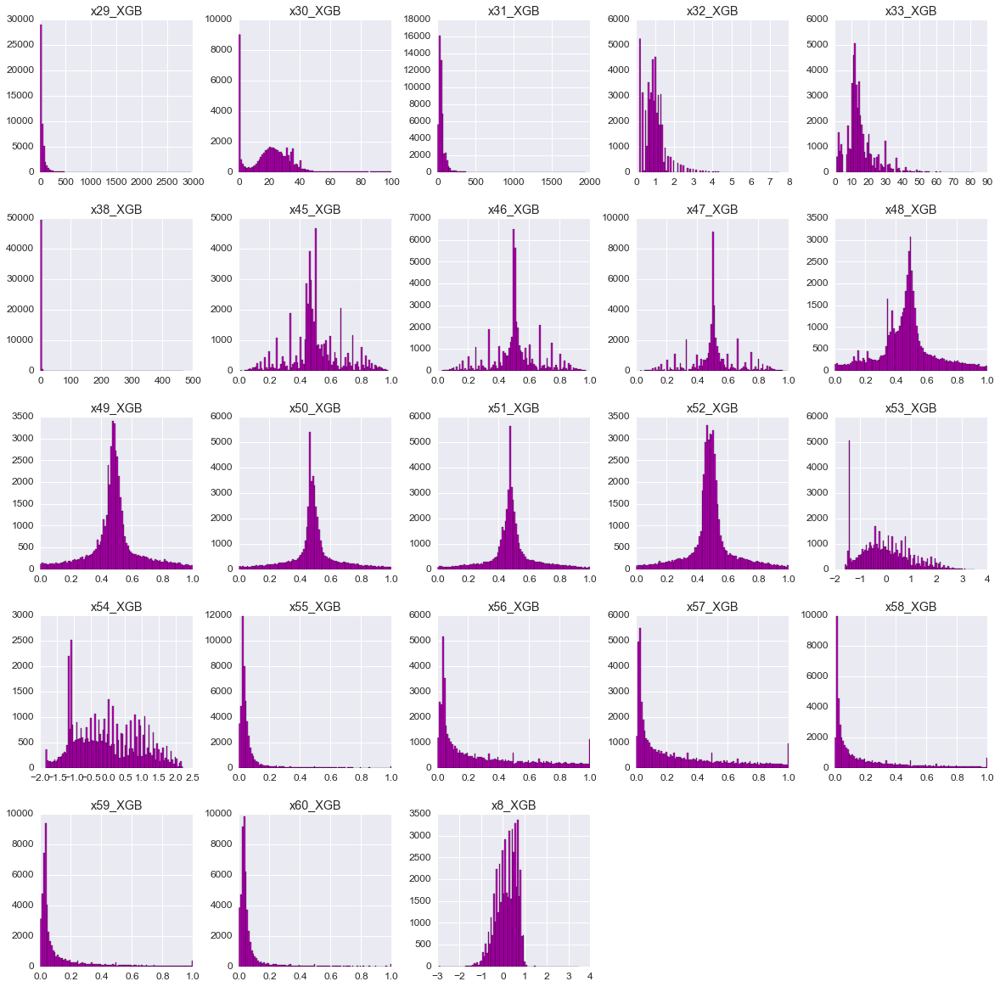

In [121]:
features_test_XGB.hist(figsize=(20, 20),bins=100,color='m');

Таким образом пропуски обработаны тремя способами - замена на медианное значение, на наиболее часто встречающееся, и также обучение RandomForestRegressor для заполнения пропусков. Попробуем выбрать какой подход оказался более подходящим обучив модель со всеми этими признаками и потом выбрав нужные через feature_importances.

In [124]:
data_train=pd.concat([data_cat,missing_data_real_median,missing_data_real_most_frequent,\
                     features_train_,data_discrete], axis=1)[~is_outlier]
Y_train=data['y'][~is_outlier]
data_train.shape

(49500, 304)

In [125]:
# отбор признаков с помощью моделей
# RandomForest не  чувствителен к мультиколлинеарным признакам
from sklearn.ensemble.forest import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=1000,max_features=25,random_state=17,verbose=1,n_jobs=-1)

forest.fit(data_train,Y_train)
importances = forest.feature_importances_

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  4.0min finished


x8_RF     0.116544
x8_mf     0.114371
x8_md     0.110637
x57_mf    0.016574
x57_md    0.016422
x56_RF    0.015305
x56_md    0.013101
x58_RF    0.012343
x56_mf    0.012242
x58_mf    0.012235
Name: importances, dtype: float64


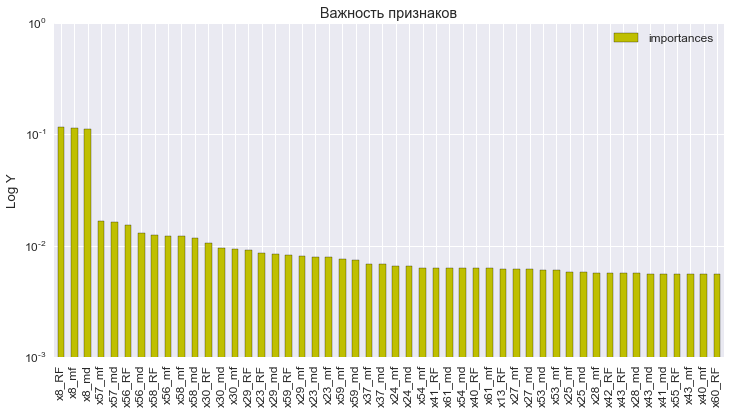

In [126]:
features_df =pd.DataFrame(data=importances, index=list(data_train.columns), columns=['importances'])
features_df.sort_values(by='importances', ascending=False, inplace=True)
print (features_df['importances'][:10])
features_df[:50].plot(kind='bar',figsize=(12,6),color='y',logy=True) #sort_columns=True
plt.ylabel("Log Y")
plt.title(u"Важность признаков");

In [127]:
data_feature_importances_=pd.DataFrame()
features=[missing_data_real_median,missing_data_real_most_frequent,features_train_]

for feature in features:    
    data_feature_importances=features_df.loc[features_df.index.isin(feature)].sort_index()
    data_feature_importances.index=[x.split('_')[0] for x in data_feature_importances.index ] 
    data_feature_importances_=pd.concat([data_feature_importances_,data_feature_importances],axis=1)
    
data_feature_importances_.reset_index(inplace=True)   
data_feature_importances_.columns=['feature','median','most_frequent','RF']    
data_feature_importances_

,feature,median,most_frequent,RF
0,x13,0.005284,0.005068,0.006229
1,x23,0.007942,0.007914,0.008665
2,x24,0.006608,0.006622,NaN
3,x25,0.005779,0.005794,NaN
4,x26,0.005389,0.005365,NaN
5,x27,0.006133,0.006182,NaN
6,x28,0.005662,0.005697,NaN
7,x29,0.008422,0.008074,0.009101
8,x30,0.009604,0.009265,0.010522
9,x31,0.004109,0.003947,0.004339


In [128]:
def f(x):
    _max=0
    if x['RF']<> np.nan and x['RF']>x['median'] and x['RF']>x['most_frequent']: 
        _max=x['feature']+'_RF'
    elif x['most_frequent']>x['median']:
        _max=x['feature']+'_mf'
    else: _max=x['feature']+'_md'    
    return _max

In [129]:
new_real_features=data_feature_importances_.apply(f, axis=1).values
new_data_real=data_train[new_real_features]
new_data_real.head()

,x13_RF,x23_RF,x24_mf,x25_mf,x26_md,x27_mf,x28_mf,x29_RF,x30_RF,x31_RF,...,x53_md,x54_mf,x55_RF,x56_RF,x57_mf,x58_RF,x59_RF,x60_RF,x61_md,x8_RF
0,3694.0,40.579612,-0.112693,-0.172191,1.166667,1.674538,0.630889,37.000000,1.294922,55.0,...,0.235333,0.264952,0.000000,0.333333,0.333333,0.333333,0.000000,0.000000,9.0,-0.688706
1,18156.0,28.765503,2.612285,2.159091,4.000000,1.710714,1.713538,0.166667,0.027669,109.0,...,1.782346,1.322409,0.011647,0.397671,0.239601,0.249584,0.068220,0.033278,601.0,0.870871
2,1178.0,24.943933,-0.814660,-0.708308,1.500000,-0.512422,-0.733967,0.333333,14.837728,11.0,...,-0.586540,0.672436,0.000000,0.606061,0.121212,0.212121,0.060606,0.000000,33.0,0.437655
3,14559.0,41.576860,-0.907833,-0.761736,0.500000,-0.627525,-0.805801,1.166667,0.004395,0.0,...,-1.600326,-1.838680,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.004439
4,5777.0,31.080282,-0.371787,-0.367616,1.666667,0.271307,0.013112,17.333333,1000.000000,33.0,...,0.960991,0.790990,0.020161,0.645161,0.258065,0.036290,0.040323,0.000000,248.0,0.480977


In [130]:
new_data_real.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\new_data_real.csv',index=False)

In [131]:
#new_data_real= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\new_data_real.csv')

In [132]:
data_test_=pd.concat([data_test_cat, missing_data_test_real_median, missing_data_test_real_most_frequent,\
                     features_test_, data_test_discrete], axis=1)
data_test_.shape

(50000, 304)

In [133]:
new_data_test_real=data_test_[new_data_real.columns]
new_data_test_real.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\new_data_test_real.csv',index=False)

In [134]:
del data_test_, data_test_cat, missing_data_test_real_median, missing_data_test_real_most_frequent,\
    features_test_, data_test_discrete

In [135]:
del data_train, data_cat, missing_data_real_median, missing_data_real_most_frequent,\
                     features_train_, data_discrete

Среди вещественных есть признаки с очень большим перекосом распределения в сторону какого-то одного значения  возможно, стоит прологарифмировать при решении задачи - x23,x24,x26,x27,x33,x36,x37,x39,x40,x41,x42. Предварительно посмотрим какие признаки принимают в том числе отрицательные значения. Значения таких признаком вместим в положительную область, что при логарифмировании не получить nan.

In [136]:
new_data_real.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
x13_RF,49500.0,4242.446534,5539.026804,0.000000,320.250000,2058.000000,5335.000000,25000.000000
x23_RF,49500.0,35.836473,6.686407,15.226228,31.000211,36.197546,40.929013,60.000000
x24_mf,49500.0,-0.070924,0.861477,-1.310465,-0.656269,-0.279976,0.235682,15.648362
x25_mf,49500.0,-0.070869,0.765683,-0.817005,-0.583950,-0.255280,0.199223,10.834796
x26_md,49500.0,3.589618,3.281249,0.000000,1.500000,2.833333,4.833333,59.833333
x27_mf,49500.0,-0.048661,0.861692,-0.791959,-0.524755,-0.317548,0.104613,9.009078
x28_mf,49500.0,-0.067975,0.825952,-0.908422,-0.600560,-0.292697,0.194751,11.685279
x29_RF,49500.0,38.795631,88.584299,0.000000,1.564430,9.666667,37.005074,1000.000000
x30_RF,49500.0,243.034759,380.344521,0.000000,0.000000,0.798991,388.728638,1000.000000
x31_RF,49500.0,40.556102,60.372152,0.000000,0.000000,24.000000,61.000000,1000.000000


In [137]:
data_real_ln=pd.DataFrame()
data_real_ln['x23_ln']=new_data_real['x23_RF'].apply(lambda x: np.log1p(x))
data_real_ln['x24_ln']=new_data_real['x24_mf']+1.32
data_real_ln['x24_ln']= data_real_ln['x24_ln'].apply(lambda x: np.log1p(x))
data_real_ln['x26_ln']=new_data_real['x26_md'].apply(lambda x: np.log1p(x))
data_real_ln['x27_ln']=new_data_real['x27_mf']+0.8
data_real_ln['x27_ln']= data_real_ln['x27_ln'].apply(lambda x: np.log1p(x))
data_real_ln['x33_ln']=new_data_real['x33_md'].apply(lambda x: np.log1p(x))
data_real_ln['x36_ln']=new_data_real['x36_mf'].apply(lambda x: np.log1p(x))
data_real_ln['x37_ln']=new_data_real['x37_mf'].apply(lambda x: np.log1p(x))
data_real_ln['x39_ln']=new_data_real['x39_RF'].apply(lambda x: np.log1p(x))
data_real_ln['x40_ln']=new_data_real['x40_RF'].apply(lambda x: np.log1p(x))
data_real_ln['x41_ln']=new_data_real['x41_RF'].apply(lambda x: np.log1p(x))
data_real_ln['x42_ln']=new_data_real['x42_RF'].apply(lambda x: np.log1p(x))
data_real_ln.head()

,x23_ln,x24_ln,x26_ln,x27_ln,x33_ln,x36_ln,x37_ln,x39_ln,x40_ln,x41_ln,x42_ln
0,3.727610,0.791773,0.773190,1.245462,2.397895,0.693147,2.302585,0.693147,3.178054,1.541159,0.113329
1,3.393350,1.595802,1.609438,1.255819,3.465736,0.693147,5.501258,0.693147,4.234107,2.904165,0.451076
2,3.255938,0.409019,0.916291,0.252763,3.218876,0.693147,3.401197,1.386294,2.484907,1.690096,0.139762
3,3.751311,0.345125,0.405465,0.159117,0.000000,2.079442,2.079442,1.386294,2.772589,2.294553,0.254642
4,3.468242,0.666913,0.980829,0.728180,1.945910,2.197225,4.691348,1.609438,4.465908,0.947789,0.048790


In [138]:
data_real_ln.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_real_ln.csv',index=False)

In [139]:
data_test_real_ln=pd.DataFrame()
data_test_real_ln['x23_ln']=new_data_test_real['x23_RF'].apply(lambda x: np.log1p(x))
data_test_real_ln['x24_ln']=new_data_test_real['x24_mf']+1.32
data_test_real_ln['x24_ln']= data_test_real_ln['x24_ln'].apply(lambda x: np.log1p(x))
data_test_real_ln['x26_ln']=new_data_test_real['x26_md'].apply(lambda x: np.log1p(x))
data_test_real_ln['x27_ln']=new_data_test_real['x27_mf']+0.8
data_test_real_ln['x27_ln']= data_test_real_ln['x27_ln'].apply(lambda x: np.log1p(x))
data_test_real_ln['x33_ln']=new_data_test_real['x33_md'].apply(lambda x: np.log1p(x))
data_test_real_ln['x36_ln']=new_data_test_real['x36_mf'].apply(lambda x: np.log1p(x))
data_test_real_ln['x37_ln']=new_data_test_real['x37_mf'].apply(lambda x: np.log1p(x))
data_test_real_ln['x39_ln']=new_data_test_real['x39_RF'].apply(lambda x: np.log1p(x))
data_test_real_ln['x40_ln']=new_data_test_real['x40_RF'].apply(lambda x: np.log1p(x))
data_test_real_ln['x41_ln']=new_data_test_real['x41_RF'].apply(lambda x: np.log1p(x))
data_test_real_ln['x42_ln']=new_data_test_real['x42_RF'].apply(lambda x: np.log1p(x))
#data_test_real_ln.head()

In [140]:
data_test_real_ln.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_real_ln.csv',index=False)

In [141]:
del data_test_real_ln, data_real_ln # чистим память

Ранее было замечено, что сумма признаков х55+...+х60 =1. Следовательно эти признаки отображают  какие-то доли целого. Создадим новые отдельные бинарные признаки которые будут показывать предельные значения долей - 10% и 90%.

Далее предположим, что в признаках есть определенный порядок и следующий признак x61 имеет отношения к признакам х55-х60, поэтому создадим новый признаки перемножив х55-х60 с x61.

In [142]:
# x55_RF x56_RF x57_mf x58_RF x59_RF x60_RF x61_md
level_top=0.9
level_bottom=0.1

data_real_53_61=pd.DataFrame()
data_test_real_53_61=pd.DataFrame()

for col in ['x55_RF','x56_RF','x57_mf','x58_RF','x59_RF','x60_RF']:
    data_real_53_61['mostly_'+col]=(new_data_real[col]>=level_top)*1
    data_real_53_61['less_'+col]=  (new_data_real[col]<=level_bottom)*1
    
    data_test_real_53_61['mostly_'+col]=(new_data_test_real[col]>=level_top)*1
    data_test_real_53_61['less_'+col]=  (new_data_test_real[col]<=level_bottom)*1
    
    
for col in ['x55_RF','x56_RF','x57_mf','x58_RF','x59_RF','x60_RF']:
    data_real_53_61[col+' * x61']=new_data_real['x61_md']*new_data_real[col]
    data_test_real_53_61[col+' * x61']=new_data_test_real['x61_md']*new_data_test_real[col]
    
data_real_53_61['sum_x53_x54']= new_data_real.ix[:, 'x53_md':'x54_mf'].sum(axis=1)
data_test_real_53_61['sum_x53_x54']= new_data_test_real.ix[:, 'x53_md':'x54_mf'].sum(axis=1)

data_real_53_61.shape

(49500, 19)

In [143]:
data_real_53_61.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_real_53_61.csv',index=False)
data_test_real_53_61.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_real_53_61.csv',index=False)

In [144]:
del data_real_53_61, data_test_real_53_61

Таким образом отбор признаков через отбор подходящего способа заполнения пропусков проводится раньше.

####  Построение категориальных признаков

In [1]:
# https://alexanderdyakonov.wordpress.com/2016/08/03/python-%D0%BA%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5-%D0%BF%D1%80%D0%B8%D0%B7%D0%BD%D0%B0%D0%BA%D0%B8/

Воспользуемся методом похожим на LabelEncoder. LabelEncoder - каждой категории сопоставляет некоторое целое число (собственно, номер категории). Метод сильно упрощает данные, фактически проецируя категориальный признак на вещественную прямую. Весь смысл категориальности теряется. Более того, появляются ложные интерпретации поскольку между  значениями объектов признака появляются явления порядка. Зададим значения каждой категории в зависимости от частоты категории в каждом признаке.

In [12]:
data_cat_LE=pd.DataFrame()
data_test_cat_LE=pd.DataFrame()

for col in cat_features:
    data_cat_LE[col+'_LE'] = data[col].map(data[col].value_counts()).rank(method = 'dense')
    # для тестовой выборки нужно мапить из тренировочной порядок частот на тестовую выборку
    data_test_cat_LE[col+'_LE'] = data_test[col].map(data[col].value_counts()).rank(method = 'dense')
    
data_cat_LE.fillna(0,inplace=True) 
data_test_cat_LE.fillna(0,inplace=True)

In [15]:
data_cat_LE.head()

,x0_LE,x1_LE,x2_LE,x3_LE,x4_LE,x5_LE,x9_LE,x10_LE,x11_LE,x12_LE,x14_LE,x15_LE,x16_LE,x17_LE,x18_LE,x19_LE,x20_LE,x21_LE,x22_LE
0,67.0,10.0,2.0,2.0,4.0,6.0,4.0,3.0,4.0,7.0,30.0,2.0,10.0,65.0,134.0,12.0,66.0,20.0,8.0
1,75.0,10.0,2.0,2.0,5.0,6.0,6.0,61.0,3.0,4.0,16.0,2.0,10.0,58.0,12.0,8.0,57.0,38.0,8.0
2,72.0,10.0,2.0,2.0,5.0,6.0,6.0,31.0,4.0,7.0,26.0,2.0,7.0,38.0,7.0,10.0,50.0,4.0,8.0
3,65.0,10.0,2.0,2.0,4.0,6.0,7.0,142.0,4.0,7.0,30.0,2.0,10.0,65.0,148.0,9.0,64.0,40.0,8.0
4,71.0,10.0,2.0,2.0,5.0,6.0,4.0,50.0,4.0,7.0,30.0,2.0,9.0,61.0,67.0,12.0,66.0,148.0,8.0


In [70]:
data_cat_LE.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_cat_LE.csv',index=False)
data_test_cat_LE.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_cat_LE.csv',index=False)

Категориальные признаки распределены по столбцам x0-x22 и столбцы содержат повторяющиеся значения. В данном решении категориальный признак получает ранг в зависимости от частоты значения в рамках одного признака. По учитывая что значения признаков повторяются в столбцах, можно было присваивать ранг определенный как частота среди всех категориальных признаков x0-x22.

Добавим признак явлющийся конъюнкцией двух категориальных признаков — это признак, значениями которого являются пары (значение первого признака, значение второго признака)

In [16]:
from itertools import combinations

data_cat_conj=pd.DataFrame()
data_test_cat_conj=pd.DataFrame()
#data_cat_conj_=data
#.fillna('Missing',inplace=True)

for col in combinations(cat_features, 2):
    new_col=col[0]+'+'+col[1]
    data_cat_conj[new_col]=data[col[0]].fillna('Missing').astype(str)+' + '\
                          +data[col[1]].fillna('Missing').astype(str) 
    data_test_cat_conj[new_col]=data_test[col[0]].fillna('Missing').astype(str)+' + '\
                               +data_test[col[1]].fillna('Missing').astype(str)
    
    # если применить потом pd.get_dummies(data_cat_conj) то таблица сильно разрастется
    # поэтому сделаем также как выше 'упорядоченным'  LabelEncoder    
    #data_cat_conj[new_col] = data_cat_conj[new_col].map(data_cat_conj[new_col].value_counts()).rank(method = 'dense') 
        
data_cat_conj.shape  

(50000, 171)

In [19]:
rank_train_pairs_cat=pd.Series(data_cat_conj.values.flatten()).value_counts().rank(method = 'dense')
rank_test_pairs_cat=pd.Series(data_test_cat_conj.values.flatten()).value_counts().rank(method = 'dense')

Посмотрим частоту тех значений  категориальных признаков которые есть data_cat_conj но при этом которых нет в  data_test_cat_conj. Заметно, что их частота равна 1-2. Следовательно при замене значения признака на его частоту в таблице data_test_cat_conj для случая отсутствия такой комбинации признака в словаре rank_train_pairs_cat будем "мапить" значение равное 1.

In [73]:
have_test_no_train=set.difference(set(rank_test_pairs_cat.index),set(rank_train_pairs_cat.index))
have_test_no_train

{u'0fb403ffc2 + f175cda25f',
 u'49d01e6cb0 + 37afb36cff',
 u'ccce61f2b1 + f8d15f46c6',
 u'e5d2769258 + 91bb549494',
 u'c5496d14b5 + 9aba4d7f51',
 u'718c61545b + 73e5a18114',
 u'ff13ccf4d7 + 9791b17262',
 u'66af51a975 + 3a1940d56c',
 u'4b9480aa42 + 94aae9c561',
 u'd3e6da1933 + c831fe3033',
 u'5abfcdfebd + ae80b21c3e',
 u'58ed4cabfa + 87550a73c7',
 u'c26d08129a + b744c1b78e',
 u'06ca426ecf + 9aba4d7f51',
 u'4c465e7362 + d34785a954',
 u'4714082780 + cf6da76068',
 u'a4732a8251 + 428af3a732',
 u'c96294cb7b + d3dc404c37',
 u'fcfc26ce60 + e2a1f26309',
 u'3e5e63c335 + c82c3dbd33',
 u'6e40247e69 + 636759d87f',
 u'bed0054bc0 + 17c99905b6',
 u'ca63304de0 + ac4a91d50a',
 u'e33c63cf35 + 2acc0f2d72',
 u'16a14a2d17 + 7e40a7080a',
 u'91bb549494 + ab7ef0b07a',
 u'5bdad3f199 + 4b2cf086a2',
 u'76ba95d208 + dc20727c2f',
 u'f7de6b0645 + 6a9dcc8260',
 u'eb406586d8 + 51cb50837c',
 u'a875e81ace + 5fa0f58e70',
 u'22bdec3859 + fb35c3bc8f',
 u'45f0880562 + 33d494cf1c',
 u'48b3e778f8 + 27721d693c',
 u'b4d8a653ea 

In [77]:
rank_test_pairs_cat[have_test_no_train]

0fb403ffc2 + f175cda25f    2.0
49d01e6cb0 + 37afb36cff    1.0
ccce61f2b1 + f8d15f46c6    1.0
e5d2769258 + 91bb549494    1.0
c5496d14b5 + 9aba4d7f51    1.0
718c61545b + 73e5a18114    3.0
ff13ccf4d7 + 9791b17262    1.0
66af51a975 + 3a1940d56c    1.0
4b9480aa42 + 94aae9c561    1.0
d3e6da1933 + c831fe3033    1.0
5abfcdfebd + ae80b21c3e    1.0
58ed4cabfa + 87550a73c7    1.0
c26d08129a + b744c1b78e    1.0
06ca426ecf + 9aba4d7f51    1.0
4c465e7362 + d34785a954    1.0
4714082780 + cf6da76068    1.0
a4732a8251 + 428af3a732    1.0
c96294cb7b + d3dc404c37    2.0
fcfc26ce60 + e2a1f26309    2.0
3e5e63c335 + c82c3dbd33    1.0
6e40247e69 + 636759d87f    1.0
bed0054bc0 + 17c99905b6    1.0
ca63304de0 + ac4a91d50a    1.0
e33c63cf35 + 2acc0f2d72    2.0
16a14a2d17 + 7e40a7080a    2.0
91bb549494 + ab7ef0b07a    1.0
5bdad3f199 + 4b2cf086a2    1.0
76ba95d208 + dc20727c2f    1.0
f7de6b0645 + 6a9dcc8260    1.0
eb406586d8 + 51cb50837c    1.0
                          ... 
f8b1b88062 + 60299bc448    1.0
94671bcb

In [20]:
%time
for col in data_cat_conj:
    data_cat_conj[col] = data_cat_conj[col].map(rank_train_pairs_cat) 
    data_test_cat_conj[col] = data_test_cat_conj[col].\
                            apply(lambda x: rank_train_pairs_cat[x] if x in rank_train_pairs_cat.index else 1) 

Wall time: 0 ns


In [24]:
data_cat_conj.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_cat_conj.csv',index=False)
data_test_cat_conj.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_cat_conj.csv',index=False)

Применим смешанное кодирование - когда значение категориальной переменной будем кодировать средним значением по каждой уникальной переменной категориального признака.

In [25]:
is_outlier=(np.loadtxt('C:\\Users\\Pavel_2\\HSE\\Beeline\\is_outlier.csv')).astype(bool)
new_data_real= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\new_data_real.csv') 
new_data_test_real= pd.read_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\new_data_test_real.csv') 

In [47]:
def means_mapping(data, data_means,real_features, cat_features, func = 'mean'):
    if type(cat_features) != list: # groupby делается по cat_feature который м.б. как один так и несколько признаков
        cat_features = [cat_features]
    name = '{0}_by_{1}_mean'.format(real_features, cat_features)
    grp = data_means.groupby(cat_features)[[real_features]].agg(func)
    grp.columns = [name]
    # для каждой уникальной переменной будем мапить её среднее значение числового признака полученного через groupby
    return pd.merge(data[cat_features], grp, left_on = cat_features, right_index = True, how = 'left')[name]

Построим корреляцию 'новых' числовых признаков с целевой переменной. Поскольку используются подгруженные данные, то в data[y] необходимо сбросить индекс через reset_index, иначе будут некорректные значения корреляции

x8_RF     0.340569
x30_RF    0.338121
x56_RF    0.246816
x34_RF    0.215457
x35_RF    0.209959
x13_RF    0.198769
x23_RF    0.172498
x32_RF    0.156383
x43_RF    0.155211
x44_RF    0.150951
dtype: float64


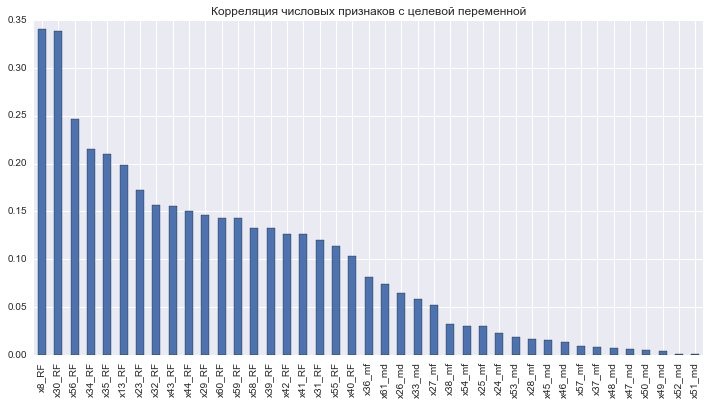

In [48]:
corr_df= np.abs(new_data_real.corrwith(data['y'][~is_outlier].reset_index(drop=True), axis=0, drop=False))\
                .sort_values(ascending=False)
print (corr_df[:10])
corr_df.plot(kind='bar',figsize=(12,6));
plt.title(u"Корреляция числовых признаков с целевой переменной");

Для каждой категориальной переменной с количеством уникальных значений больше 2 применим смешанное кодирование средним значением 10 лучших с точки зрения корреляции с целевым признаком, числовых переменных.

In [58]:
# https://github.com/btbpanda/Tinkoff-boosters-2nd-place-/blob/master/lightgbm_new_logloss_4_fs.py#L146
data_means_map=pd.DataFrame()
data_test_means_map=pd.DataFrame()

data_means_=pd.concat([data[cat_features].fillna('Missing')[~is_outlier].reset_index(drop=True), new_data_real], axis=1) 
data_test_means_=pd.concat([data_test[cat_features].fillna('Missing'), new_data_test_real], axis=1)

for best_real_features in corr_df[:10].index:
    for col_cat_features in cat_features:
        if len(data[col_cat_features ].value_counts())>2:  
            # можно сразу нормировать 
            #data_means_map_= data[best_real_features]/means_mapping(best_real_features, col_cat_features)
            
            data_means_map_= means_mapping(data_means_,data_means_, best_real_features, col_cat_features)
            data_test_means_map_= means_mapping(data_test_means_,data_means_, best_real_features, col_cat_features)
            
            data_means_map = pd.concat([data_means_map,data_means_map_], axis=1) 
            data_test_means_map = pd.concat([data_test_means_map,data_test_means_map_], axis=1) 
            
data_means_map.fillna(mean,inplace=True)

В data_test_means_map могут быть Nan. Заменим их на mean столбцов из data_means_map

In [61]:
for col in data_test_means_map:
    median=data_means_map[col].mean()        
    data_test_means_map[col]=data_test_means_map[col].apply(lambda x : median if pd.isnull(x) else x)

In [59]:
data_means_map.head()

,x8_RF_by_['x0']_mean,x8_RF_by_['x1']_mean,x8_RF_by_['x4']_mean,x8_RF_by_['x5']_mean,x8_RF_by_['x9']_mean,x8_RF_by_['x10']_mean,x8_RF_by_['x11']_mean,x8_RF_by_['x12']_mean,x8_RF_by_['x14']_mean,x8_RF_by_['x16']_mean,...,x44_RF_by_['x11']_mean,x44_RF_by_['x12']_mean,x44_RF_by_['x14']_mean,x44_RF_by_['x16']_mean,x44_RF_by_['x17']_mean,x44_RF_by_['x18']_mean,x44_RF_by_['x19']_mean,x44_RF_by_['x20']_mean,x44_RF_by_['x21']_mean,x44_RF_by_['x22']_mean
0,0.104787,-0.004662,0.005020,-0.005663,0.101010,0.091082,0.059461,0.058804,-0.157366,-0.051461,...,1.400524,1.40421,1.246426,1.272594,1.221962,1.189590,1.609646,1.630094,1.360000,1.268578
1,0.339187,-0.004662,-0.001151,-0.005663,0.239772,0.210590,-0.117520,-0.102284,0.285399,-0.051461,...,1.148171,1.27147,1.620311,1.272594,1.293006,2.416667,1.024681,1.062611,0.972973,1.268578
2,0.182980,-0.004662,-0.001151,-0.005663,0.239772,0.330050,0.059461,0.058804,0.306855,0.294950,...,1.400524,1.40421,1.391229,1.341301,1.272650,1.742857,1.125848,0.992683,0.500000,1.268578
3,0.101429,-0.004662,0.005020,-0.005663,-0.363536,-0.076891,0.059461,0.058804,-0.157366,-0.051461,...,1.400524,1.40421,1.246426,1.272594,1.221962,1.166566,1.058066,1.056395,0.925000,1.268578
4,0.145871,-0.004662,-0.001151,-0.005663,0.101010,0.145810,0.059461,0.058804,-0.157366,0.192778,...,1.400524,1.40421,1.246426,1.295636,1.315514,1.594030,1.609646,1.630094,1.661627,1.268578


In [65]:
data_means_map.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_means_map.csv',index=False)
data_test_means_map.to_csv('C:\\Users\\Pavel_2\\HSE\\Beeline\\data_test_means_map.csv',index=False)

In [66]:
data_means_map.select_dtypes(include=['object']).columns.values.tolist()

[]

In [185]:
for col in data_means_map.columns:
    print("{0}, num. NA's: {1}".format(col, pd.isnull(data_means_map[col]).sum()))

x8_RF_by_['x0']_mean, num. NA's: 0
x8_RF_by_['x1']_mean, num. NA's: 0
x8_RF_by_['x4']_mean, num. NA's: 0
x8_RF_by_['x5']_mean, num. NA's: 0
x8_RF_by_['x9']_mean, num. NA's: 0
x8_RF_by_['x10']_mean, num. NA's: 0
x8_RF_by_['x11']_mean, num. NA's: 0
x8_RF_by_['x12']_mean, num. NA's: 0
x8_RF_by_['x14']_mean, num. NA's: 0
x8_RF_by_['x16']_mean, num. NA's: 0
x8_RF_by_['x17']_mean, num. NA's: 0
x8_RF_by_['x18']_mean, num. NA's: 0
x8_RF_by_['x19']_mean, num. NA's: 0
x8_RF_by_['x20']_mean, num. NA's: 0
x8_RF_by_['x21']_mean, num. NA's: 0
x8_RF_by_['x22']_mean, num. NA's: 0
x30_RF_by_['x0']_mean, num. NA's: 0
x30_RF_by_['x1']_mean, num. NA's: 0
x30_RF_by_['x4']_mean, num. NA's: 0
x30_RF_by_['x5']_mean, num. NA's: 0
x30_RF_by_['x9']_mean, num. NA's: 0
x30_RF_by_['x10']_mean, num. NA's: 0
x30_RF_by_['x11']_mean, num. NA's: 0
x30_RF_by_['x12']_mean, num. NA's: 0
x30_RF_by_['x14']_mean, num. NA's: 0
x30_RF_by_['x16']_mean, num. NA's: 0
x30_RF_by_['x17']_mean, num. NA's: 0
x30_RF_by_['x18']_mean, num

In [67]:
#del data_cat_LE, data_cat_conj, data_means_map, data_means_
del data_test_cat_LE, data_test_cat_conj, data_test_means_map, data_test_means_, data_test_means_map

NameError: name 'data_test_cat_LE' is not defined

####  Построение новых признаков с использованием целевой переменной

In [186]:
# https://www.youtube.com/watch?v=g335THJxkto
# https://www.slideshare.net/rusbase/icbda15-1-kaggle-icbda2016
# https://www.youtube.com/watch?v=np_KY9NlPuQ
# https://github.com/btbpanda/Tinkoff-boosters-2nd-place-

Не удалось реализовать. Код работает только для  бинарной классификации. Вариант - разложить целевую переменную через LabelBinarizer

### Визуализация с помощью понижения размерности

Воспользуемся средствами понижения размерности. Для задачи с дискретным целевым признаком это позволит понять, какие классы хорошо разделяются, а какие - нет. Такие методы строят матрицу попарных расстояний между объектами, которая в случае, когда объектов много, будет занимать много памяти. Кроме того, отображать много точек на scatter plot (а именно его используют для визуализации результата понижения размерности) неудобно. Поэтому мы перемешаем выборку (и далее будем использовать ее) и выберем первые 5000 объектов для понижения размерности.

Если методы визуализации хорошо разведут классы, то будем использовать полученные значения х,y как новые признаки.

In [187]:
data_train=pd.concat([data_cat,missing_data_real_median,data_discrete], axis=1)[~is_outlier]
data_train.shape

(49500, 243)

In [188]:
Y_train=data['y'][~is_outlier]

Воспользуемся первоначально линейным методом понижения размерности - методом главных компонент

In [189]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap

scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_train)
pca = PCA(n_components=0.9).fit_transform(X_scaled)#будем объяснять 90% выборки
pca.shape

(49500L, 143L)

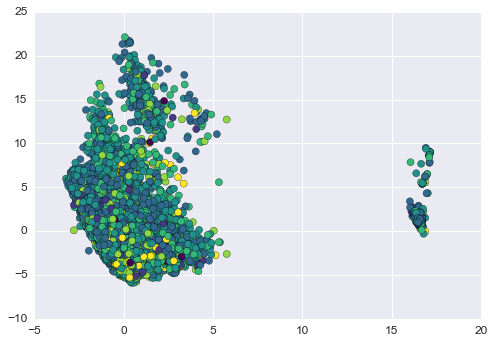

In [190]:
plt.scatter(pca[:, 0], pca[:, 1], c=Y_train,  s=50, cmap='viridis');

Методы sklearn не принимают матрицы с пропусками (nan). Чтобы избежать этой проблемы, не будем рассматривать признаки, которые имеют много пропусков. Кроме того, ограничимся рассмотрением вещественных признаков. В следующей ячейке мы отбираем нужные признаки, затем находим объекты, у которых все признаки известны (нет пропусков в выбранных признаках), а затем создаем отдельно матрицу объекты-признаки для работы методов понижения размерности и отдельно вектор правильных ответов на этих объектах: data_subset и response_subset. Кроме того, мы дополнительно стандартизуем нашу маленькую выборку (scale), потому что методы понижения размерности очень чувствительны к разномасштабным данным (это отдельно указано в туториале в sklearn)

In [191]:
from sklearn.utils import shuffle
from sklearn.preprocessing import scale
# перемешиваем данные так чтобы при уменьшении выборки (до 5000 объектов) она оставалась сбалансированной
sdata = shuffle(data, random_state=17) # работаем с сырым датасетом, не data_train котороый  был PCA

In [223]:
subset_l  = 5000
selected_features = real_features+discrete_features
# не будем рассматривать объекты  которые имеют пропуски
objects_with_nan = sdata.index[np.any(np.isnan(sdata[selected_features].values), axis=1)] 
data_subset = scale(sdata[selected_features].drop(objects_with_nan, axis=0)[:subset_l])
response_subset = sdata["y"].drop(objects_with_nan, axis=0)[:subset_l]

Проверим сбалансированность выборки

In [224]:
from collections import Counter
print (Counter(data["y"][:5000]))
print (Counter(response_subset))

Counter({2: 1582, 3: 1421, 4: 1011, 5: 550, 1: 217, 6: 177, 0: 42})
Counter({2: 1551, 3: 1458, 4: 1044, 5: 534, 1: 190, 6: 182, 0: 41})


Будем строить визуализацию методами t-SNE, MDS, IsoMap

http://scikit-learn.org/stable/modules/manifold.html#

In [226]:
from sklearn.manifold import TSNE
import matplotlib.cm as cm # импортируем цветовые схемы, чтобы рисовать графики.

Методы понижения размерности имеют такой же интерфейс, как классификаторы и регрессоры. Для построения визуализации t-SNE нужно создать объект класса и вызвать его метод fit_transform, который вернет матрицу размера число объектов x новая размерность; по умолчанию новая размерность равна 2. 

In [227]:
tsne_cos=TSNE(n_components=2,init='random',metric='cosine',random_state=321) 
tsne_representation=tsne_cos.fit_transform(data_subset)

Визуализируем полученное представление. Для этого создадим набор цветов по количеству классов, а затем в цикле по классам будем отображать представления точек, относящихся к этому классу. Будем указывать параметр alpha=0.5, чтобы сделать точки полупрозрачными, это лучше в ситуации, когда точки накладываются.

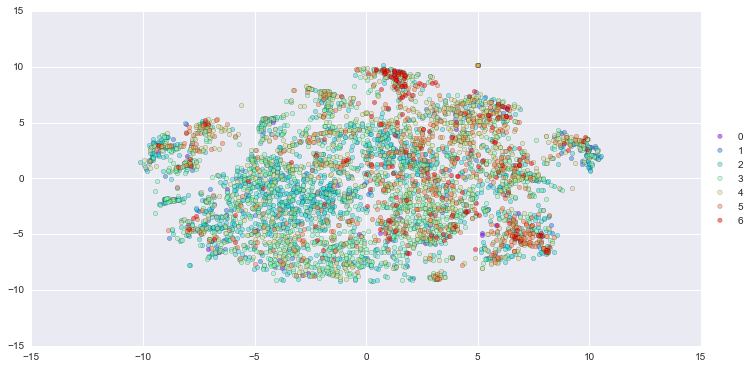

In [228]:
colors = cm.rainbow(np.linspace(0, 1, len(set(response_subset))))
plt.figure(figsize=(12,6))
for y, c in zip(set(response_subset), colors):
    plt.scatter(tsne_representation[response_subset.values==y, 0], 
                tsne_representation[response_subset.values==y, 1], c=c, alpha=0.5, label=str(y))

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

Попробуем выделить области классов (2) и (3)

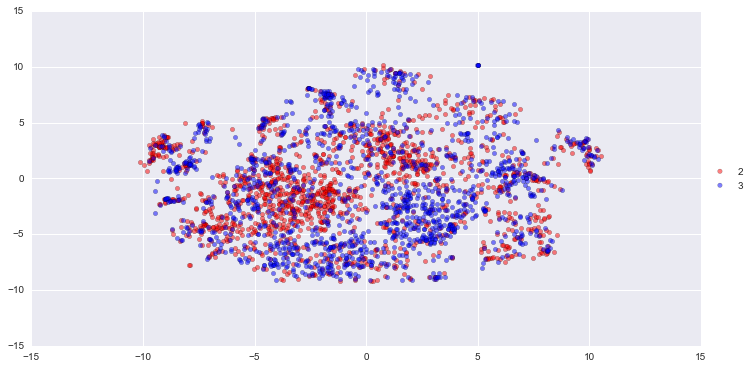

In [229]:
plt.figure(figsize=(12,6))
plt.scatter(tsne_representation[response_subset.values[:subset_l]==2, 0], 
                tsne_representation[response_subset.values[:subset_l]==2, 1], 
                c='r', alpha=0.5, label='2')
plt.scatter(tsne_representation[response_subset.values[:subset_l]==3, 0], 
                tsne_representation[response_subset.values[:subset_l]==3, 1], 
                c='b', alpha=0.5, label='3');
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

Попробуем выделить области классов (0,1) и(5,6)

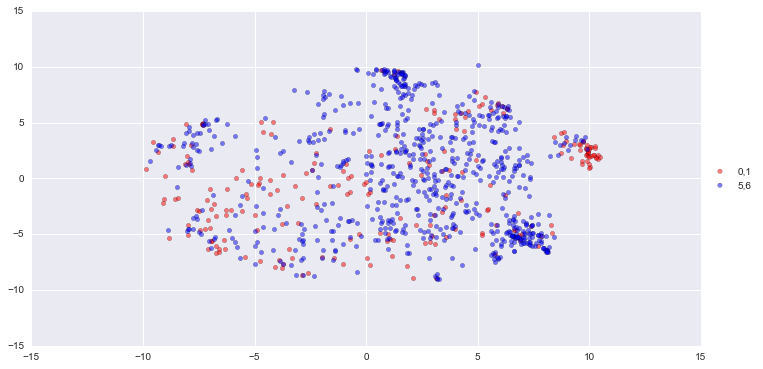

In [230]:
plt.figure(figsize=(12,6))
plt.scatter(tsne_representation[response_subset.values[:subset_l]<=1, 0], 
                tsne_representation[response_subset.values[:subset_l]<=1, 1], 
                c='r', alpha=0.5, label='0,1')
plt.scatter(tsne_representation[response_subset.values[:subset_l]>=5, 0], 
                tsne_representation[response_subset.values[:subset_l]>=5, 1], 
                c='b', alpha=0.5, label='5,6');
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

Обращает внимание концентрация классов (0,1) в области (10,2), но говорит о достаточном разделении классов или групп классов нельзя.

Теперь сделаем то же с MDS

In [233]:
from sklearn.manifold import MDS
from sklearn.metrics.pairwise import pairwise_distances

mds = MDS(n_components = 2, n_init = 4, max_iter = 300, random_state=17)
# задача оптимизации решается не более чем за max_iter итераций
# n_ini Number of TIME the smacof algorithm will be run with different initialisation    
MDS_transformed = mds.fit_transform(data_subset)

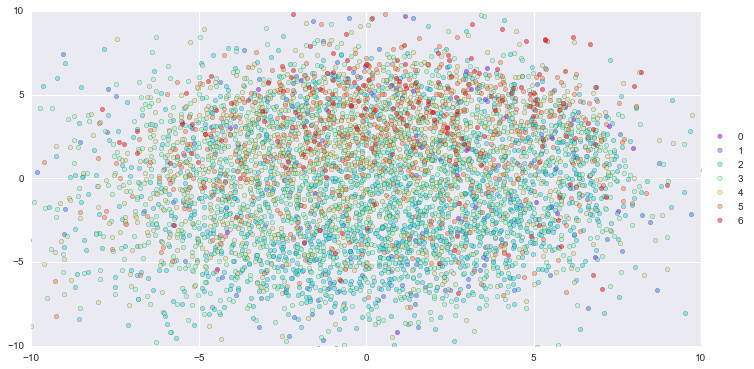

In [234]:
colors = cm.rainbow(np.linspace(0, 1, len(set(response_subset))))
plt.figure(figsize=(12,6))
for y, c in zip(set(response_subset), colors):
    plt.scatter(MDS_transformed[response_subset.values==y, 0], 
                MDS_transformed[response_subset.values==y, 1], 
                c=c, alpha=0.5, label=str(y))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));
plt.xlim(-10, 10)   # масса точек концентрируется в этом масштабе
plt.ylim(-10, 10) ;  # рекомендуем сначала отобразить визуализацию целиком, а затем раскомментировать эти строки.

Попробуем выделить области классов (2) и (3)

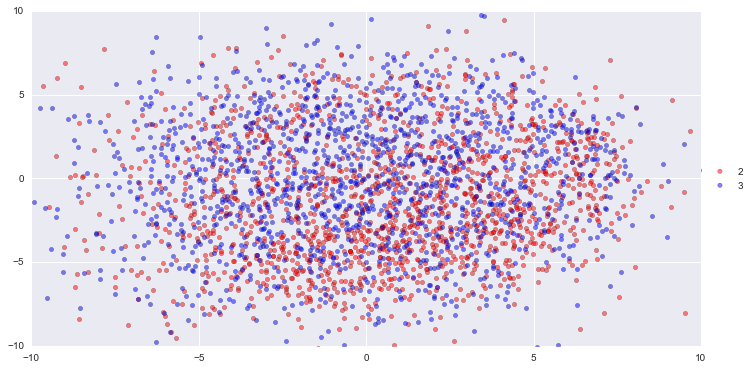

In [235]:
plt.figure(figsize=(12,6))
plt.scatter(MDS_transformed[response_subset.values[:subset_l]==2, 0], 
                MDS_transformed[response_subset.values[:subset_l]==2, 1], 
                c='r', alpha=0.5, label='2')
plt.scatter(MDS_transformed[response_subset.values[:subset_l]==3, 0], 
                MDS_transformed[response_subset.values[:subset_l]==3, 1], 
                c='b', alpha=0.5, label='3');
plt.xlim(-10, 10)   # масса точек концентрируется в этом масштабе
plt.ylim(-10, 10) 
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

Попробуем выделить области классов  (0,1) и(5,6)

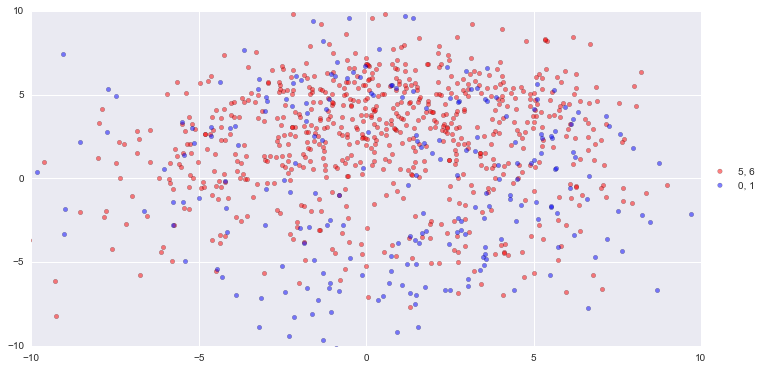

In [236]:
plt.figure(figsize=(12,6))
plt.scatter(MDS_transformed[response_subset.values[:subset_l]>=5, 0], 
                MDS_transformed[response_subset.values[:subset_l]>=5, 1], 
                c='r', alpha=0.5, label='5, 6')
plt.scatter(MDS_transformed[response_subset.values[:subset_l]<=1, 0], 
                MDS_transformed[response_subset.values[:subset_l]<=1, 1], 
                c='b', alpha=0.5, label='0, 1');
plt.xlim(-10, 10)   # масса точек концентрируется в этом масштабе
plt.ylim(-10, 10) 
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

Для построения представления можно пробовать разные метрики, их список доступен в документации scipy (потому что sklearn использует метрики scipy). В t_SNE метрику можно указать при создании объекта класса TSNE, в MDS это реализуется несколько сложнее. Нужно указать dissimilarity="precomputed", а в fit_transform подать не матрицу объектов, а матрицу попарных расстояний между объектами. Создать ее можно с помощью функции pairwise_distances с параметрами: матрица объектов, метрика.

In [238]:
mds2 = MDS(n_components = 2, n_init = 4, max_iter = 300, random_state=321,dissimilarity="precomputed")
matrix_dist=pairwise_distances (data_subset, metric='cosine')
# - From scikit-learn: ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']
MDS_transformed_cos = mds2.fit_transform(matrix_dist)

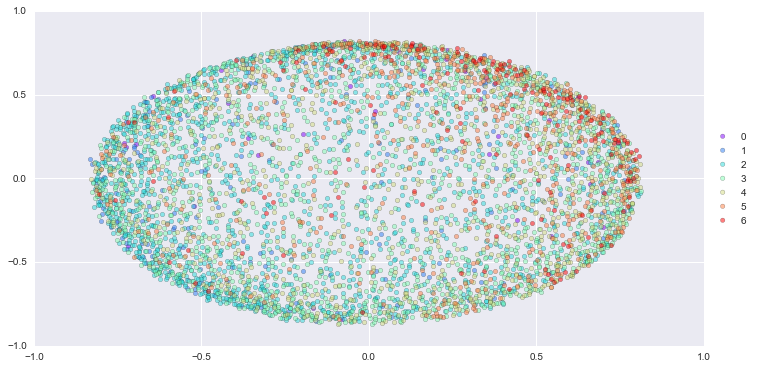

In [239]:
colors = cm.rainbow(np.linspace(0, 1, len(set(response_subset))))
plt.figure(figsize=(12,6))
for y, c in zip(set(response_subset), colors):
    plt.scatter(MDS_transformed_cos[response_subset.values[:subset_l]==y, 0], 
                MDS_transformed_cos[response_subset.values[:subset_l]==y, 1], 
                c=c, alpha=0.5, label=str(y))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

Попробуем выделить области классов (0,1) и (5,6)

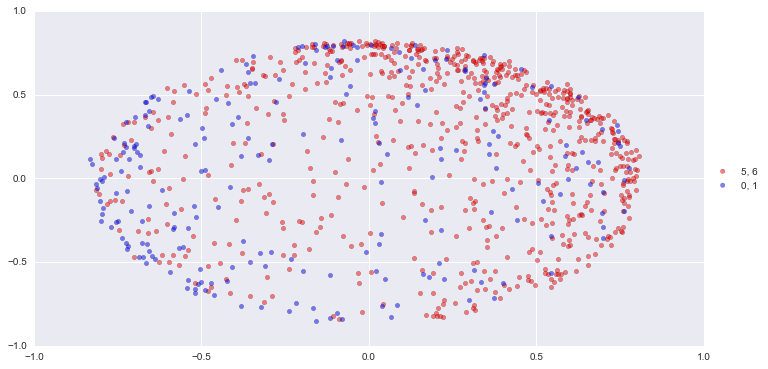

In [240]:
plt.figure(figsize=(12,6))
plt.scatter(MDS_transformed_cos[response_subset.values[:subset_l]>=5, 0], 
                MDS_transformed_cos[response_subset.values[:subset_l]>=5, 1], 
                c='r', alpha=0.5, label='5, 6')
plt.scatter(MDS_transformed_cos[response_subset.values[:subset_l]<=1, 0], 
                MDS_transformed_cos[response_subset.values[:subset_l]<=1, 1], 
                c='b', alpha=0.5, label='0, 1');
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

визуально можно заметить выделение 5/6 классов целевой метки в верхней правой области распределения при использовании  MDS c косунусной метрикой расстояний.

In [241]:
from sklearn.manifold import Isomap
ISO_transformed = Isomap(n_neighbors=7, n_components=2,n_jobs=-1).fit_transform(data_subset)

(-20, 20)

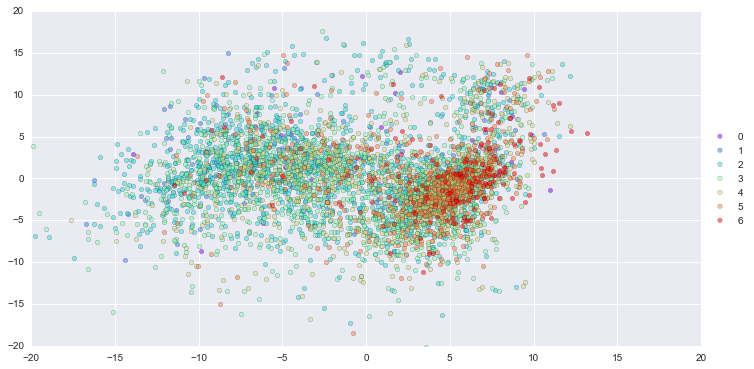

In [244]:
colors = cm.rainbow(np.linspace(0, 1, len(set(response_subset))))
plt.figure(figsize=(12,6))
for y, c in zip(set(response_subset), colors):
    plt.scatter(ISO_transformed[response_subset.values[:subset_l]==y, 0], 
                ISO_transformed[response_subset.values[:subset_l]==y, 1], 
                c=c, alpha=0.5, label=str(y))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));
plt.xlim(-20, 20)   # масса точек концентрируется в этом масштабе
plt.ylim(-20, 20) 

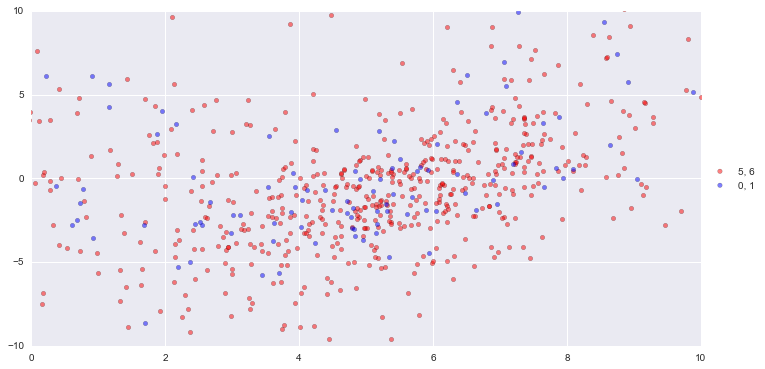

In [248]:
plt.figure(figsize=(12,6))
plt.scatter(ISO_transformed[response_subset.values[:subset_l]>=5, 0], 
                ISO_transformed[response_subset.values[:subset_l]>=5, 1], 
                c='r', alpha=0.5, label='5, 6')
plt.scatter(ISO_transformed[response_subset.values[:subset_l]<=1, 0], 
                ISO_transformed[response_subset.values[:subset_l]<=1, 1], 
                c='b', alpha=0.5, label='0, 1');
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));
plt.xlim(0, 10)   # масса точек концентрируется в этом масштабе
plt.ylim(-10, 10);

Ни один из используемых методов не разделяет достаточно хорошо области объектов с одинаковой целевой переменной. Как следствие нельзя использовать полученные вектора x,y  как новые признаки.